## AIM: Train baseline multiclass classification models for predicting the psychiatric diagnosis based on EEG features

SVC, RanFor & GradientBoostingClassifier for predicting psychiatric diagnosis with statistical features of the power per frequency band per channel group (frontal, central, parietal, occipital). Statistical features are calculated with EC data, EO data and a with the ratio between EC divided by EO. Compared to older versions of this notebook; gender will not be used as a feature, and the data will be subsampled by diagnosis, to rebalance the dataset.

In [1]:
import numpy as np
import pandas as pd
import sklearn
import pickle
import mne
import os
import matplotlib.pyplot as plt
from mne.time_frequency import tfr_multitaper

%matplotlib inline

# prevent extensive logging
mne.set_log_level('WARNING')

### Loading in feature data

In [2]:
df_features = pd.read_pickle('df_stat_features.pkl')
df_features['age'] = df_features['age'].round().astype('Int32') # round age to nearest year and convert to int
df_features = df_features.dropna(subset=['diagnosis'])
df_features.sample(7)

,ID,age,gender,diagnosis,epoch,EO_frontal_delta_std,EO_frontal_delta_mean,EO_frontal_delta_median,EO_frontal_delta_skew,EO_frontal_delta_kurt,...,ratio_parietal_gamma_std,ratio_parietal_gamma_mean,ratio_parietal_gamma_median,ratio_parietal_gamma_skew,ratio_parietal_gamma_kurt,ratio_occipital_gamma_std,ratio_occipital_gamma_mean,ratio_occipital_gamma_median,ratio_occipital_gamma_skew,ratio_occipital_gamma_kurt
223,sub-87967013,65,1.0,SMC,8,0.370642,-0.151693,-0.149490,-0.274237,0.286823,...,0.992722,0.967886,1.013657,1.326501,2.647673,1.120808,1.285148,1.400282,0.499586,0.006289
151,sub-87966609,73,1.0,SMC,8,0.388506,-0.152437,-0.158378,-0.455804,0.224770,...,1.072869,1.169421,1.249786,0.823719,1.186993,1.031947,1.085805,1.087783,0.856768,1.107184
2396,sub-88021101,50,1.0,MDD,9,0.419505,-0.180955,-0.182491,-0.319236,-0.184382,...,1.022296,1.065777,1.138533,0.975819,1.345934,1.051287,1.075871,1.125738,1.080395,0.694090
2221,sub-88019393,63,0.0,MDD,2,0.339261,-0.122511,-0.117293,-0.394429,0.195294,...,1.074299,1.198203,1.193000,0.574396,2.780472,1.085757,1.209270,1.247092,0.777401,1.970332
3054,sub-88029645,46,1.0,MDD,7,0.492901,-0.294173,-0.280693,0.120129,0.046854,...,0.983701,0.949250,0.923868,1.196933,1.312171,1.023897,1.033784,0.955037,1.180592,1.836464
1948,sub-88015249,28,0.0,MDD,5,0.381511,-0.179223,-0.150986,0.034637,0.090784,...,1.035547,1.112133,1.092423,0.766082,0.687810,0.953317,0.952029,0.932490,0.644081,0.560431
7853,sub-88076941,43,0.0,MDD,6,0.391068,-0.153797,-0.139924,-0.515165,0.137833,...,0.952118,0.921461,0.884657,0.896011,0.436144,0.862321,0.768721,0.785246,0.766745,0.406102


In [3]:
df_features['diagnosis'].value_counts()

diagnosis
MDD        3732
ADHD       2051
SMC        1032
HEALTHY     564
OCD         540
Name: count, dtype: int64

In [4]:
# subsample dataset to rebalance dataset
df_ids = df_features[(df_features['epoch'] == 1)] # select only first epoch to make sure we subsample from participants, and not from epochs
df_ids_subsample = df_ids.groupby('diagnosis').sample(45, random_state=42) # sample 45 participants per diagnosis (which is the max for OCD)
df_ids_subsample_index = df_ids_subsample['ID'].tolist()
df_subsample = df_features[(df_features['ID'].isin(df_ids_subsample_index))]
df_subsample['diagnosis'].value_counts()

diagnosis
SMC        540
HEALTHY    540
MDD        540
ADHD       540
OCD        540
Name: count, dtype: int64

In [5]:
# create 3 feature sets [EC, EO, ratio] with column ['ID', 'age', 'gender', 'diagnosis', 'epoch']
df_features_ec = df_subsample[df_features.columns[~(df_subsample.columns.str.startswith('EO') | df_subsample.columns.str.startswith('ratio'))]]
df_features_eo = df_subsample[df_features.columns[~(df_subsample.columns.str.startswith('EC') | df_subsample.columns.str.startswith('ratio'))]]
df_features_ratio = df_subsample[df_features.columns[~(df_subsample.columns.str.startswith('EC') | df_subsample.columns.str.startswith('EO'))]]

In [6]:
# channel groupings
frontal = ['Fp1', 'Fp2', 'F7', 'F3', 'Fz', 'F4', 'F8', 'FC3', 'FCz', 'FC4']
central = ['T7', 'C3', 'Cz', 'C4', 'T8']
parietal = ['CP3','CPz', 'CP4', 'P7', 'P3', 'Pz', 'P4', 'P8'] 
occipital = ['O1', 'Oz', 'O2']
channel_groups = {'frontal': frontal, 'central': central, 'parietal': parietal, 'occipital': occipital}

# define (5) frequencies of interest for TFR per frequency band
delta = np.array([1, 1.5, 2, 2.5, 3]) # starting at one because of high-pass filter
theta = np.array([4, 4.75, 5.5, 6.25, 7])
alpha = np.array([8, 9, 10, 11, 12])
beta = np.array([13, 17.25, 21.5, 25.75, 30])
gamma = np.array([42, 54, 66, 78, 90]) 
bands = {'delta': delta, 'theta': theta, 'alpha': alpha, 'beta': beta, 'gamma': gamma}

# Training models (SVC, RF, GBC):
Each model is tuned & trained with the full 'ratio', 'ec', and 'eo' feature sets, and trained with the 'ratio', 'ec', and 'eo' feature sets without kurtosis & skewness
All models are tuned, trained & evaluated using nested cv (inner=3, outer=5), with SVC using GridSearchCV for tuning, and RF & GBC first using RandomizedSearchCV before GridSearchCV for tuning.
The RandomizedSearchCV used the inner cv on the full dataset, not sure if that is completely correct.

## SVC

#### ratio feature set

In [7]:
from sklearn import svm
from sklearn.preprocessing import StandardScaler
from sklearn import metrics
from sklearn.model_selection import StratifiedGroupKFold, GridSearchCV, GroupShuffleSplit
from sklearn.model_selection import train_test_split, cross_val_score, cross_val_predict, cross_validate
from sklearn.metrics import classification_report, confusion_matrix, f1_score, make_scorer, fbeta_score
from sklearn.metrics import make_scorer, accuracy_score, precision_score, recall_score, f1_score
from sklearn.pipeline import Pipeline, make_pipeline
from sklearn.impute import SimpleImputer
from sklearn import preprocessing
from sklearn.decomposition import PCA
from sklearn.compose import ColumnTransformer
from sklearn.svm import SVC
from sklearn.multiclass import OneVsRestClassifier


# assign groups (IDs) for GroupKFold
groups = df_features_ratio['ID'].tolist()
print(f'# of instances: {len(groups)}')

# define numeric columns
numeric_cols = []
for cond in ['ratio']:
    for band in bands:
        for group in channel_groups:
            for stat in ['std', 'mean', 'median', 'skew', 'kurt']:
                numeric_cols.append(f'{cond}_{group}_{band}_{stat}')
 
X = df_features_ratio[numeric_cols]
Y = df_features_ratio['diagnosis']
# label binarize diagnosis for ROC curve (alphabatic order by default)
# & label encode diagnosis for predictions
from sklearn import preprocessing
lb = preprocessing.LabelBinarizer()
Y_one_hot = lb.fit_transform(Y)
print(Y_one_hot.shape)
le = preprocessing.LabelEncoder()
Y = le.fit_transform(Y)

# preprocessing steps for numerical features
numeric_transformer = Pipeline(steps = [
    ('scaler', StandardScaler()), # standardization
    ('impute', SimpleImputer(strategy='mean')) # mean imputation
])

col_trans = ColumnTransformer(transformers=[
    ('numeric_transformer', numeric_transformer, numeric_cols),
    ],
    remainder='drop',
    n_jobs=-1)

# hyperparameter ranges for GridSearch
param_grid = {
'rbf_svm__estimator__C': [0.01, 0.1, 1, 10, 100],
'rbf_svm__estimator__gamma': [0.1, 1, 10, 100],
'rbf_svm__estimator__kernel': ['rbf'],
'rbf_svm__estimator__class_weight': ['balanced']
}

# final pipeline
steps = [('col_trans', col_trans), ('pca', PCA()), ('rbf_svm', OneVsRestClassifier(SVC(class_weight = 'balanced')))]
pipeline = Pipeline(steps)

# define score metric
f1_scorer = make_scorer(fbeta_score, beta=1, average='weighted')

# define inner & outer CV objects
cv_inner = StratifiedGroupKFold(n_splits = 3, shuffle=False) # shuffle=False, so splits will be the same across calls (?)
cv_outer = StratifiedGroupKFold(n_splits = 5, shuffle=False) # shuffle=False, so splits will be the same across calls (?)

# define gridsearch
gridsearch = GridSearchCV(pipeline,
                        param_grid = param_grid,
                        cv = cv_inner, # use inner cv for hyperparameter tuning
                        scoring = f1_scorer,
                        error_score = 'raise',
                        return_train_score = True,
                        n_jobs=-1,
                        verbose=1)

# non-nested CV for obtaining the propable best hyperparameters
gridsearch_fit = gridsearch.fit(X, Y, groups = groups)
print(f'Best parameters: {gridsearch_fit.best_params_}')
print(f'Best f1-score: {gridsearch_fit.best_score_}')

# nested CV with parameter optimization to compute testing score (f1-score)
svm_test_score = cross_val_score(gridsearch, # use unfitted gridsearch object, (idk if this matters)
                                 X = X, y = Y, 
                                 cv = cv_outer, # use outer cv for model evaluation
                                 groups = groups, 
                                 fit_params={"groups": groups},
                                 scoring = f1_scorer,
                                 error_score = 'raise',
                                 verbose=1,
                                 n_jobs=-1)
print('SVM test scores:', svm_test_score)
print('Mean SVM test score:', np.mean(svm_test_score))


# of instances: 2700
(2700, 5)
Fitting 3 folds for each of 20 candidates, totalling 60 fits
Best parameters: {'rbf_svm__estimator__C': 1, 'rbf_svm__estimator__class_weight': 'balanced', 'rbf_svm__estimator__gamma': 0.1, 'rbf_svm__estimator__kernel': 'rbf'}
Best f1-score: 0.2376060548831663


/home/tsmolders/.conda/envs/py3117/lib/python3.11/site-packages/sklearn/model_selection/_validation.py:73: FutureWarning: `fit_params` is deprecated and will be removed in version 1.6. Pass parameters via `params` instead.
  warnings.warn(
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 30 concurrent workers.
/home/tsmolders/.conda/envs/py3117/lib/python3.11/site-packages/sklearn/utils/extmath.py:1144: RuntimeWarning: invalid value encountered in divide
  * (last_sum / last_over_new_count - new_sum) ** 2
/home/tsmolders/.conda/envs/py3117/lib/python3.11/site-packages/sklearn/utils/extmath.py:1144: RuntimeWarning: invalid value encountered in divide
  * (last_sum / last_over_new_count - new_sum) ** 2
/home/tsmolders/.conda/envs/py3117/lib/python3.11/site-packages/sklearn/utils/extmath.py:1144: RuntimeWarning: invalid value encountered in divide
  * (last_sum / last_over_new_count - new_sum) ** 2
/home/tsmolders/.conda/envs/py3117/lib/python3.11/site-packages/sklearn/utils/extmath.

SVM test scores: [0.23546425 0.21905305 0.21662529 0.2292165  0.24340811]
Mean SVM test score: 0.22875343965165412


[Parallel(n_jobs=-1)]: Done   5 out of   5 | elapsed:   32.8s finished


In [3]:
# calculate std (CAREFUL: WAS CALCULATED AFTERWARDS, SO NUMBERS DO NOT UPDATE AUTOMATICALLY)
print(np.std([0.23546425, 0.21905305, 0.21662529, 0.2292165,  0.24340811]))

0.010011976196567794


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 30 concurrent workers.


{'C': 1, 'class_weight': 'balanced', 'gamma': 0.1, 'kernel': 'rbf'}


[Parallel(n_jobs=-1)]: Done   5 out of   5 | elapsed:   10.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 30 concurrent workers.


f1_score: 0.2294475880956238

classification report:
               precision    recall  f1-score   support

        ADHD       0.27      0.38      0.31       540
     HEALTHY       0.21      0.19      0.20       540
         MDD       0.22      0.19      0.20       540
         OCD       0.18      0.16      0.17       540
         SMC       0.26      0.26      0.26       540

    accuracy                           0.23      2700
   macro avg       0.23      0.23      0.23      2700
weighted avg       0.23      0.23      0.23      2700



[Parallel(n_jobs=-1)]: Done   5 out of   5 | elapsed:   10.0s finished


Micro-averaged One-vs-Rest ROC AUC score:
0.53


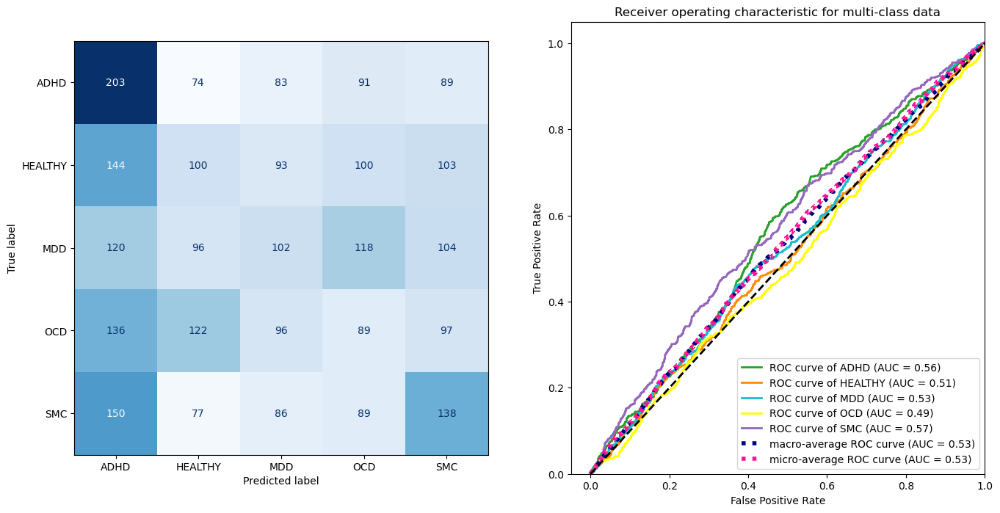

In [8]:
# final pipeline
best_params = {}
for hyperparameter in gridsearch.best_params_:
    key = hyperparameter[20:]
    best_params[key] = gridsearch.best_params_[hyperparameter]
print(best_params)

steps = [('col_trans', col_trans), ('pca', PCA()), ('rbf_svm', OneVsRestClassifier(SVC(**best_params, probability=True)))]
pipeline = Pipeline(steps)

# obtain predictions
Y_pred = cross_val_predict(pipeline, X, Y,  cv = cv_outer, groups = groups, n_jobs=-1, verbose=1)    
class_labels = le.inverse_transform(sorted(np.unique(Y)))
print('f1_score:', f1_score(Y, Y_pred, average = 'weighted', zero_division=0))
print()
print('classification report:\n', classification_report(Y, Y_pred, target_names=class_labels, zero_division=0))

# create subplots
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(16, 8))

# plot confusion matrix
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
conf_matrix = confusion_matrix(Y, Y_pred)
ConfusionMatrixDisplay(conf_matrix, display_labels = class_labels).plot(cmap = 'Blues', values_format = 'd', colorbar=False, ax=ax1)

# obtain proba predictions
Y_score = cross_val_predict(pipeline, X, Y,  cv = cv_outer, groups = groups, n_jobs=-1, verbose=1, method='predict_proba')

from sklearn.metrics import roc_auc_score

micro_roc_auc_ovr = roc_auc_score(
    Y_one_hot,
    Y_score,
    multi_class="ovr",
    average="micro",
)

print(f"Micro-averaged One-vs-Rest ROC AUC score:\n{micro_roc_auc_ovr:.2f}")

### plot ROC curves
from sklearn.metrics import roc_curve, auc
n_classes = Y_one_hot.shape[1]

fpr = dict()
tpr = dict()
roc_auc = dict()
lw=2


for i in range(n_classes):
    fpr[i], tpr[i], _ = roc_curve(Y_one_hot[:, i], Y_score[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])
colors = ['tab:green', 'darkorange', 'tab:cyan', 'yellow', 'tab:purple']
for i, color in zip(range(n_classes), colors):
    ax2.plot(fpr[i], tpr[i], color=color, lw=2,
             label=f'ROC curve of {class_labels[i]} (AUC = {roc_auc[i]:0.2f})')
    
## Compute macro-average ROC curve and AUC
fpr_grid = np.linspace(0.0, 1.0, 1000)

# Interpolate all ROC curves at these points
mean_tpr = np.zeros_like(fpr_grid)

for i in range(n_classes):
    mean_tpr += np.interp(fpr_grid, fpr[i], tpr[i])  # linear interpolation

# Average it and compute AUC
mean_tpr /= n_classes

fpr["macro"] = fpr_grid
tpr["macro"] = mean_tpr
roc_auc["macro"] = auc(fpr["macro"], tpr["macro"])
ax2.plot(
    fpr["macro"],
    tpr["macro"],
    label=f"macro-average ROC curve (AUC = {roc_auc['macro']:.2f})",
    color="navy",
    linestyle=":",
    linewidth=4,
)    
## Compute micro-average ROC curve and AUC
fpr["micro"], tpr["micro"], _ = roc_curve(Y_one_hot.ravel(), Y_score.ravel())
roc_auc["micro"] = auc(fpr["micro"], tpr["micro"])
ax2.plot(
    fpr["micro"],
    tpr["micro"],
    label=f"micro-average ROC curve (AUC = {roc_auc['micro']:.2f})",
    color="deeppink",
    linestyle=":",
    linewidth=4,
)


ax2.plot([0, 1], [0, 1], 'k--', lw=lw)
ax2.set_xlim([-0.05, 1.0])
ax2.set_ylim([0.0, 1.05])
ax2.set_xlabel('False Positive Rate')
ax2.set_ylabel('True Positive Rate')
ax2.set_title('Receiver operating characteristic for multi-class data')
ax2.legend(loc="lower right")
plt.show()

Checking feature importance

len(X) = 2700
X_train.shape = (2028, 100), X_test.shape = (672, 100), Y_train.shape = (2028,), Y_test.shape = (672,)


Text(0.5, 1.0, 'Difference between training - testing data')

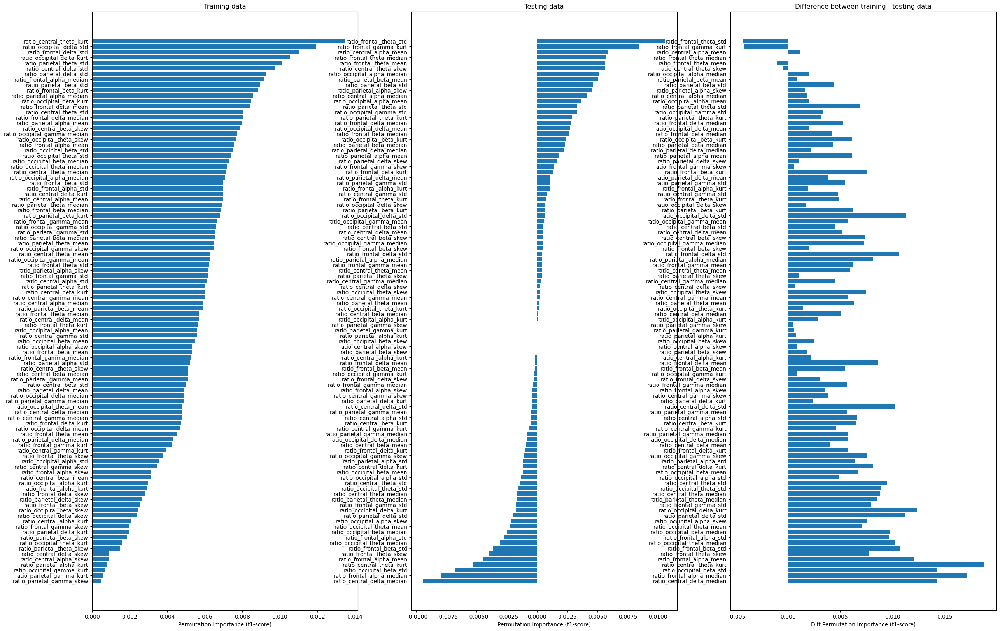

In [9]:
# using permutation_importance(), but according to literature it isn't a very reliable method for SVC with rbf kernel
from sklearn.inspection import permutation_importance

# splitting data into train and test set
desired_test_ratio = 0.25
n_splits = int(1 / desired_test_ratio) # for some reason (?), n_splits also determines the proportion between train & test indices
sgkf = StratifiedGroupKFold(n_splits=n_splits, shuffle=False)
train_idxs, test_idxs = sgkf.split(X, Y, groups).__next__() # just take the first split
print(f'{len(X) = }')

X_train = X.iloc[train_idxs]
X_test = X.iloc[test_idxs]
Y_train = Y[train_idxs]
Y_test = Y[test_idxs]
print(f'{X_train.shape = }, {X_test.shape = }, {Y_train.shape = }, {Y_test.shape = }')

# fit pipeline to training data
pipeline_fit = pipeline.fit(X_train, Y_train)
train_perm_importance = permutation_importance(pipeline_fit, X_train, Y_train,
                                    n_repeats=5, random_state=42,
                                    n_jobs=-1, scoring=f1_scorer)

train_sorted_idx = train_perm_importance.importances_mean.argsort()

fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(30, 20))
ax1.barh(X.columns[train_sorted_idx], train_perm_importance.importances_mean[train_sorted_idx])
ax1.set_xlabel("Permutation Importance (f1-score)")
ax1.set_title('Training data')

# fit pipeline to test data
test_perm_importance = permutation_importance(pipeline_fit, X_test, Y_test,
                                    n_repeats=5, random_state=42,
                                    n_jobs=-1, scoring=f1_scorer)

test_sorted_idx = test_perm_importance.importances_mean.argsort()
ax2.barh(X.columns[test_sorted_idx], test_perm_importance.importances_mean[test_sorted_idx])
ax2.set_xlabel("Permutation Importance (f1-score)")
ax2.set_title('Testing data')

# plot difference between training and testing permutation importance (im not entirely
# sure if the indices are the same for both test/train data, as the importances_mean attribute is just a numpy array)
diff = train_perm_importance.importances_mean - test_perm_importance.importances_mean
ax3.barh(X.columns[test_sorted_idx], diff[test_sorted_idx])
ax3.set_xlabel("Diff Permutation Importance (f1-score)")
ax3.set_title('Difference between training - testing data')

#### EC feature set

In [10]:
from sklearn import svm
from sklearn.preprocessing import StandardScaler
from sklearn import metrics
from sklearn.model_selection import StratifiedGroupKFold, GridSearchCV, GroupShuffleSplit
from sklearn.model_selection import train_test_split, cross_val_score, cross_val_predict, cross_validate
from sklearn.metrics import classification_report, confusion_matrix, f1_score, make_scorer, fbeta_score
from sklearn.metrics import make_scorer, accuracy_score, precision_score, recall_score, f1_score
from sklearn.pipeline import Pipeline, make_pipeline
from sklearn.impute import SimpleImputer
from sklearn import preprocessing
from sklearn.decomposition import PCA
from sklearn.compose import ColumnTransformer
from sklearn.svm import SVC
from sklearn.multiclass import OneVsRestClassifier


# assign groups (IDs) for GroupKFold
groups = df_features_ec['ID'].tolist()
print(f'# of instances: {len(groups)}')

# define numeric columns
numeric_cols = []
for cond in ['EC']:
    for band in bands:
        for group in channel_groups:
            for stat in ['std', 'mean', 'median', 'skew', 'kurt']:
                numeric_cols.append(f'{cond}_{group}_{band}_{stat}')
 
X = df_features_ec[numeric_cols]
Y = df_features_ec['diagnosis']
# label binarize diagnosis for ROC curve (alphabatic order by default)
# & label encode diagnosis for predictions
from sklearn import preprocessing
lb = preprocessing.LabelBinarizer()
Y_one_hot = lb.fit_transform(Y)
print(Y_one_hot.shape)
le = preprocessing.LabelEncoder()
Y = le.fit_transform(Y)

# preprocessing steps for numerical features
numeric_transformer = Pipeline(steps = [
    ('scaler', StandardScaler()), # standardization
    ('impute', SimpleImputer(strategy='mean')) # mean imputation
])

col_trans = ColumnTransformer(transformers=[
    ('numeric_transformer', numeric_transformer, numeric_cols)
    ],
    remainder='drop',
    n_jobs=-1)

# hyperparameter ranges for GridSearch
param_grid = {
'rbf_svm__estimator__C': [0.01, 0.1, 1, 10, 100],
'rbf_svm__estimator__gamma': [0.1, 1, 10, 100],
'rbf_svm__estimator__kernel': ['rbf'],
'rbf_svm__estimator__class_weight': ['balanced']
}

# final pipeline
steps = [('col_trans', col_trans), ('pca', PCA()), ('rbf_svm', OneVsRestClassifier(SVC(class_weight = 'balanced')))]
pipeline = Pipeline(steps)

# define score metric
f1_scorer = make_scorer(fbeta_score, beta=1, average='weighted')

# define inner & outer CV objects
cv_inner = StratifiedGroupKFold(n_splits = 3, shuffle=False) # shuffle=False, so splits will be the same across calls (?)
cv_outer = StratifiedGroupKFold(n_splits = 5, shuffle=False) # shuffle=False, so splits will be the same across calls (?)

# define gridsearch
gridsearch = GridSearchCV(pipeline,
                        param_grid = param_grid,
                        cv = cv_inner, # use inner cv for hyperparameter tuning
                        scoring = f1_scorer,
                        error_score = 'raise',
                        return_train_score = True,
                        n_jobs=-1,
                        verbose=1)

# non-nested CV for obtaining the propable best hyperparameters
gridsearch_fit = gridsearch.fit(X, Y, groups = groups)
print(f'Best parameters: {gridsearch_fit.best_params_}')
print(f'Best f1-score: {gridsearch_fit.best_score_}')

# nested CV with parameter optimization to compute testing score (f1-score)
svm_test_score = cross_val_score(gridsearch, # use unfitted gridsearch object, (idk if this matters)
                                 X = X, y = Y, 
                                 cv = cv_outer, # use outer cv for model evaluation
                                 groups = groups, 
                                 fit_params={"groups": groups},
                                 scoring = f1_scorer,
                                 error_score = 'raise',
                                 verbose=1,
                                 n_jobs=-1)
print('SVM test scores:', svm_test_score)
print('Mean SVM test score:', np.mean(svm_test_score))


# of instances: 2700
(2700, 5)
Fitting 3 folds for each of 20 candidates, totalling 60 fits
Best parameters: {'rbf_svm__estimator__C': 10, 'rbf_svm__estimator__class_weight': 'balanced', 'rbf_svm__estimator__gamma': 0.1, 'rbf_svm__estimator__kernel': 'rbf'}
Best f1-score: 0.23566952123507404


/home/tsmolders/.conda/envs/py3117/lib/python3.11/site-packages/sklearn/model_selection/_validation.py:73: FutureWarning: `fit_params` is deprecated and will be removed in version 1.6. Pass parameters via `params` instead.
  warnings.warn(
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 30 concurrent workers.
/home/tsmolders/.conda/envs/py3117/lib/python3.11/site-packages/sklearn/utils/extmath.py:1144: RuntimeWarning: invalid value encountered in divide
  * (last_sum / last_over_new_count - new_sum) ** 2
/home/tsmolders/.conda/envs/py3117/lib/python3.11/site-packages/sklearn/utils/extmath.py:1144: RuntimeWarning: invalid value encountered in divide
  * (last_sum / last_over_new_count - new_sum) ** 2
/home/tsmolders/.conda/envs/py3117/lib/python3.11/site-packages/sklearn/utils/extmath.py:1144: RuntimeWarning: invalid value encountered in divide
  * (last_sum / last_over_new_count - new_sum) ** 2
/home/tsmolders/.conda/envs/py3117/lib/python3.11/site-packages/sklearn/utils/extmath.

SVM test scores: [0.22552305 0.27617882 0.21181287 0.2120262  0.21970113]
Mean SVM test score: 0.22904841344147045


[Parallel(n_jobs=-1)]: Done   5 out of   5 | elapsed:   32.7s finished


In [5]:
# calculate std (CAREFUL: WAS CALCULATED AFTERWARDS, SO NUMBERS DO NOT UPDATE AUTOMATICALLY)
print(np.std([0.22552305, 0.27617882, 0.21181287, 0.2120262,  0.21970113]))

0.02411594835652009


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 30 concurrent workers.


{'C': 10, 'class_weight': 'balanced', 'gamma': 0.1, 'kernel': 'rbf'}


[Parallel(n_jobs=-1)]: Done   5 out of   5 | elapsed:   10.2s finished


f1_score: 0.22945503315786095

classification report:
               precision    recall  f1-score   support

        ADHD       0.29      0.27      0.28       540
     HEALTHY       0.26      0.27      0.26       540
         MDD       0.24      0.14      0.18       540
         OCD       0.18      0.12      0.14       540
         SMC       0.23      0.40      0.29       540

    accuracy                           0.24      2700
   macro avg       0.24      0.24      0.23      2700
weighted avg       0.24      0.24      0.23      2700



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 30 concurrent workers.
[Parallel(n_jobs=-1)]: Done   5 out of   5 | elapsed:   10.2s finished


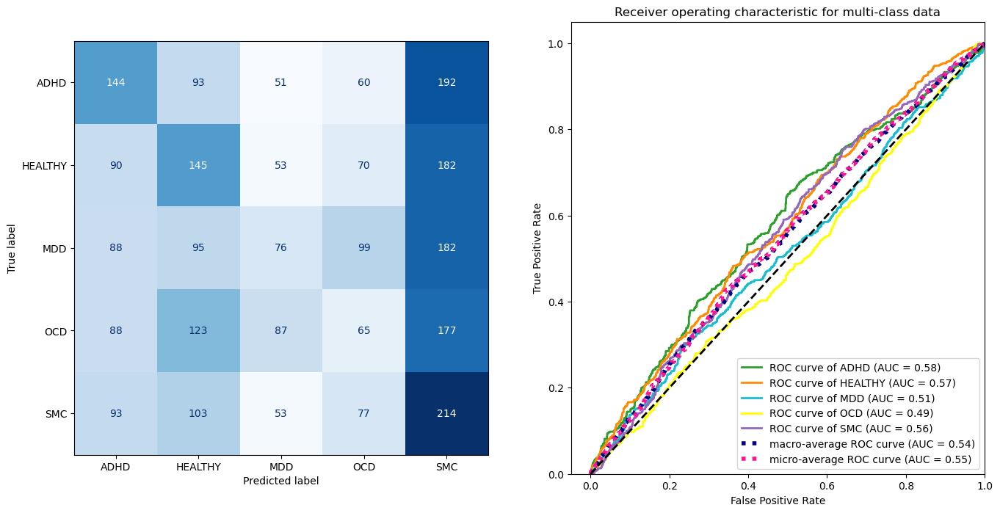

In [11]:
# final pipeline
best_params = {}
for hyperparameter in gridsearch.best_params_:
    key = hyperparameter[20:]
    best_params[key] = gridsearch.best_params_[hyperparameter]
print(best_params)

steps = [('col_trans', col_trans), ('pca', PCA()), ('rbf_svm', OneVsRestClassifier(SVC(**best_params, probability=True)))]
pipeline = Pipeline(steps)

# obtain predictions
Y_pred = cross_val_predict(pipeline, X, Y,  cv = cv_outer, groups = groups, n_jobs=-1, verbose=1)    
class_labels = le.inverse_transform(sorted(np.unique(Y)))
print('f1_score:', f1_score(Y, Y_pred, average = 'weighted', zero_division=0))
print()
print('classification report:\n', classification_report(Y, Y_pred, target_names=class_labels, zero_division=0))

# create subplots
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(16, 8))

# plot confusion matrix
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
conf_matrix = confusion_matrix(Y, Y_pred)
ConfusionMatrixDisplay(conf_matrix, display_labels = class_labels).plot(cmap = 'Blues', values_format = 'd', colorbar=False, ax=ax1)

# obtain proba predictions
Y_score = cross_val_predict(pipeline, X, Y,  cv = cv_outer, groups = groups, n_jobs=-1, verbose=1, method='predict_proba')

### plot ROC curves
from sklearn.metrics import roc_curve, auc
n_classes = Y_one_hot.shape[1]

fpr = dict()
tpr = dict()
roc_auc = dict()
lw=2


for i in range(n_classes):
    fpr[i], tpr[i], _ = roc_curve(Y_one_hot[:, i], Y_score[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])
colors = ['tab:green', 'darkorange', 'tab:cyan', 'yellow', 'tab:purple']
for i, color in zip(range(n_classes), colors):
    ax2.plot(fpr[i], tpr[i], color=color, lw=2,
             label=f'ROC curve of {class_labels[i]} (AUC = {roc_auc[i]:0.2f})')
    
## Compute macro-average ROC curve and AUC
fpr_grid = np.linspace(0.0, 1.0, 1000)

# Interpolate all ROC curves at these points
mean_tpr = np.zeros_like(fpr_grid)

for i in range(n_classes):
    mean_tpr += np.interp(fpr_grid, fpr[i], tpr[i])  # linear interpolation

# Average it and compute AUC
mean_tpr /= n_classes

fpr["macro"] = fpr_grid
tpr["macro"] = mean_tpr
roc_auc["macro"] = auc(fpr["macro"], tpr["macro"])
ax2.plot(
    fpr["macro"],
    tpr["macro"],
    label=f"macro-average ROC curve (AUC = {roc_auc['macro']:.2f})",
    color="navy",
    linestyle=":",
    linewidth=4,
)    
## Compute micro-average ROC curve and AUC
fpr["micro"], tpr["micro"], _ = roc_curve(Y_one_hot.ravel(), Y_score.ravel())
roc_auc["micro"] = auc(fpr["micro"], tpr["micro"])
ax2.plot(
    fpr["micro"],
    tpr["micro"],
    label=f"micro-average ROC curve (AUC = {roc_auc['micro']:.2f})",
    color="deeppink",
    linestyle=":",
    linewidth=4,
)


ax2.plot([0, 1], [0, 1], 'k--', lw=lw)
ax2.set_xlim([-0.05, 1.0])
ax2.set_ylim([0.0, 1.05])
ax2.set_xlabel('False Positive Rate')
ax2.set_ylabel('True Positive Rate')
ax2.set_title('Receiver operating characteristic for multi-class data')
ax2.legend(loc="lower right")
plt.show()

Checking feature importance

len(X) = 2700
X_train.shape = (2028, 100), X_test.shape = (672, 100), Y_train.shape = (2028,), Y_test.shape = (672,)


Text(0.5, 1.0, 'Difference between training - testing data')

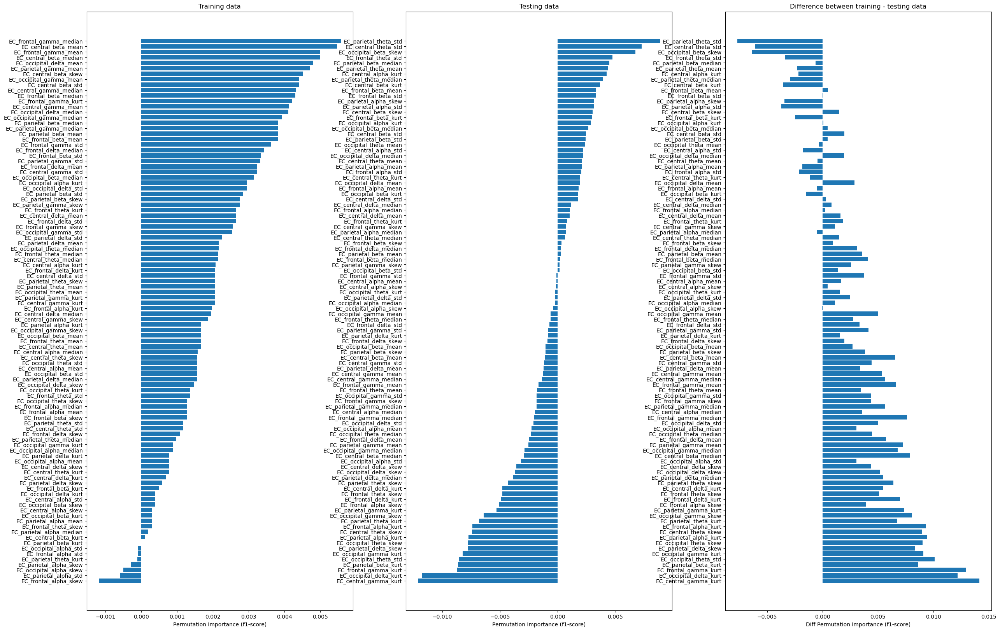

In [12]:
# using permutation_importance(), but according to literature it isn't a very reliable method for SVC with rbf kernel
from sklearn.inspection import permutation_importance

# splitting data into train and test set
desired_test_ratio = 0.25
n_splits = int(1 / desired_test_ratio) # for some reason (?), n_splits also determines the proportion between train & test indices
sgkf = StratifiedGroupKFold(n_splits=n_splits, shuffle=False)
train_idxs, test_idxs = sgkf.split(X, Y, groups).__next__() # just take the first split
print(f'{len(X) = }')

X_train = X.iloc[train_idxs]
X_test = X.iloc[test_idxs]
Y_train = Y[train_idxs]
Y_test = Y[test_idxs]
print(f'{X_train.shape = }, {X_test.shape = }, {Y_train.shape = }, {Y_test.shape = }')

# fit pipeline to training data
pipeline_fit = pipeline.fit(X_train, Y_train)
train_perm_importance = permutation_importance(pipeline_fit, X_train, Y_train,
                                    n_repeats=5, random_state=42,
                                    n_jobs=-1, scoring=f1_scorer)

train_sorted_idx = train_perm_importance.importances_mean.argsort()

fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(30, 20))
ax1.barh(X.columns[train_sorted_idx], train_perm_importance.importances_mean[train_sorted_idx])
ax1.set_xlabel("Permutation Importance (f1-score)")
ax1.set_title('Training data')

# fit pipeline to test data
test_perm_importance = permutation_importance(pipeline_fit, X_test, Y_test,
                                    n_repeats=5, random_state=42,
                                    n_jobs=-1, scoring=f1_scorer)

test_sorted_idx = test_perm_importance.importances_mean.argsort()
ax2.barh(X.columns[test_sorted_idx], test_perm_importance.importances_mean[test_sorted_idx])
ax2.set_xlabel("Permutation Importance (f1-score)")
ax2.set_title('Testing data')

# plot difference between training and testing permutation importance (im not entirely
# sure if the indices are the same for both test/train data, as the importances_mean attribute is just a numpy array)
diff = train_perm_importance.importances_mean - test_perm_importance.importances_mean
ax3.barh(X.columns[test_sorted_idx], diff[test_sorted_idx])
ax3.set_xlabel("Diff Permutation Importance (f1-score)")
ax3.set_title('Difference between training - testing data')

#### EO feature set

In [13]:
from sklearn import svm
from sklearn.preprocessing import StandardScaler
from sklearn import metrics
from sklearn.model_selection import StratifiedGroupKFold, GridSearchCV, GroupShuffleSplit
from sklearn.model_selection import train_test_split, cross_val_score, cross_val_predict, cross_validate
from sklearn.metrics import classification_report, confusion_matrix, f1_score, make_scorer, fbeta_score
from sklearn.metrics import make_scorer, accuracy_score, precision_score, recall_score, f1_score
from sklearn.pipeline import Pipeline, make_pipeline
from sklearn.impute import SimpleImputer
from sklearn import preprocessing
from sklearn.decomposition import PCA
from sklearn.compose import ColumnTransformer
from sklearn.svm import SVC
from sklearn.multiclass import OneVsRestClassifier


# assign groups (IDs) for GroupKFold
groups = df_features_eo['ID'].tolist()
print(f'# of instances: {len(groups)}')

# define numeric columns
numeric_cols = []
for cond in ['EO']:
    for band in bands:
        for group in channel_groups:
            for stat in ['std', 'mean', 'median', 'skew', 'kurt']:
                numeric_cols.append(f'{cond}_{group}_{band}_{stat}')
 
X = df_features_eo[numeric_cols]
Y = df_features_eo['diagnosis']
# label binarize diagnosis for ROC curve (alphabatic order by default)
# & label encode diagnosis for predictions
from sklearn import preprocessing
lb = preprocessing.LabelBinarizer()
Y_one_hot = lb.fit_transform(Y)
print(Y_one_hot.shape)
le = preprocessing.LabelEncoder()
Y = le.fit_transform(Y)

# preprocessing steps for numerical features
numeric_transformer = Pipeline(steps = [
    ('scaler', StandardScaler()), # standardization
    ('impute', SimpleImputer(strategy='mean')) # mean imputation
])

col_trans = ColumnTransformer(transformers=[
    ('numeric_transformer', numeric_transformer, numeric_cols)
    ],
    remainder='drop',
    n_jobs=-1)

# hyperparameter ranges for GridSearch
param_grid = {
'rbf_svm__estimator__C': [0.01, 0.1, 1, 10, 100],
'rbf_svm__estimator__gamma': [0.1, 1, 10, 100],
'rbf_svm__estimator__kernel': ['rbf'],
'rbf_svm__estimator__class_weight': ['balanced']
}

# final pipeline
steps = [('col_trans', col_trans), ('pca', PCA()), ('rbf_svm', OneVsRestClassifier(SVC(class_weight = 'balanced')))]
pipeline = Pipeline(steps)

# define score metric
f1_scorer = make_scorer(fbeta_score, beta=1, average='weighted')

# define inner & outer CV objects
cv_inner = StratifiedGroupKFold(n_splits = 3, shuffle=False) # shuffle=False, so splits will be the same across calls (?)
cv_outer = StratifiedGroupKFold(n_splits = 5, shuffle=False) # shuffle=False, so splits will be the same across calls (?)

# define gridsearch
gridsearch = GridSearchCV(pipeline,
                        param_grid = param_grid,
                        cv = cv_inner, # use inner cv for hyperparameter tuning
                        scoring = f1_scorer,
                        error_score = 'raise',
                        return_train_score = True,
                        n_jobs=-1,
                        verbose=1)

# non-nested CV for obtaining the propable best hyperparameters
gridsearch_fit = gridsearch.fit(X, Y, groups = groups)
print(f'Best parameters: {gridsearch_fit.best_params_}')
print(f'Best f1-score: {gridsearch_fit.best_score_}')

# nested CV with parameter optimization to compute testing score (f1-score)
svm_test_score = cross_val_score(gridsearch, # use unfitted gridsearch object, (idk if this matters)
                                 X = X, y = Y, 
                                 cv = cv_outer, # use outer cv for model evaluation
                                 groups = groups, 
                                 fit_params={"groups": groups},
                                 scoring = f1_scorer,
                                 error_score = 'raise',
                                 verbose=1,
                                 n_jobs=-1)
print('SVM test scores:', svm_test_score)
print('Mean SVM test score:', np.mean(svm_test_score))


# of instances: 2700
(2700, 5)
Fitting 3 folds for each of 20 candidates, totalling 60 fits
Best parameters: {'rbf_svm__estimator__C': 1, 'rbf_svm__estimator__class_weight': 'balanced', 'rbf_svm__estimator__gamma': 0.1, 'rbf_svm__estimator__kernel': 'rbf'}
Best f1-score: 0.2661145288866138


/home/tsmolders/.conda/envs/py3117/lib/python3.11/site-packages/sklearn/model_selection/_validation.py:73: FutureWarning: `fit_params` is deprecated and will be removed in version 1.6. Pass parameters via `params` instead.
  warnings.warn(
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 30 concurrent workers.
/home/tsmolders/.conda/envs/py3117/lib/python3.11/site-packages/sklearn/utils/extmath.py:1144: RuntimeWarning: invalid value encountered in divide
  * (last_sum / last_over_new_count - new_sum) ** 2
/home/tsmolders/.conda/envs/py3117/lib/python3.11/site-packages/sklearn/utils/extmath.py:1144: RuntimeWarning: invalid value encountered in divide
  * (last_sum / last_over_new_count - new_sum) ** 2
/home/tsmolders/.conda/envs/py3117/lib/python3.11/site-packages/sklearn/utils/extmath.py:1144: RuntimeWarning: invalid value encountered in divide
  * (last_sum / last_over_new_count - new_sum) ** 2
/home/tsmolders/.conda/envs/py3117/lib/python3.11/site-packages/sklearn/utils/extmath.

SVM test scores: [0.30235224 0.26211418 0.2433707  0.26523645 0.24655343]
Mean SVM test score: 0.26392539902162626


[Parallel(n_jobs=-1)]: Done   5 out of   5 | elapsed:   31.7s finished


In [8]:
# calculate std (CAREFUL: WAS CALCULATED AFTERWARDS, SO NUMBERS DO NOT UPDATE AUTOMATICALLY)
print(np.std([0.30235224, 0.26211418, 0.2433707,  0.26523645, 0.24655343]))

0.021004296875389093


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 30 concurrent workers.


{'C': 1, 'class_weight': 'balanced', 'gamma': 0.1, 'kernel': 'rbf'}


[Parallel(n_jobs=-1)]: Done   5 out of   5 | elapsed:   10.2s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 30 concurrent workers.


f1_score: 0.2649746968042727

classification report:
               precision    recall  f1-score   support

        ADHD       0.28      0.46      0.35       540
     HEALTHY       0.27      0.20      0.23       540
         MDD       0.22      0.14      0.17       540
         OCD       0.32      0.20      0.25       540
         SMC       0.28      0.38      0.32       540

    accuracy                           0.28      2700
   macro avg       0.27      0.28      0.26      2700
weighted avg       0.27      0.28      0.26      2700



[Parallel(n_jobs=-1)]: Done   5 out of   5 | elapsed:   10.2s finished


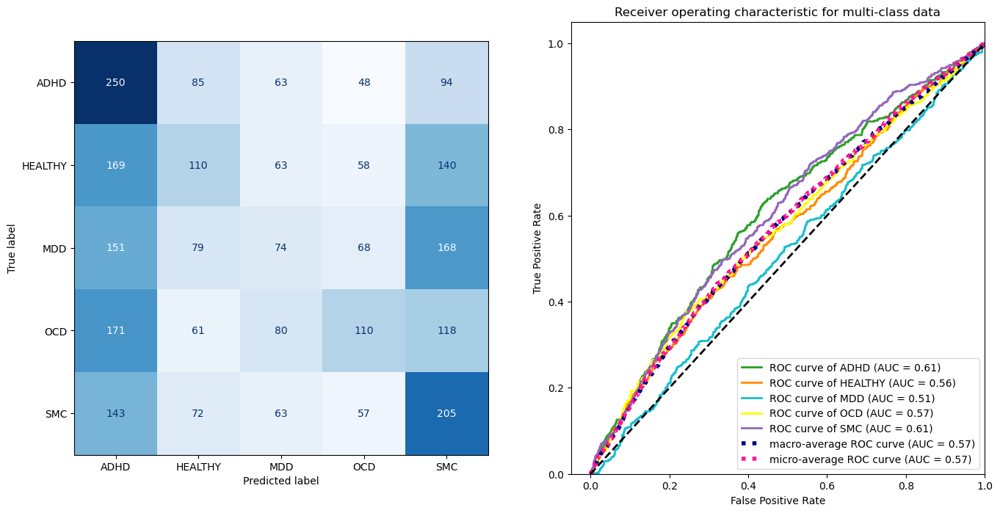

In [14]:
# final pipeline
best_params = {}
for hyperparameter in gridsearch.best_params_:
    key = hyperparameter[20:]
    best_params[key] = gridsearch.best_params_[hyperparameter]
print(best_params)

steps = [('col_trans', col_trans), ('pca', PCA()), ('rbf_svm', OneVsRestClassifier(SVC(**best_params, probability=True)))]
pipeline = Pipeline(steps)

# obtain predictions
Y_pred = cross_val_predict(pipeline, X, Y,  cv = cv_outer, groups = groups, n_jobs=-1, verbose=1)    
class_labels = le.inverse_transform(sorted(np.unique(Y)))
print('f1_score:', f1_score(Y, Y_pred, average = 'weighted', zero_division=0))
print()
print('classification report:\n', classification_report(Y, Y_pred, target_names=class_labels, zero_division=0))

# create subplots
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(16, 8))

# plot confusion matrix
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
conf_matrix = confusion_matrix(Y, Y_pred)
ConfusionMatrixDisplay(conf_matrix, display_labels = class_labels).plot(cmap = 'Blues', values_format = 'd', colorbar=False, ax=ax1)

# obtain proba predictions
Y_score = cross_val_predict(pipeline, X, Y,  cv = cv_outer, groups = groups, n_jobs=-1, verbose=1, method='predict_proba')

### plot ROC curves
from sklearn.metrics import roc_curve, auc
n_classes = Y_one_hot.shape[1]

fpr = dict()
tpr = dict()
roc_auc = dict()
lw=2


for i in range(n_classes):
    fpr[i], tpr[i], _ = roc_curve(Y_one_hot[:, i], Y_score[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])
colors = ['tab:green', 'darkorange', 'tab:cyan', 'yellow', 'tab:purple']
for i, color in zip(range(n_classes), colors):
    ax2.plot(fpr[i], tpr[i], color=color, lw=2,
             label=f'ROC curve of {class_labels[i]} (AUC = {roc_auc[i]:0.2f})')
    
## Compute macro-average ROC curve and AUC
fpr_grid = np.linspace(0.0, 1.0, 1000)

# Interpolate all ROC curves at these points
mean_tpr = np.zeros_like(fpr_grid)

for i in range(n_classes):
    mean_tpr += np.interp(fpr_grid, fpr[i], tpr[i])  # linear interpolation

# Average it and compute AUC
mean_tpr /= n_classes

fpr["macro"] = fpr_grid
tpr["macro"] = mean_tpr
roc_auc["macro"] = auc(fpr["macro"], tpr["macro"])
ax2.plot(
    fpr["macro"],
    tpr["macro"],
    label=f"macro-average ROC curve (AUC = {roc_auc['macro']:.2f})",
    color="navy",
    linestyle=":",
    linewidth=4,
)    
## Compute micro-average ROC curve and AUC
fpr["micro"], tpr["micro"], _ = roc_curve(Y_one_hot.ravel(), Y_score.ravel())
roc_auc["micro"] = auc(fpr["micro"], tpr["micro"])
ax2.plot(
    fpr["micro"],
    tpr["micro"],
    label=f"micro-average ROC curve (AUC = {roc_auc['micro']:.2f})",
    color="deeppink",
    linestyle=":",
    linewidth=4,
)


ax2.plot([0, 1], [0, 1], 'k--', lw=lw)
ax2.set_xlim([-0.05, 1.0])
ax2.set_ylim([0.0, 1.05])
ax2.set_xlabel('False Positive Rate')
ax2.set_ylabel('True Positive Rate')
ax2.set_title('Receiver operating characteristic for multi-class data')
ax2.legend(loc="lower right")
plt.show()

Checking feature importance

len(X) = 2700
X_train.shape = (2028, 100), X_test.shape = (672, 100), Y_train.shape = (2028,), Y_test.shape = (672,)


Text(0.5, 1.0, 'Difference between training - testing data')

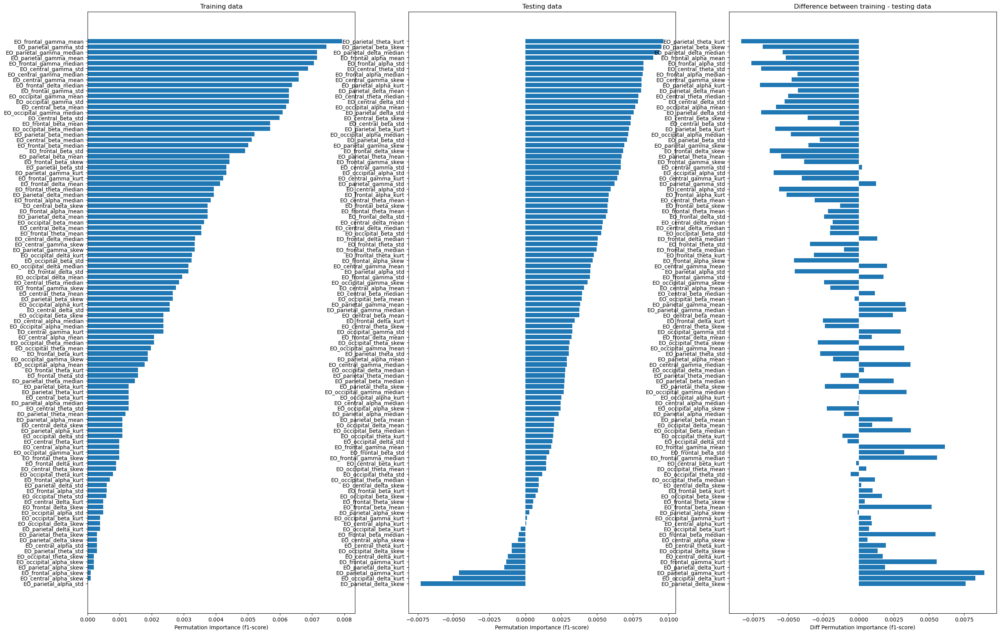

In [15]:
# using permutation_importance(), but according to literature it isn't a very reliable method for SVC with rbf kernel
from sklearn.inspection import permutation_importance

# splitting data into train and test set
desired_test_ratio = 0.25
n_splits = int(1 / desired_test_ratio) # for some reason (?), n_splits also determines the proportion between train & test indices
sgkf = StratifiedGroupKFold(n_splits=n_splits, shuffle=False)
train_idxs, test_idxs = sgkf.split(X, Y, groups).__next__() # just take the first split
print(f'{len(X) = }')

X_train = X.iloc[train_idxs]
X_test = X.iloc[test_idxs]
Y_train = Y[train_idxs]
Y_test = Y[test_idxs]
print(f'{X_train.shape = }, {X_test.shape = }, {Y_train.shape = }, {Y_test.shape = }')

# fit pipeline to training data
pipeline_fit = pipeline.fit(X_train, Y_train)
train_perm_importance = permutation_importance(pipeline_fit, X_train, Y_train,
                                    n_repeats=5, random_state=42,
                                    n_jobs=-1, scoring=f1_scorer)

train_sorted_idx = train_perm_importance.importances_mean.argsort()

fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(30, 20))
ax1.barh(X.columns[train_sorted_idx], train_perm_importance.importances_mean[train_sorted_idx])
ax1.set_xlabel("Permutation Importance (f1-score)")
ax1.set_title('Training data')

# fit pipeline to test data
test_perm_importance = permutation_importance(pipeline_fit, X_test, Y_test,
                                    n_repeats=5, random_state=42,
                                    n_jobs=-1, scoring=f1_scorer)

test_sorted_idx = test_perm_importance.importances_mean.argsort()
ax2.barh(X.columns[test_sorted_idx], test_perm_importance.importances_mean[test_sorted_idx])
ax2.set_xlabel("Permutation Importance (f1-score)")
ax2.set_title('Testing data')

# plot difference between training and testing permutation importance (im not entirely
# sure if the indices are the same for both test/train data, as the importances_mean attribute is just a numpy array)
diff = train_perm_importance.importances_mean - test_perm_importance.importances_mean
ax3.barh(X.columns[test_sorted_idx], diff[test_sorted_idx])
ax3.set_xlabel("Diff Permutation Importance (f1-score)")
ax3.set_title('Difference between training - testing data')

### SVC Without skew & kurt

In [8]:
# remove skewness & kurtosis features
df_features_ec_nosk = df_features_ec[df_features_ec.columns[~(df_features_ec.columns.str.endswith('kurt') | df_features_ec.columns.str.endswith('skew'))]]
df_features_eo_nosk = df_features_eo[df_features_eo.columns[~(df_features_eo.columns.str.endswith('kurt') | df_features_eo.columns.str.endswith('skew'))]]
df_features_ratio_nosk = df_features_ratio[df_features_ratio.columns[~(df_features_ratio.columns.str.endswith('kurt') | df_features_ratio.columns.str.endswith('skew'))]]
print(df_features_ec.shape)
print(df_features_ec_nosk.shape)

(2700, 105)
(2700, 65)


#### ratio feature set

In [9]:
from sklearn import svm
from sklearn.preprocessing import StandardScaler
from sklearn import metrics
from sklearn.model_selection import StratifiedGroupKFold, GridSearchCV, GroupShuffleSplit
from sklearn.model_selection import train_test_split, cross_val_score, cross_val_predict, cross_validate
from sklearn.metrics import classification_report, confusion_matrix, f1_score, make_scorer, fbeta_score
from sklearn.metrics import make_scorer, accuracy_score, precision_score, recall_score, f1_score
from sklearn.pipeline import Pipeline, make_pipeline
from sklearn.impute import SimpleImputer
from sklearn import preprocessing
from sklearn.decomposition import PCA
from sklearn.compose import ColumnTransformer
from sklearn.svm import SVC
from sklearn.multiclass import OneVsRestClassifier


# assign groups (IDs) for GroupKFold
groups = df_features_ratio_nosk['ID'].tolist()
print(f'# of instances: {len(groups)}')

# define numeric columns
numeric_cols = []
for cond in ['ratio']:
    for band in bands:
        for group in channel_groups:
            for stat in ['std', 'mean', 'median']:
                numeric_cols.append(f'{cond}_{group}_{band}_{stat}')
 
X = df_features_ratio_nosk[numeric_cols]
Y = df_features_ratio_nosk['diagnosis']
# label binarize diagnosis for ROC curve (alphabatic order by default)
# & label encode diagnosis for predictions
from sklearn import preprocessing
lb = preprocessing.LabelBinarizer()
Y_one_hot = lb.fit_transform(Y)
print(Y_one_hot.shape)
le = preprocessing.LabelEncoder()
Y = le.fit_transform(Y)

# preprocessing steps for numerical features
numeric_transformer = Pipeline(steps = [
    ('scaler', StandardScaler()), # standardization
    ('impute', SimpleImputer(strategy='mean')) # mean imputation
])

col_trans = ColumnTransformer(transformers=[
    ('numeric_transformer', numeric_transformer, numeric_cols)
    ],
    remainder='drop',
    n_jobs=-1)

# hyperparameter ranges for GridSearch
param_grid = {
'rbf_svm__estimator__C': [0.01, 0.1, 1, 10, 100],
'rbf_svm__estimator__gamma': [0.1, 1, 10, 100],
'rbf_svm__estimator__kernel': ['rbf'],
'rbf_svm__estimator__class_weight': ['balanced']
}

# final pipeline
steps = [('col_trans', col_trans), ('pca', PCA()), ('rbf_svm', OneVsRestClassifier(SVC(class_weight = 'balanced')))]
pipeline = Pipeline(steps)

# define score metric
f1_scorer = make_scorer(fbeta_score, beta=1, average='weighted')

# define inner & outer CV objects
cv_inner = StratifiedGroupKFold(n_splits = 3, shuffle=False) # shuffle=False, so splits will be the same across calls (?)
cv_outer = StratifiedGroupKFold(n_splits = 5, shuffle=False) # shuffle=False, so splits will be the same across calls (?)

# define gridsearch
gridsearch = GridSearchCV(pipeline,
                        param_grid = param_grid,
                        cv = cv_inner, # use inner cv for hyperparameter tuning
                        scoring = f1_scorer,
                        error_score = 'raise',
                        return_train_score = True,
                        n_jobs=-1,
                        verbose=1)

# non-nested CV for obtaining the propable best hyperparameters
gridsearch_fit = gridsearch.fit(X, Y, groups = groups)
print(f'Best parameters: {gridsearch_fit.best_params_}')
print(f'Best f1-score: {gridsearch_fit.best_score_}')

# nested CV with parameter optimization to compute testing score (f1-score)
svm_test_score = cross_val_score(gridsearch, # use unfitted gridsearch object, (idk if this matters)
                                 X = X, y = Y, 
                                 cv = cv_outer, # use outer cv for model evaluation
                                 groups = groups, 
                                 fit_params={"groups": groups},
                                 scoring = f1_scorer,
                                 error_score = 'raise',
                                 verbose=1,
                                 n_jobs=-1)
print('SVM test scores:', svm_test_score)
print('Mean SVM test score:', np.mean(svm_test_score))


# of instances: 2700
(2700, 5)
Fitting 3 folds for each of 20 candidates, totalling 60 fits
Best parameters: {'rbf_svm__estimator__C': 1, 'rbf_svm__estimator__class_weight': 'balanced', 'rbf_svm__estimator__gamma': 0.1, 'rbf_svm__estimator__kernel': 'rbf'}
Best f1-score: 0.24604990180294858


/home/tsmolders/.conda/envs/py3117/lib/python3.11/site-packages/sklearn/model_selection/_validation.py:73: FutureWarning: `fit_params` is deprecated and will be removed in version 1.6. Pass parameters via `params` instead.
  warnings.warn(
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 30 concurrent workers.
/home/tsmolders/.conda/envs/py3117/lib/python3.11/site-packages/sklearn/utils/extmath.py:1144: RuntimeWarning: invalid value encountered in divide
  * (last_sum / last_over_new_count - new_sum) ** 2
/home/tsmolders/.conda/envs/py3117/lib/python3.11/site-packages/sklearn/utils/extmath.py:1144: RuntimeWarning: invalid value encountered in divide
  * (last_sum / last_over_new_count - new_sum) ** 2
/home/tsmolders/.conda/envs/py3117/lib/python3.11/site-packages/sklearn/utils/extmath.py:1144: RuntimeWarning: invalid value encountered in divide
  * (last_sum / last_over_new_count - new_sum) ** 2
/home/tsmolders/.conda/envs/py3117/lib/python3.11/site-packages/sklearn/utils/extmath.

SVM test scores: [0.24256523 0.23266026 0.23979546 0.24637703 0.27412984]
Mean SVM test score: 0.24710556503338008


[Parallel(n_jobs=-1)]: Done   5 out of   5 | elapsed:   27.7s finished


In [4]:
# calculate std (CAREFUL: WAS CALCULATED AFTERWARDS, SO NUMBERS DO NOT UPDATE AUTOMATICALLY)
print(np.std([0.24256523, 0.23266026, 0.23979546, 0.24637703, 0.27412984]))

0.014237705686578303


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 30 concurrent workers.


{'C': 1, 'class_weight': 'balanced', 'gamma': 0.1, 'kernel': 'rbf'}


[Parallel(n_jobs=-1)]: Done   5 out of   5 | elapsed:    8.5s finished


f1_score: 0.2452273208190562

classification report:
               precision    recall  f1-score   support

        ADHD       0.31      0.37      0.34       540
     HEALTHY       0.22      0.22      0.22       540
         MDD       0.21      0.19      0.20       540
         OCD       0.20      0.20      0.20       540
         SMC       0.28      0.25      0.26       540

    accuracy                           0.25      2700
   macro avg       0.24      0.25      0.25      2700
weighted avg       0.24      0.25      0.25      2700



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 30 concurrent workers.
[Parallel(n_jobs=-1)]: Done   5 out of   5 | elapsed:    8.5s finished


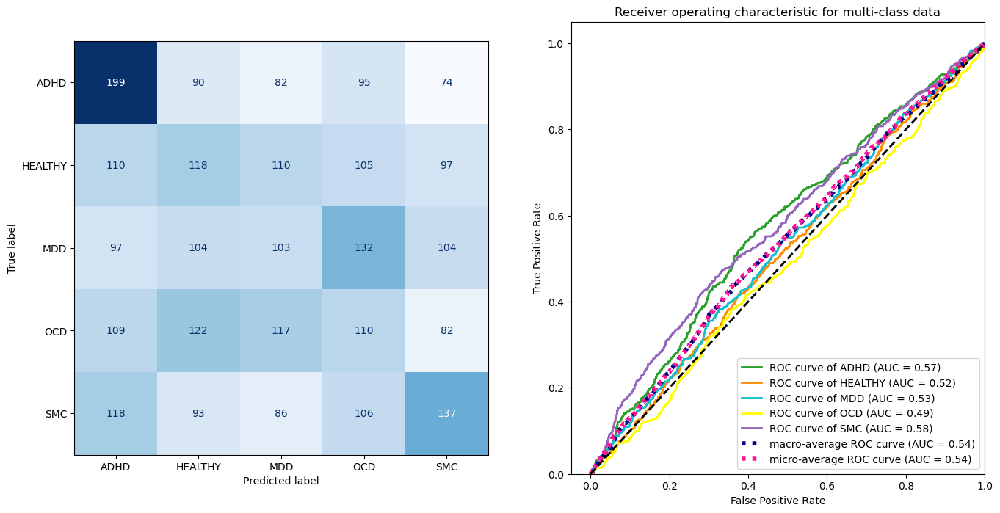

In [10]:
# final pipeline
best_params = {}
for hyperparameter in gridsearch.best_params_:
    key = hyperparameter[20:]
    best_params[key] = gridsearch.best_params_[hyperparameter]
print(best_params)

steps = [('col_trans', col_trans), ('pca', PCA()), ('rbf_svm', OneVsRestClassifier(SVC(**best_params, probability=True)))]
pipeline = Pipeline(steps)

# obtain predictions
Y_pred = cross_val_predict(pipeline, X, Y,  cv = cv_outer, groups = groups, n_jobs=-1, verbose=1)    
class_labels = le.inverse_transform(sorted(np.unique(Y)))
print('f1_score:', f1_score(Y, Y_pred, average = 'weighted', zero_division=0))
print()
print('classification report:\n', classification_report(Y, Y_pred, target_names=class_labels, zero_division=0))

# create subplots
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(16, 8))

# plot confusion matrix
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
conf_matrix = confusion_matrix(Y, Y_pred)
ConfusionMatrixDisplay(conf_matrix, display_labels = class_labels).plot(cmap = 'Blues', values_format = 'd', colorbar=False, ax=ax1)

# obtain proba predictions
Y_score = cross_val_predict(pipeline, X, Y,  cv = cv_outer, groups = groups, n_jobs=-1, verbose=1, method='predict_proba')

### plot ROC curves
from sklearn.metrics import roc_curve, auc
n_classes = Y_one_hot.shape[1]

fpr = dict()
tpr = dict()
roc_auc = dict()
lw=2


for i in range(n_classes):
    fpr[i], tpr[i], _ = roc_curve(Y_one_hot[:, i], Y_score[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])
colors = ['tab:green', 'darkorange', 'tab:cyan', 'yellow', 'tab:purple']
for i, color in zip(range(n_classes), colors):
    ax2.plot(fpr[i], tpr[i], color=color, lw=2,
             label=f'ROC curve of {class_labels[i]} (AUC = {roc_auc[i]:0.2f})')
    
## Compute macro-average ROC curve and AUC
fpr_grid = np.linspace(0.0, 1.0, 1000)

# Interpolate all ROC curves at these points
mean_tpr = np.zeros_like(fpr_grid)

for i in range(n_classes):
    mean_tpr += np.interp(fpr_grid, fpr[i], tpr[i])  # linear interpolation

# Average it and compute AUC
mean_tpr /= n_classes

fpr["macro"] = fpr_grid
tpr["macro"] = mean_tpr
roc_auc["macro"] = auc(fpr["macro"], tpr["macro"])
ax2.plot(
    fpr["macro"],
    tpr["macro"],
    label=f"macro-average ROC curve (AUC = {roc_auc['macro']:.2f})",
    color="navy",
    linestyle=":",
    linewidth=4,
)    
## Compute micro-average ROC curve and AUC
fpr["micro"], tpr["micro"], _ = roc_curve(Y_one_hot.ravel(), Y_score.ravel())
roc_auc["micro"] = auc(fpr["micro"], tpr["micro"])
ax2.plot(
    fpr["micro"],
    tpr["micro"],
    label=f"micro-average ROC curve (AUC = {roc_auc['micro']:.2f})",
    color="deeppink",
    linestyle=":",
    linewidth=4,
)


ax2.plot([0, 1], [0, 1], 'k--', lw=lw)
ax2.set_xlim([-0.05, 1.0])
ax2.set_ylim([0.0, 1.05])
ax2.set_xlabel('False Positive Rate')
ax2.set_ylabel('True Positive Rate')
ax2.set_title('Receiver operating characteristic for multi-class data')
ax2.legend(loc="lower right")
plt.show()

Checking feature importance

len(X) = 2700
X_train.shape = (2028, 60), X_test.shape = (672, 60), Y_train.shape = (2028,), Y_test.shape = (672,)


Text(0.5, 1.0, 'Difference between training - testing data')

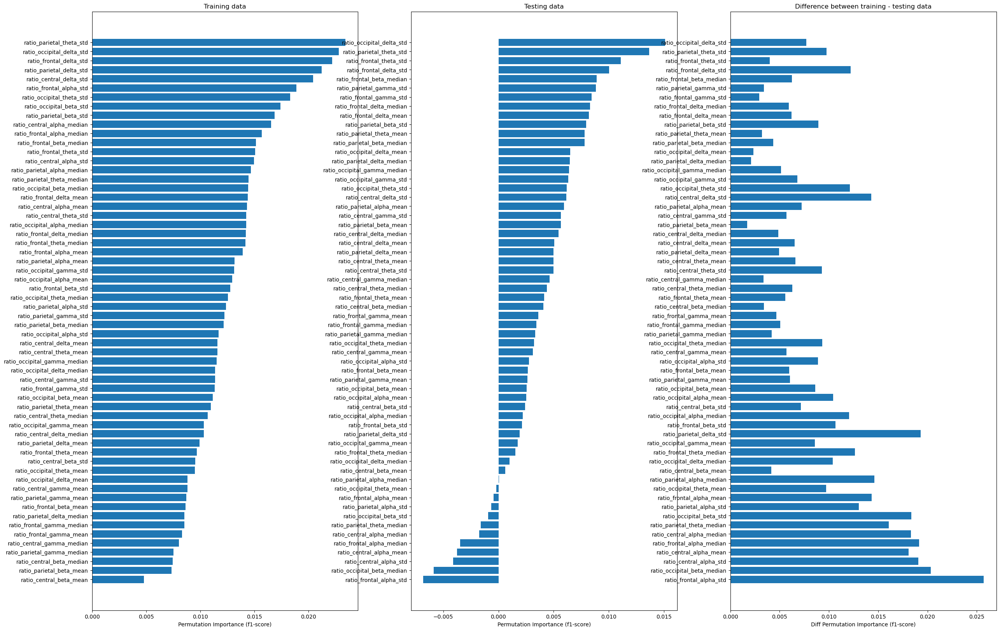

In [11]:
# using permutation_importance(), but according to literature it isn't a very reliable method for SVC with rbf kernel
from sklearn.inspection import permutation_importance

# splitting data into train and test set
desired_test_ratio = 0.25
n_splits = int(1 / desired_test_ratio) # for some reason (?), n_splits also determines the proportion between train & test indices
sgkf = StratifiedGroupKFold(n_splits=n_splits, shuffle=False)
train_idxs, test_idxs = sgkf.split(X, Y, groups).__next__() # just take the first split
print(f'{len(X) = }')

X_train = X.iloc[train_idxs]
X_test = X.iloc[test_idxs]
Y_train = Y[train_idxs]
Y_test = Y[test_idxs]
print(f'{X_train.shape = }, {X_test.shape = }, {Y_train.shape = }, {Y_test.shape = }')

# fit pipeline to training data
pipeline_fit = pipeline.fit(X_train, Y_train)
train_perm_importance = permutation_importance(pipeline_fit, X_train, Y_train,
                                    n_repeats=5, random_state=42,
                                    n_jobs=-1, scoring=f1_scorer)

train_sorted_idx = train_perm_importance.importances_mean.argsort()

fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(30, 20))
ax1.barh(X.columns[train_sorted_idx], train_perm_importance.importances_mean[train_sorted_idx])
ax1.set_xlabel("Permutation Importance (f1-score)")
ax1.set_title('Training data')

# fit pipeline to test data
test_perm_importance = permutation_importance(pipeline_fit, X_test, Y_test,
                                    n_repeats=5, random_state=42,
                                    n_jobs=-1, scoring=f1_scorer)

test_sorted_idx = test_perm_importance.importances_mean.argsort()
ax2.barh(X.columns[test_sorted_idx], test_perm_importance.importances_mean[test_sorted_idx])
ax2.set_xlabel("Permutation Importance (f1-score)")
ax2.set_title('Testing data')

# plot difference between training and testing permutation importance (im not entirely
# sure if the indices are the same for both test/train data, as the importances_mean attribute is just a numpy array)
diff = train_perm_importance.importances_mean - test_perm_importance.importances_mean
ax3.barh(X.columns[test_sorted_idx], diff[test_sorted_idx])
ax3.set_xlabel("Diff Permutation Importance (f1-score)")
ax3.set_title('Difference between training - testing data')

#### EC feature set

In [15]:
from sklearn import svm
from sklearn.preprocessing import StandardScaler
from sklearn import metrics
from sklearn.model_selection import StratifiedGroupKFold, GridSearchCV, GroupShuffleSplit
from sklearn.model_selection import train_test_split, cross_val_score, cross_val_predict, cross_validate
from sklearn.metrics import classification_report, confusion_matrix, f1_score, make_scorer, fbeta_score
from sklearn.metrics import make_scorer, accuracy_score, precision_score, recall_score, f1_score
from sklearn.pipeline import Pipeline, make_pipeline
from sklearn.impute import SimpleImputer
from sklearn import preprocessing
from sklearn.decomposition import PCA
from sklearn.compose import ColumnTransformer
from sklearn.svm import SVC
from sklearn.multiclass import OneVsRestClassifier


# assign groups (IDs) for GroupKFold
groups = df_features_ec_nosk['ID'].tolist()
print(f'# of instances: {len(groups)}')

# define numeric columns
numeric_cols = []
for cond in ['EC']:
    for band in bands:
        for group in channel_groups:
            for stat in ['std', 'mean', 'median']:
                numeric_cols.append(f'{cond}_{group}_{band}_{stat}')
 
X = df_features_ec_nosk[numeric_cols]
Y = df_features_ec_nosk['diagnosis']
# label binarize diagnosis for ROC curve (alphabatic order by default)
# & label encode diagnosis for predictions
from sklearn import preprocessing
lb = preprocessing.LabelBinarizer()
Y_one_hot = lb.fit_transform(Y)
print(Y_one_hot.shape)
le = preprocessing.LabelEncoder()
Y = le.fit_transform(Y)

# preprocessing steps for numerical features
numeric_transformer = Pipeline(steps = [
    ('scaler', StandardScaler()), # standardization
    ('impute', SimpleImputer(strategy='mean')) # mean imputation
])

col_trans = ColumnTransformer(transformers=[
    ('numeric_transformer', numeric_transformer, numeric_cols)
    ],
    remainder='drop',
    n_jobs=-1)

# hyperparameter ranges for GridSearch
param_grid = {
'rbf_svm__estimator__C': [0.01, 0.1, 1, 10, 100],
'rbf_svm__estimator__gamma': [0.1, 1, 10, 100],
'rbf_svm__estimator__kernel': ['rbf'],
'rbf_svm__estimator__class_weight': ['balanced']
}

# final pipeline
steps = [('col_trans', col_trans), ('pca', PCA()), ('rbf_svm', OneVsRestClassifier(SVC(class_weight = 'balanced')))]
pipeline = Pipeline(steps)

# define score metric
f1_scorer = make_scorer(fbeta_score, beta=1, average='weighted')

# define inner & outer CV objects
cv_inner = StratifiedGroupKFold(n_splits = 3, shuffle=False) # shuffle=False, so splits will be the same across calls (?)
cv_outer = StratifiedGroupKFold(n_splits = 5, shuffle=False) # shuffle=False, so splits will be the same across calls (?)

# define gridsearch
gridsearch = GridSearchCV(pipeline,
                        param_grid = param_grid,
                        cv = cv_inner, # use inner cv for hyperparameter tuning
                        scoring = f1_scorer,
                        error_score = 'raise',
                        return_train_score = True,
                        n_jobs=-1,
                        verbose=1)

# non-nested CV for obtaining the propable best hyperparameters
gridsearch_fit = gridsearch.fit(X, Y, groups = groups)
print(f'Best parameters: {gridsearch_fit.best_params_}')
print(f'Best f1-score: {gridsearch_fit.best_score_}')

# nested CV with parameter optimization to compute testing score (f1-score)
svm_test_score = cross_val_score(gridsearch, # use unfitted gridsearch object, (idk if this matters)
                                 X = X, y = Y, 
                                 cv = cv_outer, # use outer cv for model evaluation
                                 groups = groups, 
                                 fit_params={"groups": groups},
                                 scoring = f1_scorer,
                                 error_score = 'raise',
                                 verbose=1,
                                 n_jobs=-1)
print('SVM test scores:', svm_test_score)
print('Mean SVM test score:', np.mean(svm_test_score))


# of instances: 2700
(2700, 5)
Fitting 3 folds for each of 20 candidates, totalling 60 fits
Best parameters: {'rbf_svm__estimator__C': 1, 'rbf_svm__estimator__class_weight': 'balanced', 'rbf_svm__estimator__gamma': 0.1, 'rbf_svm__estimator__kernel': 'rbf'}
Best f1-score: 0.2539741842125564


/home/tsmolders/.conda/envs/py3117/lib/python3.11/site-packages/sklearn/model_selection/_validation.py:73: FutureWarning: `fit_params` is deprecated and will be removed in version 1.6. Pass parameters via `params` instead.
  warnings.warn(
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 30 concurrent workers.
/home/tsmolders/.conda/envs/py3117/lib/python3.11/site-packages/sklearn/utils/extmath.py:1144: RuntimeWarning: invalid value encountered in divide
  * (last_sum / last_over_new_count - new_sum) ** 2
/home/tsmolders/.conda/envs/py3117/lib/python3.11/site-packages/sklearn/utils/extmath.py:1144: RuntimeWarning: invalid value encountered in divide
  * (last_sum / last_over_new_count - new_sum) ** 2
/home/tsmolders/.conda/envs/py3117/lib/python3.11/site-packages/sklearn/utils/extmath.py:1144: RuntimeWarning: invalid value encountered in divide
  * (last_sum / last_over_new_count - new_sum) ** 2
/home/tsmolders/.conda/envs/py3117/lib/python3.11/site-packages/sklearn/utils/extmath.

SVM test scores: [0.26886613 0.28451167 0.26191349 0.22636102 0.25655076]
Mean SVM test score: 0.2596406132118948


[Parallel(n_jobs=-1)]: Done   5 out of   5 | elapsed:   24.9s finished


In [7]:
# calculate std (CAREFUL: WAS CALCULATED AFTERWARDS, SO NUMBERS DO NOT UPDATE AUTOMATICALLY)
print(np.std([0.26886613, 0.28451167, 0.26191349, 0.22636102, 0.25655076]))

0.019109809585021616


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 30 concurrent workers.


{'C': 1, 'class_weight': 'balanced', 'gamma': 0.1, 'kernel': 'rbf'}


[Parallel(n_jobs=-1)]: Done   5 out of   5 | elapsed:    7.8s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 30 concurrent workers.


f1_score: 0.25854089765830074

classification report:
               precision    recall  f1-score   support

        ADHD       0.34      0.37      0.35       540
     HEALTHY       0.25      0.24      0.24       540
         MDD       0.21      0.19      0.20       540
         OCD       0.20      0.21      0.21       540
         SMC       0.28      0.29      0.29       540

    accuracy                           0.26      2700
   macro avg       0.26      0.26      0.26      2700
weighted avg       0.26      0.26      0.26      2700



[Parallel(n_jobs=-1)]: Done   5 out of   5 | elapsed:    7.9s finished


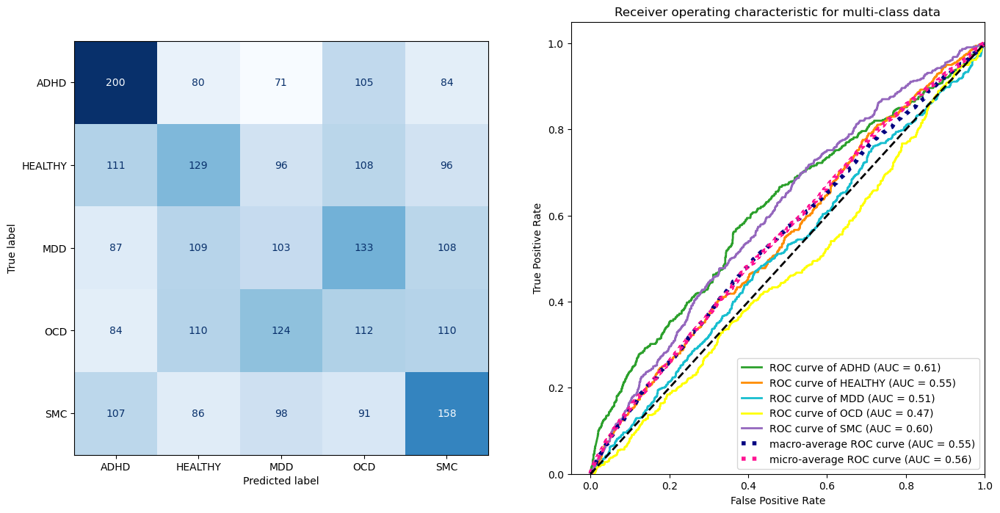

In [16]:
# final pipeline
best_params = {}
for hyperparameter in gridsearch.best_params_:
    key = hyperparameter[20:]
    best_params[key] = gridsearch.best_params_[hyperparameter]
print(best_params)

steps = [('col_trans', col_trans), ('pca', PCA()), ('rbf_svm', OneVsRestClassifier(SVC(**best_params, probability=True)))]
pipeline = Pipeline(steps)

# obtain predictions
Y_pred = cross_val_predict(pipeline, X, Y,  cv = cv_outer, groups = groups, n_jobs=-1, verbose=1)    
class_labels = le.inverse_transform(sorted(np.unique(Y)))
print('f1_score:', f1_score(Y, Y_pred, average = 'weighted', zero_division=0))
print()
print('classification report:\n', classification_report(Y, Y_pred, target_names=class_labels, zero_division=0))

# create subplots
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(16, 8))

# plot confusion matrix
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
conf_matrix = confusion_matrix(Y, Y_pred)
ConfusionMatrixDisplay(conf_matrix, display_labels = class_labels).plot(cmap = 'Blues', values_format = 'd', colorbar=False, ax=ax1)

# obtain proba predictions
Y_score = cross_val_predict(pipeline, X, Y,  cv = cv_outer, groups = groups, n_jobs=-1, verbose=1, method='predict_proba')

### plot ROC curves
from sklearn.metrics import roc_curve, auc
n_classes = Y_one_hot.shape[1]

fpr = dict()
tpr = dict()
roc_auc = dict()
lw=2


for i in range(n_classes):
    fpr[i], tpr[i], _ = roc_curve(Y_one_hot[:, i], Y_score[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])
colors = ['tab:green', 'darkorange', 'tab:cyan', 'yellow', 'tab:purple']
for i, color in zip(range(n_classes), colors):
    ax2.plot(fpr[i], tpr[i], color=color, lw=2,
             label=f'ROC curve of {class_labels[i]} (AUC = {roc_auc[i]:0.2f})')
    
## Compute macro-average ROC curve and AUC
fpr_grid = np.linspace(0.0, 1.0, 1000)

# Interpolate all ROC curves at these points
mean_tpr = np.zeros_like(fpr_grid)

for i in range(n_classes):
    mean_tpr += np.interp(fpr_grid, fpr[i], tpr[i])  # linear interpolation

# Average it and compute AUC
mean_tpr /= n_classes

fpr["macro"] = fpr_grid
tpr["macro"] = mean_tpr
roc_auc["macro"] = auc(fpr["macro"], tpr["macro"])
ax2.plot(
    fpr["macro"],
    tpr["macro"],
    label=f"macro-average ROC curve (AUC = {roc_auc['macro']:.2f})",
    color="navy",
    linestyle=":",
    linewidth=4,
)    
## Compute micro-average ROC curve and AUC
fpr["micro"], tpr["micro"], _ = roc_curve(Y_one_hot.ravel(), Y_score.ravel())
roc_auc["micro"] = auc(fpr["micro"], tpr["micro"])
ax2.plot(
    fpr["micro"],
    tpr["micro"],
    label=f"micro-average ROC curve (AUC = {roc_auc['micro']:.2f})",
    color="deeppink",
    linestyle=":",
    linewidth=4,
)


ax2.plot([0, 1], [0, 1], 'k--', lw=lw)
ax2.set_xlim([-0.05, 1.0])
ax2.set_ylim([0.0, 1.05])
ax2.set_xlabel('False Positive Rate')
ax2.set_ylabel('True Positive Rate')
ax2.set_title('Receiver operating characteristic for multi-class data')
ax2.legend(loc="lower right")
plt.show()

Checking feature importance

len(X) = 2700
X_train.shape = (2028, 60), X_test.shape = (672, 60), Y_train.shape = (2028,), Y_test.shape = (672,)


Text(0.5, 1.0, 'Difference between training - testing data')

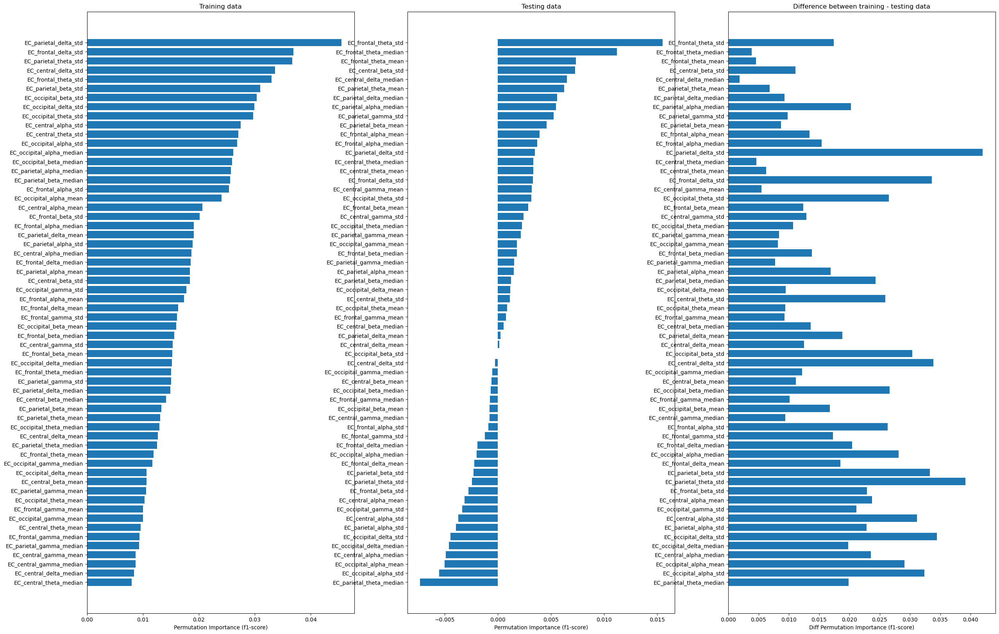

In [17]:
# using permutation_importance(), but according to literature it isn't a very reliable method for SVC with rbf kernel
from sklearn.inspection import permutation_importance

# splitting data into train and test set
desired_test_ratio = 0.25
n_splits = int(1 / desired_test_ratio) # for some reason (?), n_splits also determines the proportion between train & test indices
sgkf = StratifiedGroupKFold(n_splits=n_splits, shuffle=False)
train_idxs, test_idxs = sgkf.split(X, Y, groups).__next__() # just take the first split
print(f'{len(X) = }')

X_train = X.iloc[train_idxs]
X_test = X.iloc[test_idxs]
Y_train = Y[train_idxs]
Y_test = Y[test_idxs]
print(f'{X_train.shape = }, {X_test.shape = }, {Y_train.shape = }, {Y_test.shape = }')

# fit pipeline to training data
pipeline_fit = pipeline.fit(X_train, Y_train)
train_perm_importance = permutation_importance(pipeline_fit, X_train, Y_train,
                                    n_repeats=5, random_state=42,
                                    n_jobs=-1, scoring=f1_scorer)

train_sorted_idx = train_perm_importance.importances_mean.argsort()

fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(30, 20))
ax1.barh(X.columns[train_sorted_idx], train_perm_importance.importances_mean[train_sorted_idx])
ax1.set_xlabel("Permutation Importance (f1-score)")
ax1.set_title('Training data')

# fit pipeline to test data
test_perm_importance = permutation_importance(pipeline_fit, X_test, Y_test,
                                    n_repeats=5, random_state=42,
                                    n_jobs=-1, scoring=f1_scorer)

test_sorted_idx = test_perm_importance.importances_mean.argsort()
ax2.barh(X.columns[test_sorted_idx], test_perm_importance.importances_mean[test_sorted_idx])
ax2.set_xlabel("Permutation Importance (f1-score)")
ax2.set_title('Testing data')

# plot difference between training and testing permutation importance (im not entirely
# sure if the indices are the same for both test/train data, as the importances_mean attribute is just a numpy array)
diff = train_perm_importance.importances_mean - test_perm_importance.importances_mean
ax3.barh(X.columns[test_sorted_idx], diff[test_sorted_idx])
ax3.set_xlabel("Diff Permutation Importance (f1-score)")
ax3.set_title('Difference between training - testing data')

#### EO feature set

In [18]:
from sklearn import svm
from sklearn.preprocessing import StandardScaler
from sklearn import metrics
from sklearn.model_selection import StratifiedGroupKFold, GridSearchCV, GroupShuffleSplit
from sklearn.model_selection import train_test_split, cross_val_score, cross_val_predict, cross_validate
from sklearn.metrics import classification_report, confusion_matrix, f1_score, make_scorer, fbeta_score
from sklearn.metrics import make_scorer, accuracy_score, precision_score, recall_score, f1_score
from sklearn.pipeline import Pipeline, make_pipeline
from sklearn.impute import SimpleImputer
from sklearn import preprocessing
from sklearn.decomposition import PCA
from sklearn.compose import ColumnTransformer
from sklearn.svm import SVC
from sklearn.multiclass import OneVsRestClassifier


# assign groups (IDs) for GroupKFold
groups = df_features_eo_nosk['ID'].tolist()
print(f'# of instances: {len(groups)}')

# define numeric columns
numeric_cols = []
for cond in ['EO']:
    for band in bands:
        for group in channel_groups:
            for stat in ['std', 'mean', 'median']:
                numeric_cols.append(f'{cond}_{group}_{band}_{stat}')
 
X = df_features_eo_nosk[numeric_cols]
Y = df_features_eo_nosk['diagnosis']
# label binarize diagnosis for ROC curve (alphabatic order by default)
# & label encode diagnosis for predictions
from sklearn import preprocessing
lb = preprocessing.LabelBinarizer()
Y_one_hot = lb.fit_transform(Y)
print(Y_one_hot.shape)
le = preprocessing.LabelEncoder()
Y = le.fit_transform(Y)

# preprocessing steps for numerical features
numeric_transformer = Pipeline(steps = [
    ('scaler', StandardScaler()), # standardization
    ('impute', SimpleImputer(strategy='mean')) # mean imputation
])

col_trans = ColumnTransformer(transformers=[
    ('numeric_transformer', numeric_transformer, numeric_cols)
    ],
    remainder='drop',
    n_jobs=-1)

# hyperparameter ranges for GridSearch
param_grid = {
'rbf_svm__estimator__C': [0.01, 0.1, 1, 10, 100],
'rbf_svm__estimator__gamma': [0.1, 1, 10, 100],
'rbf_svm__estimator__kernel': ['rbf'],
'rbf_svm__estimator__class_weight': ['balanced']
}

# final pipeline
steps = [('col_trans', col_trans), ('pca', PCA()), ('rbf_svm', OneVsRestClassifier(SVC(class_weight = 'balanced')))]
pipeline = Pipeline(steps)

# define score metric
f1_scorer = make_scorer(fbeta_score, beta=1, average='weighted')

# define inner & outer CV objects
cv_inner = StratifiedGroupKFold(n_splits = 3, shuffle=False) # shuffle=False, so splits will be the same across calls (?)
cv_outer = StratifiedGroupKFold(n_splits = 5, shuffle=False) # shuffle=False, so splits will be the same across calls (?)

# define gridsearch
gridsearch = GridSearchCV(pipeline,
                        param_grid = param_grid,
                        cv = cv_inner, # use inner cv for hyperparameter tuning
                        scoring = f1_scorer,
                        error_score = 'raise',
                        return_train_score = True,
                        n_jobs=-1,
                        verbose=1)

# non-nested CV for obtaining the propable best hyperparameters
gridsearch_fit = gridsearch.fit(X, Y, groups = groups)
print(f'Best parameters: {gridsearch_fit.best_params_}')
print(f'Best f1-score: {gridsearch_fit.best_score_}')

# nested CV with parameter optimization to compute testing score (f1-score)
svm_test_score = cross_val_score(gridsearch, # use unfitted gridsearch object, (idk if this matters)
                                 X = X, y = Y, 
                                 cv = cv_outer, # use outer cv for model evaluation
                                 groups = groups, 
                                 fit_params={"groups": groups},
                                 scoring = f1_scorer,
                                 error_score = 'raise',
                                 verbose=1,
                                 n_jobs=-1)
print('SVM test scores:', svm_test_score)
print('Mean SVM test score:', np.mean(svm_test_score))


# of instances: 2700
(2700, 5)
Fitting 3 folds for each of 20 candidates, totalling 60 fits
Best parameters: {'rbf_svm__estimator__C': 1, 'rbf_svm__estimator__class_weight': 'balanced', 'rbf_svm__estimator__gamma': 0.1, 'rbf_svm__estimator__kernel': 'rbf'}
Best f1-score: 0.2971491679553001


/home/tsmolders/.conda/envs/py3117/lib/python3.11/site-packages/sklearn/model_selection/_validation.py:73: FutureWarning: `fit_params` is deprecated and will be removed in version 1.6. Pass parameters via `params` instead.
  warnings.warn(
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 30 concurrent workers.
/home/tsmolders/.conda/envs/py3117/lib/python3.11/site-packages/sklearn/utils/extmath.py:1144: RuntimeWarning: invalid value encountered in divide
  * (last_sum / last_over_new_count - new_sum) ** 2
/home/tsmolders/.conda/envs/py3117/lib/python3.11/site-packages/sklearn/utils/extmath.py:1144: RuntimeWarning: invalid value encountered in divide
  * (last_sum / last_over_new_count - new_sum) ** 2
/home/tsmolders/.conda/envs/py3117/lib/python3.11/site-packages/sklearn/utils/extmath.py:1144: RuntimeWarning: invalid value encountered in divide
  * (last_sum / last_over_new_count - new_sum) ** 2
/home/tsmolders/.conda/envs/py3117/lib/python3.11/site-packages/sklearn/utils/extmath.

SVM test scores: [0.32930619 0.27131127 0.28440761 0.24365777 0.24162958]
Mean SVM test score: 0.2740624836520481


[Parallel(n_jobs=-1)]: Done   5 out of   5 | elapsed:   24.6s finished


In [10]:
# calculate std (CAREFUL: WAS CALCULATED AFTERWARDS, SO NUMBERS DO NOT UPDATE AUTOMATICALLY)
print(np.std([0.32930619, 0.27131127, 0.28440761, 0.24365777, 0.24162958]))

0.0320711638651893


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 30 concurrent workers.


{'C': 1, 'class_weight': 'balanced', 'gamma': 0.1, 'kernel': 'rbf'}


[Parallel(n_jobs=-1)]: Done   5 out of   5 | elapsed:    7.8s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 30 concurrent workers.


f1_score: 0.2768511849137289

classification report:
               precision    recall  f1-score   support

        ADHD       0.33      0.41      0.37       540
     HEALTHY       0.26      0.23      0.25       540
         MDD       0.25      0.25      0.25       540
         OCD       0.25      0.22      0.24       540
         SMC       0.29      0.28      0.28       540

    accuracy                           0.28      2700
   macro avg       0.28      0.28      0.28      2700
weighted avg       0.28      0.28      0.28      2700



[Parallel(n_jobs=-1)]: Done   5 out of   5 | elapsed:    7.7s finished


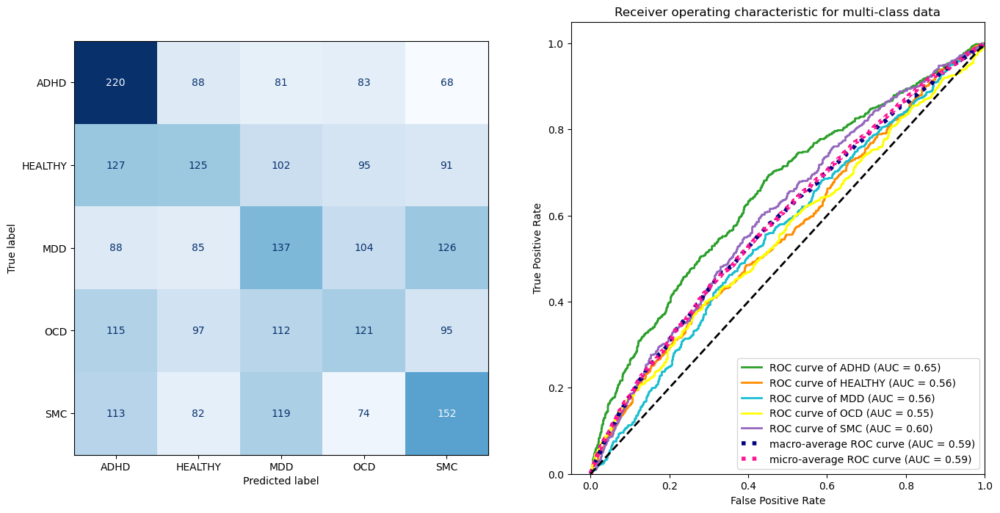

In [19]:
# final pipeline
best_params = {}
for hyperparameter in gridsearch.best_params_:
    key = hyperparameter[20:]
    best_params[key] = gridsearch.best_params_[hyperparameter]
print(best_params)

steps = [('col_trans', col_trans), ('pca', PCA()), ('rbf_svm', OneVsRestClassifier(SVC(**best_params, probability=True)))]
pipeline = Pipeline(steps)

# obtain predictions
Y_pred = cross_val_predict(pipeline, X, Y,  cv = cv_outer, groups = groups, n_jobs=-1, verbose=1)    
class_labels = le.inverse_transform(sorted(np.unique(Y)))
print('f1_score:', f1_score(Y, Y_pred, average = 'weighted', zero_division=0))
print()
print('classification report:\n', classification_report(Y, Y_pred, target_names=class_labels, zero_division=0))

# create subplots
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(16, 8))

# plot confusion matrix
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
conf_matrix = confusion_matrix(Y, Y_pred)
ConfusionMatrixDisplay(conf_matrix, display_labels = class_labels).plot(cmap = 'Blues', values_format = 'd', colorbar=False, ax=ax1)

# obtain proba predictions
Y_score = cross_val_predict(pipeline, X, Y,  cv = cv_outer, groups = groups, n_jobs=-1, verbose=1, method='predict_proba')

### plot ROC curves
from sklearn.metrics import roc_curve, auc
n_classes = Y_one_hot.shape[1]

fpr = dict()
tpr = dict()
roc_auc = dict()
lw=2


for i in range(n_classes):
    fpr[i], tpr[i], _ = roc_curve(Y_one_hot[:, i], Y_score[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])
colors = ['tab:green', 'darkorange', 'tab:cyan', 'yellow', 'tab:purple']
for i, color in zip(range(n_classes), colors):
    ax2.plot(fpr[i], tpr[i], color=color, lw=2,
             label=f'ROC curve of {class_labels[i]} (AUC = {roc_auc[i]:0.2f})')
    
## Compute macro-average ROC curve and AUC
fpr_grid = np.linspace(0.0, 1.0, 1000)

# Interpolate all ROC curves at these points
mean_tpr = np.zeros_like(fpr_grid)

for i in range(n_classes):
    mean_tpr += np.interp(fpr_grid, fpr[i], tpr[i])  # linear interpolation

# Average it and compute AUC
mean_tpr /= n_classes

fpr["macro"] = fpr_grid
tpr["macro"] = mean_tpr
roc_auc["macro"] = auc(fpr["macro"], tpr["macro"])
ax2.plot(
    fpr["macro"],
    tpr["macro"],
    label=f"macro-average ROC curve (AUC = {roc_auc['macro']:.2f})",
    color="navy",
    linestyle=":",
    linewidth=4,
)    
## Compute micro-average ROC curve and AUC
fpr["micro"], tpr["micro"], _ = roc_curve(Y_one_hot.ravel(), Y_score.ravel())
roc_auc["micro"] = auc(fpr["micro"], tpr["micro"])
ax2.plot(
    fpr["micro"],
    tpr["micro"],
    label=f"micro-average ROC curve (AUC = {roc_auc['micro']:.2f})",
    color="deeppink",
    linestyle=":",
    linewidth=4,
)


ax2.plot([0, 1], [0, 1], 'k--', lw=lw)
ax2.set_xlim([-0.05, 1.0])
ax2.set_ylim([0.0, 1.05])
ax2.set_xlabel('False Positive Rate')
ax2.set_ylabel('True Positive Rate')
ax2.set_title('Receiver operating characteristic for multi-class data')
ax2.legend(loc="lower right")
plt.show()

Checking feature importance

len(X) = 2700
X_train.shape = (2028, 60), X_test.shape = (672, 60), Y_train.shape = (2028,), Y_test.shape = (672,)


Text(0.5, 1.0, 'Difference between training - testing data')

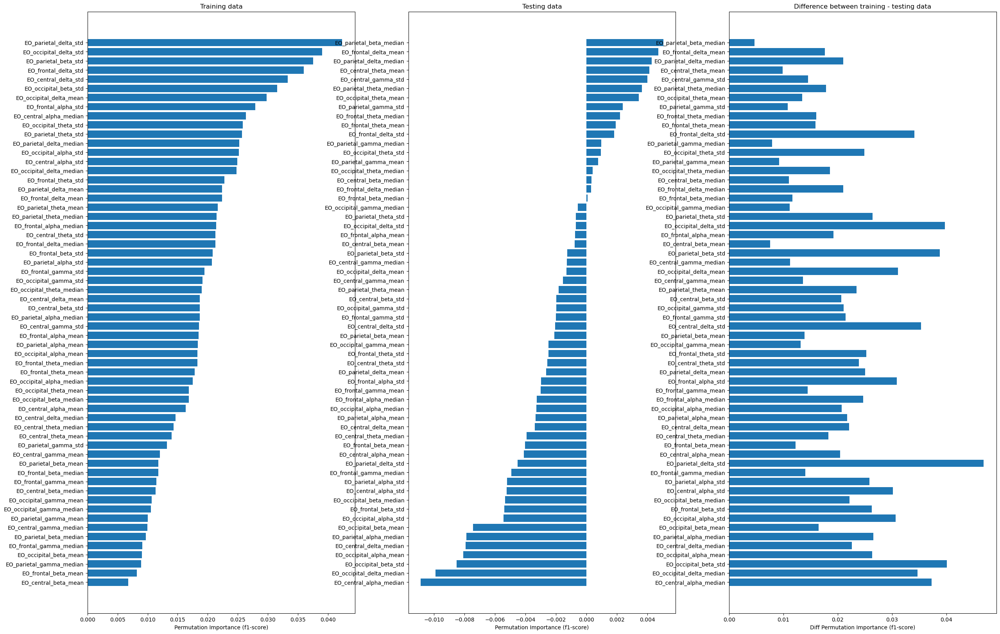

In [20]:
# using permutation_importance(), but according to literature it isn't a very reliable method for SVC with rbf kernel
from sklearn.inspection import permutation_importance

# splitting data into train and test set
desired_test_ratio = 0.25
n_splits = int(1 / desired_test_ratio) # for some reason (?), n_splits also determines the proportion between train & test indices
sgkf = StratifiedGroupKFold(n_splits=n_splits, shuffle=False)
train_idxs, test_idxs = sgkf.split(X, Y, groups).__next__() # just take the first split
print(f'{len(X) = }')

X_train = X.iloc[train_idxs]
X_test = X.iloc[test_idxs]
Y_train = Y[train_idxs]
Y_test = Y[test_idxs]
print(f'{X_train.shape = }, {X_test.shape = }, {Y_train.shape = }, {Y_test.shape = }')

# fit pipeline to training data
pipeline_fit = pipeline.fit(X_train, Y_train)
train_perm_importance = permutation_importance(pipeline_fit, X_train, Y_train,
                                    n_repeats=5, random_state=42,
                                    n_jobs=-1, scoring=f1_scorer)

train_sorted_idx = train_perm_importance.importances_mean.argsort()

fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(30, 20))
ax1.barh(X.columns[train_sorted_idx], train_perm_importance.importances_mean[train_sorted_idx])
ax1.set_xlabel("Permutation Importance (f1-score)")
ax1.set_title('Training data')

# fit pipeline to test data
test_perm_importance = permutation_importance(pipeline_fit, X_test, Y_test,
                                    n_repeats=5, random_state=42,
                                    n_jobs=-1, scoring=f1_scorer)

test_sorted_idx = test_perm_importance.importances_mean.argsort()
ax2.barh(X.columns[test_sorted_idx], test_perm_importance.importances_mean[test_sorted_idx])
ax2.set_xlabel("Permutation Importance (f1-score)")
ax2.set_title('Testing data')

# plot difference between training and testing permutation importance (im not entirely
# sure if the indices are the same for both test/train data, as the importances_mean attribute is just a numpy array)
diff = train_perm_importance.importances_mean - test_perm_importance.importances_mean
ax3.barh(X.columns[test_sorted_idx], diff[test_sorted_idx])
ax3.set_xlabel("Diff Permutation Importance (f1-score)")
ax3.set_title('Difference between training - testing data')

## Random Forest

#### ratio feature set

In [21]:
from sklearn.preprocessing import StandardScaler
from sklearn import metrics
from sklearn.model_selection import StratifiedGroupKFold, GridSearchCV, GroupShuffleSplit, RandomizedSearchCV
from sklearn.model_selection import train_test_split, cross_val_score, cross_val_predict, cross_validate
from sklearn.metrics import classification_report, confusion_matrix, f1_score, make_scorer, fbeta_score
from sklearn.metrics import make_scorer, accuracy_score, precision_score, recall_score, f1_score
from sklearn.pipeline import Pipeline, make_pipeline
from sklearn.impute import SimpleImputer
from sklearn import preprocessing
from sklearn.decomposition import PCA
from sklearn.compose import ColumnTransformer
from sklearn.ensemble import RandomForestClassifier


# assign groups (IDs) for GroupKFold
groups = df_features_ratio['ID'].tolist()
print(f'# of instances: {len(groups)}')

# define numeric columns
numeric_cols = []
for cond in ['ratio']:
    for band in bands:
        for group in channel_groups:
            for stat in ['std', 'mean', 'median', 'skew', 'kurt']:
                numeric_cols.append(f'{cond}_{group}_{band}_{stat}')
 
X = df_features_ratio[numeric_cols]
Y = df_features_ratio['diagnosis']

# label binarize diagnosis for ROC curve (alphabatic order by default)
# & label encode diagnosis for predictions
from sklearn import preprocessing
lb = preprocessing.LabelBinarizer()
Y_one_hot = lb.fit_transform(Y)
print(Y_one_hot.shape)
le = preprocessing.LabelEncoder()
Y = le.fit_transform(Y)

# preprocessing steps for numerical features
numeric_transformer = Pipeline(steps = [
    ('scaler', StandardScaler()), # standardization
    ('impute', SimpleImputer(strategy='mean')) # mean imputation
])

col_trans = ColumnTransformer(transformers=[
    ('numeric_transformer', numeric_transformer, numeric_cols)
    ],
    remainder='drop',
    n_jobs=-1)

# final pipeline
steps = [('col_trans', col_trans), ('pca', PCA()), ('RF', RandomForestClassifier())]
pipeline = Pipeline(steps)

# define score metric
f1_scorer = make_scorer(fbeta_score, beta=1, average='weighted')

# define inner & outer CV objects
cv_inner = StratifiedGroupKFold(n_splits = 3, shuffle=False) # shuffle=False, so splits will be the same across calls (?)
cv_outer = StratifiedGroupKFold(n_splits = 5, shuffle=False) # shuffle=False, so splits will be the same across calls (?)

## Hyperparameters for RandomizedSearchCV
# Number of trees in random forest
n_estimators = [int(x) for x in np.linspace(start = 200, stop = 2000, num = 10)]
# Number of features to consider at every split
max_features = ['log2', 'sqrt']
# Maximum number of levels in tree
max_depth = [int(x) for x in np.linspace(10, 110, num = 11)]
max_depth.append(None)
# Minimum number of samples required to split a node
min_samples_split = [2, 5, 10]
# Minimum number of samples required at each leaf node
min_samples_leaf = [1, 2, 4]
# Method of selecting samples for training each tree
bootstrap = [True, False]
# Create the random grid
random_grid = {'RF__n_estimators': n_estimators,
               'RF__max_features': max_features,
               'RF__max_depth': max_depth,
               'RF__min_samples_split': min_samples_split,
               'RF__min_samples_leaf': min_samples_leaf,
               'RF__bootstrap': bootstrap}

# define randomized search
randsearch = RandomizedSearchCV(pipeline,
                                param_distributions=random_grid,
                                n_iter=100, # 100
                                cv = cv_inner, # use inner cv for hyperparameter tuning
                                scoring = f1_scorer,
                                error_score = 'raise',
                                return_train_score = True,
                                n_jobs=-1,
                                verbose=1)

# non-nested CV for obtaining the propable best hyperparameters
randsearch_fit = randsearch.fit(X, Y, groups = groups)
print(f'Best parameters: {randsearch_fit.best_params_}')
print(f'Best f1-score: {randsearch_fit.best_score_}')

# nested CV with parameter optimization to compute testing score (f1-score)
rf_test_score = cross_val_score(randsearch, # use unfitted gridsearch object, (idk if this matters)
                                 X = X, y = Y, 
                                 cv = cv_outer, # use outer cv for model evaluation
                                 groups = groups, 
                                 fit_params={"groups": groups},
                                 scoring = f1_scorer,
                                 error_score = 'raise',
                                 verbose=1,
                                 n_jobs=-1)
print('RF test scores:', rf_test_score)
print('Mean RF test score:', np.mean(rf_test_score))


# of instances: 2700
(2700, 5)
Fitting 3 folds for each of 100 candidates, totalling 300 fits
Fitting 3 folds for each of 20 candidates, totalling 60 fits


/home/tsmolders/.conda/envs/py3117/lib/python3.11/site-packages/joblib/externals/loky/process_executor.py:700: UserWarning: A worker stopped while some jobs were given to the executor. This can be caused by a too short worker timeout or by a memory leak.
  warnings.warn(


Fitting 3 folds for each of 20 candidates, totalling 60 fits
Fitting 3 folds for each of 20 candidates, totalling 60 fits
Fitting 3 folds for each of 20 candidates, totalling 60 fits
Fitting 3 folds for each of 20 candidates, totalling 60 fits
Fitting 3 folds for each of 20 candidates, totalling 60 fits
Fitting 3 folds for each of 20 candidates, totalling 60 fits
Fitting 3 folds for each of 20 candidates, totalling 60 fits
Fitting 3 folds for each of 20 candidates, totalling 60 fits
Fitting 3 folds for each of 20 candidates, totalling 60 fits
Fitting 3 folds for each of 20 candidates, totalling 60 fits
Fitting 3 folds for each of 20 candidates, totalling 60 fits
Fitting 3 folds for each of 20 candidates, totalling 60 fits
Best parameters: {'RF__n_estimators': 1200, 'RF__min_samples_split': 10, 'RF__min_samples_leaf': 4, 'RF__max_features': 'log2', 'RF__max_depth': 70, 'RF__bootstrap': True}
Best f1-score: 0.26718973920491024


/home/tsmolders/.conda/envs/py3117/lib/python3.11/site-packages/sklearn/model_selection/_validation.py:73: FutureWarning: `fit_params` is deprecated and will be removed in version 1.6. Pass parameters via `params` instead.
  warnings.warn(
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 30 concurrent workers.
/home/tsmolders/.conda/envs/py3117/lib/python3.11/site-packages/sklearn/utils/extmath.py:1144: RuntimeWarning: invalid value encountered in divide
  * (last_sum / last_over_new_count - new_sum) ** 2
/home/tsmolders/.conda/envs/py3117/lib/python3.11/site-packages/sklearn/utils/extmath.py:1144: RuntimeWarning: invalid value encountered in divide
  * (last_sum / last_over_new_count - new_sum) ** 2
/home/tsmolders/.conda/envs/py3117/lib/python3.11/site-packages/sklearn/utils/extmath.py:1144: RuntimeWarning: invalid value encountered in divide
  * (last_sum / last_over_new_count - new_sum) ** 2


Fitting 3 folds for each of 20 candidates, totalling 60 fits
Fitting 3 folds for each of 20 candidates, totalling 60 fits
Fitting 3 folds for each of 100 candidates, totalling 300 fits
Fitting 3 folds for each of 100 candidates, totalling 300 fits
Fitting 3 folds for each of 100 candidates, totalling 300 fits
Fitting 3 folds for each of 100 candidates, totalling 300 fits
Fitting 3 folds for each of 100 candidates, totalling 300 fits
RF test scores: [0.27950468 0.23146263 0.18005203 0.21018583 0.25101782]
Mean RF test score: 0.23044459767667158


[Parallel(n_jobs=-1)]: Done   5 out of   5 | elapsed: 30.0min finished


In [11]:
# calculate std (CAREFUL: WAS CALCULATED AFTERWARDS, SO NUMBERS DO NOT UPDATE AUTOMATICALLY)
print(np.std([0.27950468, 0.23146263, 0.18005203, 0.21018583, 0.25101782]))

0.034002982483815974


{'n_estimators': 1200, 'min_samples_split': 10, 'min_samples_leaf': 4, 'max_features': 'log2', 'max_depth': 70, 'bootstrap': True}


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 30 concurrent workers.
/home/tsmolders/.conda/envs/py3117/lib/python3.11/site-packages/joblib/externals/loky/process_executor.py:700: UserWarning: A worker stopped while some jobs were given to the executor. This can be caused by a too short worker timeout or by a memory leak.
  warnings.warn(
[Parallel(n_jobs=-1)]: Done   5 out of   5 | elapsed:   15.4s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 30 concurrent workers.


f1_score: 0.24668382154109986

classification report:
               precision    recall  f1-score   support

        ADHD       0.33      0.32      0.32       540
     HEALTHY       0.18      0.16      0.17       540
         MDD       0.24      0.22      0.23       540
         OCD       0.21      0.22      0.21       540
         SMC       0.29      0.32      0.30       540

    accuracy                           0.25      2700
   macro avg       0.25      0.25      0.25      2700
weighted avg       0.25      0.25      0.25      2700



[Parallel(n_jobs=-1)]: Done   5 out of   5 | elapsed:   15.0s finished


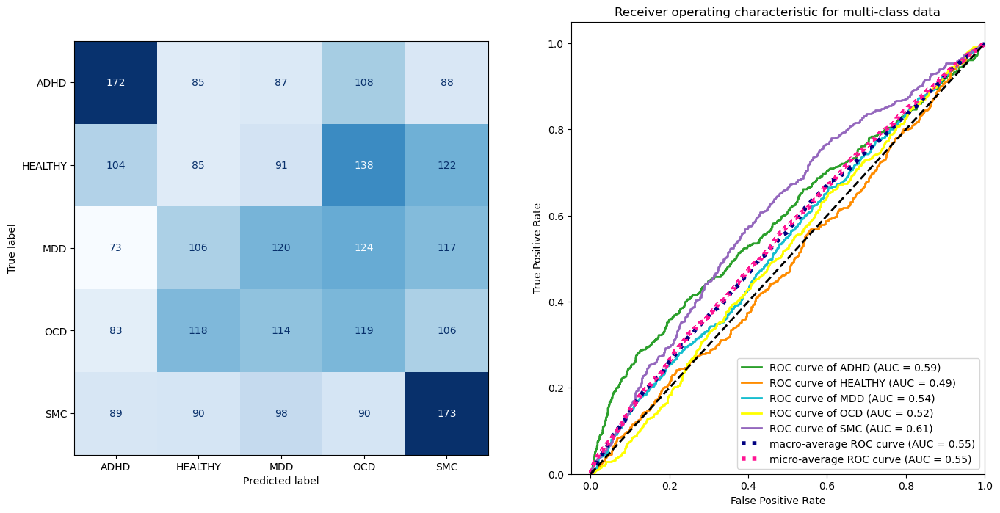

In [22]:
# final pipeline
best_params = {}
for hyperparameter in randsearch.best_params_:
    key = hyperparameter[4:]
    best_params[key] = randsearch.best_params_[hyperparameter]
print(best_params)

steps = [('col_trans', col_trans), ('pca', PCA()), ('RF', RandomForestClassifier(**best_params))]
pipeline = Pipeline(steps)

# obtain predictions
Y_pred = cross_val_predict(pipeline, X, Y,  cv = cv_outer, groups = groups, n_jobs=-1, verbose=1)    
class_labels = le.inverse_transform(sorted(np.unique(Y)))
print('f1_score:', f1_score(Y, Y_pred, average = 'weighted', zero_division=0))
print()
print('classification report:\n', classification_report(Y, Y_pred, target_names=class_labels, zero_division=0))

# create subplots
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(16, 8))

# plot confusion matrix
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
conf_matrix = confusion_matrix(Y, Y_pred)
ConfusionMatrixDisplay(conf_matrix, display_labels = class_labels).plot(cmap = 'Blues', values_format = 'd', colorbar=False, ax=ax1)

# obtain proba predictions
Y_score = cross_val_predict(pipeline, X, Y,  cv = cv_outer, groups = groups, n_jobs=-1, verbose=1, method='predict_proba')

### plot ROC curves
from sklearn.metrics import roc_curve, auc
n_classes = Y_one_hot.shape[1]

fpr = dict()
tpr = dict()
roc_auc = dict()
lw=2


for i in range(n_classes):
    fpr[i], tpr[i], _ = roc_curve(Y_one_hot[:, i], Y_score[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])
colors = ['tab:green', 'darkorange', 'tab:cyan', 'yellow', 'tab:purple']
for i, color in zip(range(n_classes), colors):
    ax2.plot(fpr[i], tpr[i], color=color, lw=2,
             label=f'ROC curve of {class_labels[i]} (AUC = {roc_auc[i]:0.2f})')
    
## Compute macro-average ROC curve and AUC
fpr_grid = np.linspace(0.0, 1.0, 1000)

# Interpolate all ROC curves at these points
mean_tpr = np.zeros_like(fpr_grid)

for i in range(n_classes):
    mean_tpr += np.interp(fpr_grid, fpr[i], tpr[i])  # linear interpolation

# Average it and compute AUC
mean_tpr /= n_classes

fpr["macro"] = fpr_grid
tpr["macro"] = mean_tpr
roc_auc["macro"] = auc(fpr["macro"], tpr["macro"])
ax2.plot(
    fpr["macro"],
    tpr["macro"],
    label=f"macro-average ROC curve (AUC = {roc_auc['macro']:.2f})",
    color="navy",
    linestyle=":",
    linewidth=4,
)    
## Compute micro-average ROC curve and AUC
fpr["micro"], tpr["micro"], _ = roc_curve(Y_one_hot.ravel(), Y_score.ravel())
roc_auc["micro"] = auc(fpr["micro"], tpr["micro"])
ax2.plot(
    fpr["micro"],
    tpr["micro"],
    label=f"micro-average ROC curve (AUC = {roc_auc['micro']:.2f})",
    color="deeppink",
    linestyle=":",
    linewidth=4,
)


ax2.plot([0, 1], [0, 1], 'k--', lw=lw)
ax2.set_xlim([-0.05, 1.0])
ax2.set_ylim([0.0, 1.05])
ax2.set_xlabel('False Positive Rate')
ax2.set_ylabel('True Positive Rate')
ax2.set_title('Receiver operating characteristic for multi-class data')
ax2.legend(loc="lower right")
plt.show()

Checking feature importance

len(X) = 2700
X_train.shape = (2028, 100), X_test.shape = (672, 100), Y_train.shape = (2028,), Y_test.shape = (672,)


Text(0.5, 1.0, 'Difference between training - testing data')

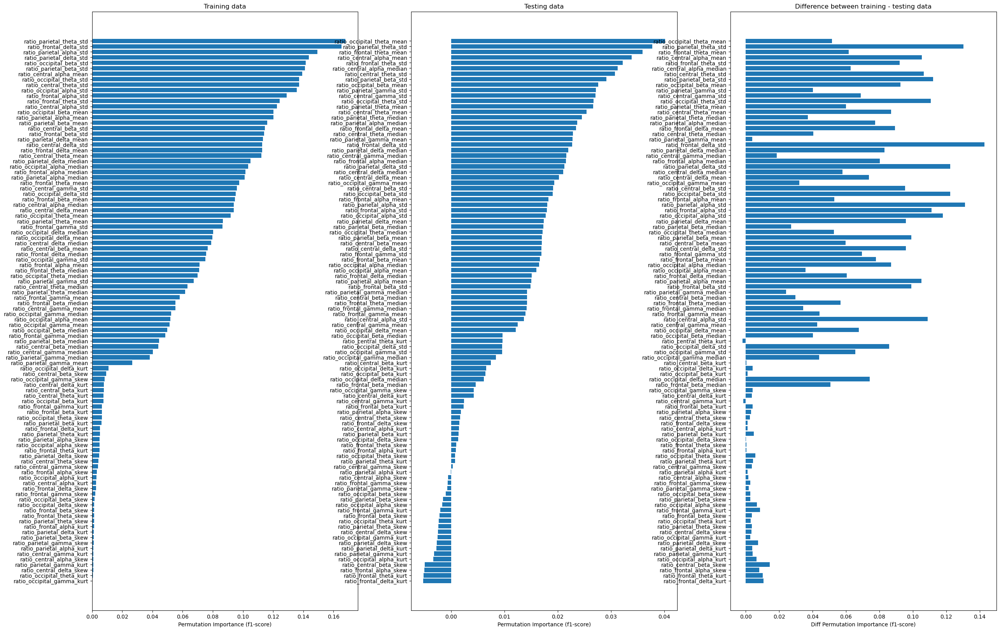

In [23]:
# using permutation_importance()
from sklearn.inspection import permutation_importance

# splitting data into train and test set
desired_test_ratio = 0.25
n_splits = int(1 / desired_test_ratio) # for some reason (?), n_splits also determines the proportion between train & test indices
sgkf = StratifiedGroupKFold(n_splits=n_splits, shuffle=False)
train_idxs, test_idxs = sgkf.split(X, Y, groups).__next__() # just take the first split
print(f'{len(X) = }')

X_train = X.iloc[train_idxs]
X_test = X.iloc[test_idxs]
Y_train = Y[train_idxs]
Y_test = Y[test_idxs]
print(f'{X_train.shape = }, {X_test.shape = }, {Y_train.shape = }, {Y_test.shape = }')

# fit pipeline to training data
pipeline_fit = pipeline.fit(X_train, Y_train)
train_perm_importance = permutation_importance(pipeline_fit, X_train, Y_train,
                                    n_repeats=5, random_state=42,
                                    n_jobs=-1, scoring=f1_scorer)

train_sorted_idx = train_perm_importance.importances_mean.argsort()

fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(30, 20))
ax1.barh(X.columns[train_sorted_idx], train_perm_importance.importances_mean[train_sorted_idx])
ax1.set_xlabel("Permutation Importance (f1-score)")
ax1.set_title('Training data')

# fit pipeline to test data
test_perm_importance = permutation_importance(pipeline_fit, X_test, Y_test,
                                    n_repeats=5, random_state=42,
                                    n_jobs=-1, scoring=f1_scorer)

test_sorted_idx = test_perm_importance.importances_mean.argsort()
ax2.barh(X.columns[test_sorted_idx], test_perm_importance.importances_mean[test_sorted_idx])
ax2.set_xlabel("Permutation Importance (f1-score)")
ax2.set_title('Testing data')

# plot difference between training and testing permutation importance (im not entirely
# sure if the indices are the same for both test/train data, as the importances_mean attribute is just a numpy array)
diff = train_perm_importance.importances_mean - test_perm_importance.importances_mean
ax3.barh(X.columns[test_sorted_idx], diff[test_sorted_idx])
ax3.set_xlabel("Diff Permutation Importance (f1-score)")
ax3.set_title('Difference between training - testing data')

#### EC feature set

In [24]:
from sklearn.preprocessing import StandardScaler
from sklearn import metrics
from sklearn.model_selection import StratifiedGroupKFold, GridSearchCV, GroupShuffleSplit, RandomizedSearchCV
from sklearn.model_selection import train_test_split, cross_val_score, cross_val_predict, cross_validate
from sklearn.metrics import classification_report, confusion_matrix, f1_score, make_scorer, fbeta_score
from sklearn.metrics import make_scorer, accuracy_score, precision_score, recall_score, f1_score
from sklearn.pipeline import Pipeline, make_pipeline
from sklearn.impute import SimpleImputer
from sklearn import preprocessing
from sklearn.decomposition import PCA
from sklearn.compose import ColumnTransformer
from sklearn.ensemble import RandomForestClassifier


# assign groups (IDs) for GroupKFold
groups = df_features_ec['ID'].tolist()
print(f'# of instances: {len(groups)}')

# define numeric columns
numeric_cols = []
for cond in ['EC']:
    for band in bands:
        for group in channel_groups:
            for stat in ['std', 'mean', 'median', 'skew', 'kurt']:
                numeric_cols.append(f'{cond}_{group}_{band}_{stat}')
 
X = df_features_ec[numeric_cols]
Y = df_features_ec['diagnosis']

# label binarize diagnosis for ROC curve (alphabatic order by default)
# & label encode diagnosis for predictions
from sklearn import preprocessing
lb = preprocessing.LabelBinarizer()
Y_one_hot = lb.fit_transform(Y)
print(Y_one_hot.shape)
le = preprocessing.LabelEncoder()
Y = le.fit_transform(Y)

# preprocessing steps for numerical features
numeric_transformer = Pipeline(steps = [
    ('scaler', StandardScaler()), # standardization
    ('impute', SimpleImputer(strategy='mean')) # mean imputation
])

col_trans = ColumnTransformer(transformers=[
    ('numeric_transformer', numeric_transformer, numeric_cols)
    ],
    remainder='drop',
    n_jobs=-1)

# final pipeline
steps = [('col_trans', col_trans), ('pca', PCA()), ('RF', RandomForestClassifier())]
pipeline = Pipeline(steps)

# define score metric
f1_scorer = make_scorer(fbeta_score, beta=1, average='weighted')

# define inner & outer CV objects
cv_inner = StratifiedGroupKFold(n_splits = 3, shuffle=False) # shuffle=False, so splits will be the same across calls (?)
cv_outer = StratifiedGroupKFold(n_splits = 5, shuffle=False) # shuffle=False, so splits will be the same across calls (?)

## Hyperparameters for RandomizedSearchCV
# Number of trees in random forest
n_estimators = [int(x) for x in np.linspace(start = 200, stop = 2000, num = 10)]
# Number of features to consider at every split
max_features = ['log2', 'sqrt']
# Maximum number of levels in tree
max_depth = [int(x) for x in np.linspace(10, 110, num = 11)]
max_depth.append(None)
# Minimum number of samples required to split a node
min_samples_split = [2, 5, 10]
# Minimum number of samples required at each leaf node
min_samples_leaf = [1, 2, 4]
# Method of selecting samples for training each tree
bootstrap = [True, False]
# Create the random grid
random_grid = {'RF__n_estimators': n_estimators,
               'RF__max_features': max_features,
               'RF__max_depth': max_depth,
               'RF__min_samples_split': min_samples_split,
               'RF__min_samples_leaf': min_samples_leaf,
               'RF__bootstrap': bootstrap}

# define randomized search
randsearch = RandomizedSearchCV(pipeline,
                                param_distributions=random_grid,
                                n_iter=100, # 100
                                cv = cv_inner, # use inner cv for hyperparameter tuning
                                scoring = f1_scorer,
                                error_score = 'raise',
                                return_train_score = True,
                                n_jobs=-1,
                                verbose=1)

# non-nested CV for obtaining the propable best hyperparameters
randsearch_fit = randsearch.fit(X, Y, groups = groups)
print(f'Best parameters: {randsearch_fit.best_params_}')
print(f'Best f1-score: {randsearch_fit.best_score_}')

# nested CV with parameter optimization to compute testing score (f1-score)
rf_test_score = cross_val_score(randsearch, # use unfitted gridsearch object, (idk if this matters)
                                 X = X, y = Y, 
                                 cv = cv_outer, # use outer cv for model evaluation
                                 groups = groups, 
                                 params={"groups": groups},
                                 scoring = f1_scorer,
                                 error_score = 'raise',
                                 verbose=1,
                                 n_jobs=-1)
print('RF test scores:', rf_test_score)
print('Mean RF test score:', np.mean(rf_test_score))


# of instances: 2700
(2700, 5)
Fitting 3 folds for each of 100 candidates, totalling 300 fits
Best parameters: {'RF__n_estimators': 2000, 'RF__min_samples_split': 10, 'RF__min_samples_leaf': 2, 'RF__max_features': 'log2', 'RF__max_depth': 40, 'RF__bootstrap': True}
Best f1-score: 0.2941359129203387


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 30 concurrent workers.
/home/tsmolders/.conda/envs/py3117/lib/python3.11/site-packages/sklearn/utils/extmath.py:1144: RuntimeWarning: invalid value encountered in divide
  * (last_sum / last_over_new_count - new_sum) ** 2
/home/tsmolders/.conda/envs/py3117/lib/python3.11/site-packages/sklearn/utils/extmath.py:1144: RuntimeWarning: invalid value encountered in divide
  * (last_sum / last_over_new_count - new_sum) ** 2
/home/tsmolders/.conda/envs/py3117/lib/python3.11/site-packages/sklearn/utils/extmath.py:1144: RuntimeWarning: invalid value encountered in divide
  * (last_sum / last_over_new_count - new_sum) ** 2
/home/tsmolders/.conda/envs/py3117/lib/python3.11/site-packages/sklearn/utils/extmath.py:1144: RuntimeWarning: invalid value encountered in divide
  * (last_sum / last_over_new_count - new_sum) ** 2
/home/tsmolders/.conda/envs/py3117/lib/python3.11/site-packages/sklearn/utils/extmath.py:1144: RuntimeWarning: invalid value en

Fitting 3 folds for each of 100 candidates, totalling 300 fits
Fitting 3 folds for each of 100 candidates, totalling 300 fits
Fitting 3 folds for each of 100 candidates, totalling 300 fits
Fitting 3 folds for each of 100 candidates, totalling 300 fits
Fitting 3 folds for each of 100 candidates, totalling 300 fits
RF test scores: [0.28309658 0.30778397 0.24414577 0.21583286 0.29107773]
Mean RF test score: 0.2683873802215631


[Parallel(n_jobs=-1)]: Done   5 out of   5 | elapsed: 30.3min finished


In [13]:
# calculate std (CAREFUL: WAS CALCULATED AFTERWARDS, SO NUMBERS DO NOT UPDATE AUTOMATICALLY)
print(np.std([0.28309658, 0.30778397, 0.24414577, 0.21583286, 0.29107773]))

0.03356467511897912


{'n_estimators': 2000, 'min_samples_split': 10, 'min_samples_leaf': 2, 'max_features': 'log2', 'max_depth': 40, 'bootstrap': True}


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 30 concurrent workers.
/home/tsmolders/.conda/envs/py3117/lib/python3.11/site-packages/joblib/externals/loky/process_executor.py:700: UserWarning: A worker stopped while some jobs were given to the executor. This can be caused by a too short worker timeout or by a memory leak.
  warnings.warn(
[Parallel(n_jobs=-1)]: Done   5 out of   5 | elapsed:   25.5s finished


f1_score: 0.26275229635862213

classification report:
               precision    recall  f1-score   support

        ADHD       0.38      0.34      0.36       540
     HEALTHY       0.30      0.34      0.32       540
         MDD       0.21      0.15      0.18       540
         OCD       0.17      0.18      0.18       540
         SMC       0.27      0.31      0.29       540

    accuracy                           0.26      2700
   macro avg       0.26      0.26      0.26      2700
weighted avg       0.26      0.26      0.26      2700



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 30 concurrent workers.
[Parallel(n_jobs=-1)]: Done   5 out of   5 | elapsed:   24.9s finished


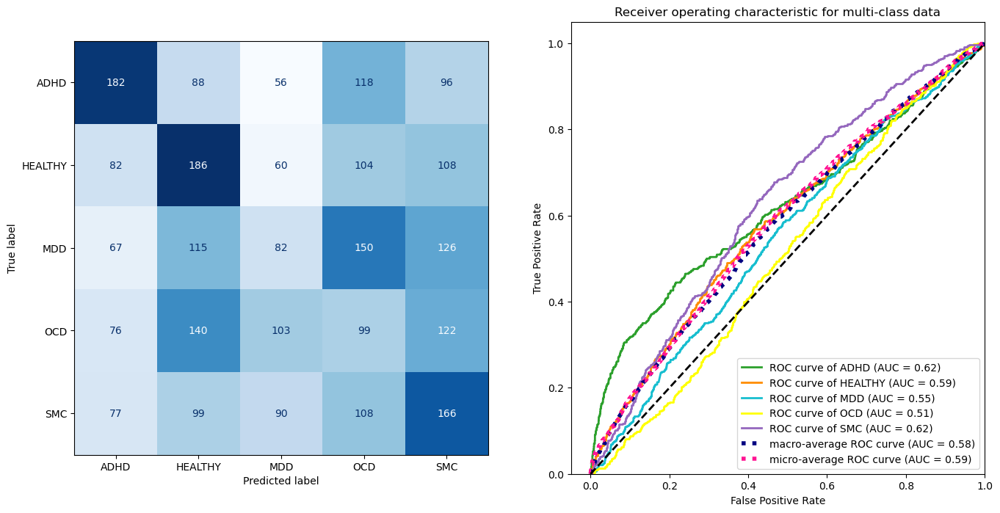

In [25]:
# final pipeline
best_params = {}
for hyperparameter in randsearch.best_params_:
    key = hyperparameter[4:]
    best_params[key] = randsearch.best_params_[hyperparameter]
print(best_params)

steps = [('col_trans', col_trans), ('pca', PCA()), ('RF', RandomForestClassifier(**best_params))]
pipeline = Pipeline(steps)

# obtain predictions
Y_pred = cross_val_predict(pipeline, X, Y,  cv = cv_outer, groups = groups, n_jobs=-1, verbose=1)    
class_labels = le.inverse_transform(sorted(np.unique(Y)))
print('f1_score:', f1_score(Y, Y_pred, average = 'weighted', zero_division=0))
print()
print('classification report:\n', classification_report(Y, Y_pred, target_names=class_labels, zero_division=0))

# create subplots
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(16, 8))

# plot confusion matrix
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
conf_matrix = confusion_matrix(Y, Y_pred)
ConfusionMatrixDisplay(conf_matrix, display_labels = class_labels).plot(cmap = 'Blues', values_format = 'd', colorbar=False, ax=ax1)

# obtain proba predictions
Y_score = cross_val_predict(pipeline, X, Y,  cv = cv_outer, groups = groups, n_jobs=-1, verbose=1, method='predict_proba')

### plot ROC curves
from sklearn.metrics import roc_curve, auc
n_classes = Y_one_hot.shape[1]

fpr = dict()
tpr = dict()
roc_auc = dict()
lw=2


for i in range(n_classes):
    fpr[i], tpr[i], _ = roc_curve(Y_one_hot[:, i], Y_score[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])
colors = ['tab:green', 'darkorange', 'tab:cyan', 'yellow', 'tab:purple']
for i, color in zip(range(n_classes), colors):
    ax2.plot(fpr[i], tpr[i], color=color, lw=2,
             label=f'ROC curve of {class_labels[i]} (AUC = {roc_auc[i]:0.2f})')
    
## Compute macro-average ROC curve and AUC
fpr_grid = np.linspace(0.0, 1.0, 1000)

# Interpolate all ROC curves at these points
mean_tpr = np.zeros_like(fpr_grid)

for i in range(n_classes):
    mean_tpr += np.interp(fpr_grid, fpr[i], tpr[i])  # linear interpolation

# Average it and compute AUC
mean_tpr /= n_classes

fpr["macro"] = fpr_grid
tpr["macro"] = mean_tpr
roc_auc["macro"] = auc(fpr["macro"], tpr["macro"])
ax2.plot(
    fpr["macro"],
    tpr["macro"],
    label=f"macro-average ROC curve (AUC = {roc_auc['macro']:.2f})",
    color="navy",
    linestyle=":",
    linewidth=4,
)    
## Compute micro-average ROC curve and AUC
fpr["micro"], tpr["micro"], _ = roc_curve(Y_one_hot.ravel(), Y_score.ravel())
roc_auc["micro"] = auc(fpr["micro"], tpr["micro"])
ax2.plot(
    fpr["micro"],
    tpr["micro"],
    label=f"micro-average ROC curve (AUC = {roc_auc['micro']:.2f})",
    color="deeppink",
    linestyle=":",
    linewidth=4,
)


ax2.plot([0, 1], [0, 1], 'k--', lw=lw)
ax2.set_xlim([-0.05, 1.0])
ax2.set_ylim([0.0, 1.05])
ax2.set_xlabel('False Positive Rate')
ax2.set_ylabel('True Positive Rate')
ax2.set_title('Receiver operating characteristic for multi-class data')
ax2.legend(loc="lower right")
plt.show()

Checking feature importance

len(X) = 2700
X_train.shape = (2028, 100), X_test.shape = (672, 100), Y_train.shape = (2028,), Y_test.shape = (672,)


/home/tsmolders/.conda/envs/py3117/lib/python3.11/site-packages/joblib/externals/loky/process_executor.py:700: UserWarning: A worker stopped while some jobs were given to the executor. This can be caused by a too short worker timeout or by a memory leak.
  warnings.warn(


Text(0.5, 1.0, 'Difference between training - testing data')

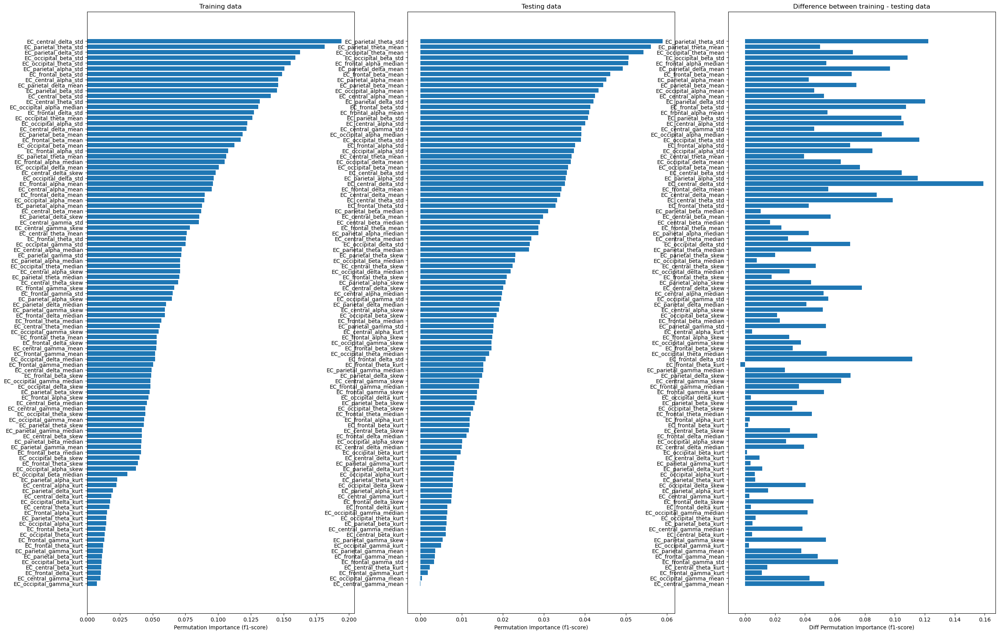

In [26]:
# using permutation_importance()
from sklearn.inspection import permutation_importance

# splitting data into train and test set
desired_test_ratio = 0.25
n_splits = int(1 / desired_test_ratio) # for some reason (?), n_splits also determines the proportion between train & test indices
sgkf = StratifiedGroupKFold(n_splits=n_splits, shuffle=False)
train_idxs, test_idxs = sgkf.split(X, Y, groups).__next__() # just take the first split
print(f'{len(X) = }')

X_train = X.iloc[train_idxs]
X_test = X.iloc[test_idxs]
Y_train = Y[train_idxs]
Y_test = Y[test_idxs]
print(f'{X_train.shape = }, {X_test.shape = }, {Y_train.shape = }, {Y_test.shape = }')

# fit pipeline to training data
pipeline_fit = pipeline.fit(X_train, Y_train)
train_perm_importance = permutation_importance(pipeline_fit, X_train, Y_train,
                                    n_repeats=5, random_state=42,
                                    n_jobs=-1, scoring=f1_scorer)

train_sorted_idx = train_perm_importance.importances_mean.argsort()

fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(30, 20))
ax1.barh(X.columns[train_sorted_idx], train_perm_importance.importances_mean[train_sorted_idx])
ax1.set_xlabel("Permutation Importance (f1-score)")
ax1.set_title('Training data')

# fit pipeline to test data
test_perm_importance = permutation_importance(pipeline_fit, X_test, Y_test,
                                    n_repeats=5, random_state=42,
                                    n_jobs=-1, scoring=f1_scorer)

test_sorted_idx = test_perm_importance.importances_mean.argsort()
ax2.barh(X.columns[test_sorted_idx], test_perm_importance.importances_mean[test_sorted_idx])
ax2.set_xlabel("Permutation Importance (f1-score)")
ax2.set_title('Testing data')

# plot difference between training and testing permutation importance (im not entirely
# sure if the indices are the same for both test/train data, as the importances_mean attribute is just a numpy array)
diff = train_perm_importance.importances_mean - test_perm_importance.importances_mean
ax3.barh(X.columns[test_sorted_idx], diff[test_sorted_idx])
ax3.set_xlabel("Diff Permutation Importance (f1-score)")
ax3.set_title('Difference between training - testing data')

#### EO feature set

In [27]:
from sklearn.preprocessing import StandardScaler
from sklearn import metrics
from sklearn.model_selection import StratifiedGroupKFold, GridSearchCV, GroupShuffleSplit, RandomizedSearchCV
from sklearn.model_selection import train_test_split, cross_val_score, cross_val_predict, cross_validate
from sklearn.metrics import classification_report, confusion_matrix, f1_score, make_scorer, fbeta_score
from sklearn.metrics import make_scorer, accuracy_score, precision_score, recall_score, f1_score
from sklearn.pipeline import Pipeline, make_pipeline
from sklearn.impute import SimpleImputer
from sklearn import preprocessing
from sklearn.decomposition import PCA
from sklearn.compose import ColumnTransformer
from sklearn.ensemble import RandomForestClassifier


# assign groups (IDs) for GroupKFold
groups = df_features_eo['ID'].tolist()
print(f'# of instances: {len(groups)}')

# define numeric columns
numeric_cols = []
for cond in ['EO']:
    for band in bands:
        for group in channel_groups:
            for stat in ['std', 'mean', 'median', 'skew', 'kurt']:
                numeric_cols.append(f'{cond}_{group}_{band}_{stat}')
X = df_features_eo[numeric_cols]
Y = df_features_eo['diagnosis']

# label binarize diagnosis for ROC curve (alphabatic order by default)
# & label encode diagnosis for predictions
from sklearn import preprocessing
lb = preprocessing.LabelBinarizer()
Y_one_hot = lb.fit_transform(Y)
print(Y_one_hot.shape)
le = preprocessing.LabelEncoder()
Y = le.fit_transform(Y)

# preprocessing steps for numerical features
numeric_transformer = Pipeline(steps = [
    ('scaler', StandardScaler()), # standardization
    ('impute', SimpleImputer(strategy='mean')) # mean imputation
])

col_trans = ColumnTransformer(transformers=[
    ('numeric_transformer', numeric_transformer, numeric_cols)
    ],
    remainder='drop',
    n_jobs=-1)

# final pipeline
steps = [('col_trans', col_trans), ('pca', PCA()), ('RF', RandomForestClassifier())]
pipeline = Pipeline(steps)

# define score metric
f1_scorer = make_scorer(fbeta_score, beta=1, average='weighted')

# define inner & outer CV objects
cv_inner = StratifiedGroupKFold(n_splits = 3, shuffle=False) # shuffle=False, so splits will be the same across calls (?)
cv_outer = StratifiedGroupKFold(n_splits = 5, shuffle=False) # shuffle=False, so splits will be the same across calls (?)

## Hyperparameters for RandomizedSearchCV
# Number of trees in random forest
n_estimators = [int(x) for x in np.linspace(start = 200, stop = 2000, num = 10)]
# Number of features to consider at every split
max_features = ['log2', 'sqrt']
# Maximum number of levels in tree
max_depth = [int(x) for x in np.linspace(10, 110, num = 11)]
max_depth.append(None)
# Minimum number of samples required to split a node
min_samples_split = [2, 5, 10]
# Minimum number of samples required at each leaf node
min_samples_leaf = [1, 2, 4]
# Method of selecting samples for training each tree
bootstrap = [True, False]
# Create the random grid
random_grid = {'RF__n_estimators': n_estimators,
               'RF__max_features': max_features,
               'RF__max_depth': max_depth,
               'RF__min_samples_split': min_samples_split,
               'RF__min_samples_leaf': min_samples_leaf,
               'RF__bootstrap': bootstrap}

# define randomized search
randsearch = RandomizedSearchCV(pipeline,
                                param_distributions=random_grid,
                                n_iter=100, # 100
                                cv = cv_inner, # use inner cv for hyperparameter tuning
                                scoring = f1_scorer,
                                error_score = 'raise',
                                return_train_score = True,
                                n_jobs=-1,
                                verbose=1)

# non-nested CV for obtaining the propable best hyperparameters
randsearch_fit = randsearch.fit(X, Y, groups = groups)
print(f'Best parameters: {randsearch_fit.best_params_}')
print(f'Best f1-score: {randsearch_fit.best_score_}')

# nested CV with parameter optimization to compute testing score (f1-score)
rf_test_score = cross_val_score(randsearch, # use unfitted gridsearch object, (idk if this matters)
                                 X = X, y = Y, 
                                 cv = cv_outer, # use outer cv for model evaluation
                                 groups = groups, 
                                 params={"groups": groups},
                                 scoring = f1_scorer,
                                 error_score = 'raise',
                                 verbose=1,
                                 n_jobs=-1)
print('RF test scores:', rf_test_score)
print('Mean RF test score:', np.mean(rf_test_score))


# of instances: 2700
(2700, 5)
Fitting 3 folds for each of 100 candidates, totalling 300 fits
Best parameters: {'RF__n_estimators': 600, 'RF__min_samples_split': 2, 'RF__min_samples_leaf': 1, 'RF__max_features': 'sqrt', 'RF__max_depth': 90, 'RF__bootstrap': False}
Best f1-score: 0.301227054619615


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 30 concurrent workers.
/home/tsmolders/.conda/envs/py3117/lib/python3.11/site-packages/sklearn/utils/extmath.py:1144: RuntimeWarning: invalid value encountered in divide
  * (last_sum / last_over_new_count - new_sum) ** 2
/home/tsmolders/.conda/envs/py3117/lib/python3.11/site-packages/sklearn/utils/extmath.py:1144: RuntimeWarning: invalid value encountered in divide
  * (last_sum / last_over_new_count - new_sum) ** 2
/home/tsmolders/.conda/envs/py3117/lib/python3.11/site-packages/sklearn/utils/extmath.py:1144: RuntimeWarning: invalid value encountered in divide
  * (last_sum / last_over_new_count - new_sum) ** 2
/home/tsmolders/.conda/envs/py3117/lib/python3.11/site-packages/sklearn/utils/extmath.py:1144: RuntimeWarning: invalid value encountered in divide
  * (last_sum / last_over_new_count - new_sum) ** 2
/home/tsmolders/.conda/envs/py3117/lib/python3.11/site-packages/sklearn/utils/extmath.py:1144: RuntimeWarning: invalid value en

Fitting 3 folds for each of 100 candidates, totalling 300 fits
Fitting 3 folds for each of 100 candidates, totalling 300 fits
Fitting 3 folds for each of 100 candidates, totalling 300 fits
Fitting 3 folds for each of 100 candidates, totalling 300 fits
Fitting 3 folds for each of 100 candidates, totalling 300 fits
RF test scores: [0.35544687 0.31345749 0.26173716 0.25411414 0.28335452]
Mean RF test score: 0.29362203764313605


[Parallel(n_jobs=-1)]: Done   5 out of   5 | elapsed: 29.8min finished


In [15]:
# calculate std (CAREFUL: WAS CALCULATED AFTERWARDS, SO NUMBERS DO NOT UPDATE AUTOMATICALLY)
print(np.std([0.35544687, 0.31345749, 0.26173716, 0.25411414, 0.28335452]))

0.037144841857803416


{'n_estimators': 600, 'min_samples_split': 2, 'min_samples_leaf': 1, 'max_features': 'sqrt', 'max_depth': 90, 'bootstrap': False}


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 30 concurrent workers.
/home/tsmolders/.conda/envs/py3117/lib/python3.11/site-packages/joblib/externals/loky/process_executor.py:700: UserWarning: A worker stopped while some jobs were given to the executor. This can be caused by a too short worker timeout or by a memory leak.
  warnings.warn(
[Parallel(n_jobs=-1)]: Done   5 out of   5 | elapsed:   21.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 30 concurrent workers.


f1_score: 0.28431887569783215

classification report:
               precision    recall  f1-score   support

        ADHD       0.40      0.40      0.40       540
     HEALTHY       0.26      0.26      0.26       540
         MDD       0.23      0.21      0.22       540
         OCD       0.24      0.20      0.22       540
         SMC       0.29      0.38      0.33       540

    accuracy                           0.29      2700
   macro avg       0.28      0.29      0.28      2700
weighted avg       0.28      0.29      0.28      2700



[Parallel(n_jobs=-1)]: Done   5 out of   5 | elapsed:   20.5s finished


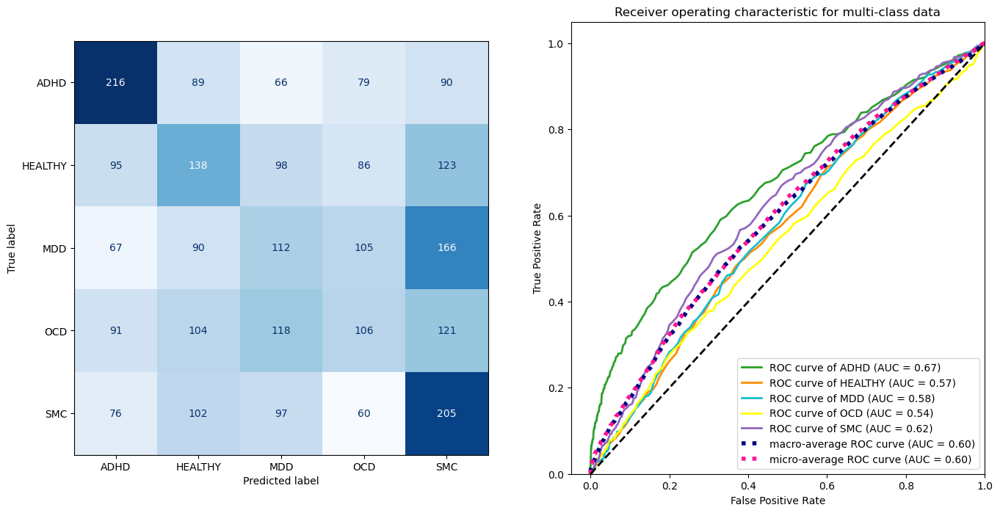

In [28]:
# final pipeline
best_params = {}
for hyperparameter in randsearch.best_params_:
    key = hyperparameter[4:]
    best_params[key] = randsearch.best_params_[hyperparameter]
print(best_params)

steps = [('col_trans', col_trans), ('pca', PCA()), ('RF', RandomForestClassifier(**best_params))]
pipeline = Pipeline(steps)

# obtain predictions
Y_pred = cross_val_predict(pipeline, X, Y,  cv = cv_outer, groups = groups, n_jobs=-1, verbose=1)    
class_labels = le.inverse_transform(sorted(np.unique(Y)))
print('f1_score:', f1_score(Y, Y_pred, average = 'weighted', zero_division=0))
print()
print('classification report:\n', classification_report(Y, Y_pred, target_names=class_labels, zero_division=0))

# create subplots
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(16, 8))

# plot confusion matrix
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
conf_matrix = confusion_matrix(Y, Y_pred)
ConfusionMatrixDisplay(conf_matrix, display_labels = class_labels).plot(cmap = 'Blues', values_format = 'd', colorbar=False, ax=ax1)

# obtain proba predictions
Y_score = cross_val_predict(pipeline, X, Y,  cv = cv_outer, groups = groups, n_jobs=-1, verbose=1, method='predict_proba')

### plot ROC curves
from sklearn.metrics import roc_curve, auc
n_classes = Y_one_hot.shape[1]

fpr = dict()
tpr = dict()
roc_auc = dict()
lw=2


for i in range(n_classes):
    fpr[i], tpr[i], _ = roc_curve(Y_one_hot[:, i], Y_score[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])
colors = ['tab:green', 'darkorange', 'tab:cyan', 'yellow', 'tab:purple']
for i, color in zip(range(n_classes), colors):
    ax2.plot(fpr[i], tpr[i], color=color, lw=2,
             label=f'ROC curve of {class_labels[i]} (AUC = {roc_auc[i]:0.2f})')
    
## Compute macro-average ROC curve and AUC
fpr_grid = np.linspace(0.0, 1.0, 1000)

# Interpolate all ROC curves at these points
mean_tpr = np.zeros_like(fpr_grid)

for i in range(n_classes):
    mean_tpr += np.interp(fpr_grid, fpr[i], tpr[i])  # linear interpolation

# Average it and compute AUC
mean_tpr /= n_classes

fpr["macro"] = fpr_grid
tpr["macro"] = mean_tpr
roc_auc["macro"] = auc(fpr["macro"], tpr["macro"])
ax2.plot(
    fpr["macro"],
    tpr["macro"],
    label=f"macro-average ROC curve (AUC = {roc_auc['macro']:.2f})",
    color="navy",
    linestyle=":",
    linewidth=4,
)    
## Compute micro-average ROC curve and AUC
fpr["micro"], tpr["micro"], _ = roc_curve(Y_one_hot.ravel(), Y_score.ravel())
roc_auc["micro"] = auc(fpr["micro"], tpr["micro"])
ax2.plot(
    fpr["micro"],
    tpr["micro"],
    label=f"micro-average ROC curve (AUC = {roc_auc['micro']:.2f})",
    color="deeppink",
    linestyle=":",
    linewidth=4,
)


ax2.plot([0, 1], [0, 1], 'k--', lw=lw)
ax2.set_xlim([-0.05, 1.0])
ax2.set_ylim([0.0, 1.05])
ax2.set_xlabel('False Positive Rate')
ax2.set_ylabel('True Positive Rate')
ax2.set_title('Receiver operating characteristic for multi-class data')
ax2.legend(loc="lower right")
plt.show()

Checking feature importance

len(X) = 2700
X_train.shape = (2028, 100), X_test.shape = (672, 100), Y_train.shape = (2028,), Y_test.shape = (672,)


Text(0.5, 1.0, 'Difference between training - testing data')

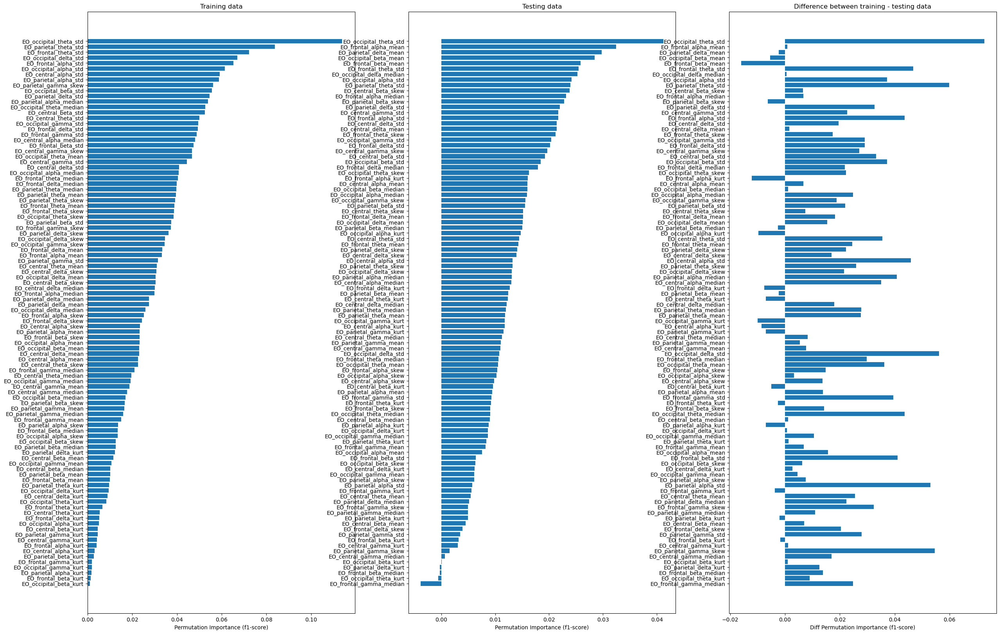

In [29]:
# using permutation_importance()
from sklearn.inspection import permutation_importance

# splitting data into train and test set
desired_test_ratio = 0.25
n_splits = int(1 / desired_test_ratio) # for some reason (?), n_splits also determines the proportion between train & test indices
sgkf = StratifiedGroupKFold(n_splits=n_splits, shuffle=False)
train_idxs, test_idxs = sgkf.split(X, Y, groups).__next__() # just take the first split
print(f'{len(X) = }')

X_train = X.iloc[train_idxs]
X_test = X.iloc[test_idxs]
Y_train = Y[train_idxs]
Y_test = Y[test_idxs]
print(f'{X_train.shape = }, {X_test.shape = }, {Y_train.shape = }, {Y_test.shape = }')

# fit pipeline to training data
pipeline_fit = pipeline.fit(X_train, Y_train)
train_perm_importance = permutation_importance(pipeline_fit, X_train, Y_train,
                                    n_repeats=5, random_state=42,
                                    n_jobs=-1, scoring=f1_scorer)

train_sorted_idx = train_perm_importance.importances_mean.argsort()

fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(30, 20))
ax1.barh(X.columns[train_sorted_idx], train_perm_importance.importances_mean[train_sorted_idx])
ax1.set_xlabel("Permutation Importance (f1-score)")
ax1.set_title('Training data')

# fit pipeline to test data
test_perm_importance = permutation_importance(pipeline_fit, X_test, Y_test,
                                    n_repeats=5, random_state=42,
                                    n_jobs=-1, scoring=f1_scorer)

test_sorted_idx = test_perm_importance.importances_mean.argsort()
ax2.barh(X.columns[test_sorted_idx], test_perm_importance.importances_mean[test_sorted_idx])
ax2.set_xlabel("Permutation Importance (f1-score)")
ax2.set_title('Testing data')

# plot difference between training and testing permutation importance (im not entirely
# sure if the indices are the same for both test/train data, as the importances_mean attribute is just a numpy array)
diff = train_perm_importance.importances_mean - test_perm_importance.importances_mean
ax3.barh(X.columns[test_sorted_idx], diff[test_sorted_idx])
ax3.set_xlabel("Diff Permutation Importance (f1-score)")
ax3.set_title('Difference between training - testing data')

### RF without skew & kurt

#### ratio feature set

In [12]:
from sklearn.preprocessing import StandardScaler
from sklearn import metrics
from sklearn.model_selection import StratifiedGroupKFold, GridSearchCV, GroupShuffleSplit, RandomizedSearchCV
from sklearn.model_selection import train_test_split, cross_val_score, cross_val_predict, cross_validate
from sklearn.metrics import classification_report, confusion_matrix, f1_score, make_scorer, fbeta_score
from sklearn.metrics import make_scorer, accuracy_score, precision_score, recall_score, f1_score
from sklearn.pipeline import Pipeline, make_pipeline
from sklearn.impute import SimpleImputer
from sklearn import preprocessing
from sklearn.decomposition import PCA
from sklearn.compose import ColumnTransformer
from sklearn.ensemble import RandomForestClassifier


# assign groups (IDs) for GroupKFold
groups = df_features_ratio_nosk['ID'].tolist()
print(f'# of instances: {len(groups)}')

# define numeric columns
numeric_cols = []
for cond in ['ratio']:
    for band in bands:
        for group in channel_groups:
            for stat in ['std', 'mean', 'median']:
                numeric_cols.append(f'{cond}_{group}_{band}_{stat}')
 
X = df_features_ratio_nosk[numeric_cols]
Y = df_features_ratio_nosk['diagnosis']

# label binarize diagnosis for ROC curve (alphabatic order by default)
# & label encode diagnosis for predictions
from sklearn import preprocessing
lb = preprocessing.LabelBinarizer()
Y_one_hot = lb.fit_transform(Y)
print(Y_one_hot.shape)
le = preprocessing.LabelEncoder()
Y = le.fit_transform(Y)

# preprocessing steps for numerical features
numeric_transformer = Pipeline(steps = [
    ('scaler', StandardScaler()), # standardization
    ('impute', SimpleImputer(strategy='mean')) # mean imputation
])

col_trans = ColumnTransformer(transformers=[
    ('numeric_transformer', numeric_transformer, numeric_cols)
    ],
    remainder='drop',
    n_jobs=-1)

# final pipeline
steps = [('col_trans', col_trans), ('pca', PCA()), ('RF', RandomForestClassifier())]
pipeline = Pipeline(steps)

# define score metric
f1_scorer = make_scorer(fbeta_score, beta=1, average='weighted')

# define inner & outer CV objects
cv_inner = StratifiedGroupKFold(n_splits = 3, shuffle=False) # shuffle=False, so splits will be the same across calls (?)
cv_outer = StratifiedGroupKFold(n_splits = 5, shuffle=False) # shuffle=False, so splits will be the same across calls (?)

## Hyperparameters for RandomizedSearchCV
# Number of trees in random forest
n_estimators = [int(x) for x in np.linspace(start = 200, stop = 2000, num = 10)]
# Number of features to consider at every split
max_features = ['log2', 'sqrt']
# Maximum number of levels in tree
max_depth = [int(x) for x in np.linspace(10, 110, num = 11)]
max_depth.append(None)
# Minimum number of samples required to split a node
min_samples_split = [2, 5, 10]
# Minimum number of samples required at each leaf node
min_samples_leaf = [1, 2, 4]
# Method of selecting samples for training each tree
bootstrap = [True, False]
# Create the random grid
random_grid = {'RF__n_estimators': n_estimators,
               'RF__max_features': max_features,
               'RF__max_depth': max_depth,
               'RF__min_samples_split': min_samples_split,
               'RF__min_samples_leaf': min_samples_leaf,
               'RF__bootstrap': bootstrap}

# define randomized search
randsearch = RandomizedSearchCV(pipeline,
                                param_distributions=random_grid,
                                n_iter=100, # 100
                                cv = cv_inner, # use inner cv for hyperparameter tuning
                                scoring = f1_scorer,
                                error_score = 'raise',
                                return_train_score = True,
                                n_jobs=-1,
                                verbose=1)

# non-nested CV for obtaining the propable best hyperparameters
randsearch_fit = randsearch.fit(X, Y, groups = groups)
print(f'Best parameters: {randsearch_fit.best_params_}')
print(f'Best f1-score: {randsearch_fit.best_score_}')

# nested CV with parameter optimization to compute testing score (f1-score)
rf_test_score = cross_val_score(randsearch, # use unfitted gridsearch object, (idk if this matters)
                                 X = X, y = Y, 
                                 cv = cv_outer, # use outer cv for model evaluation
                                 groups = groups, 
                                 params={"groups": groups},
                                 scoring = f1_scorer,
                                 error_score = 'raise',
                                 verbose=1,
                                 n_jobs=-1)
print('RF test scores:', rf_test_score)
print('Mean RF test score:', np.mean(rf_test_score))


# of instances: 2700
(2700, 5)
Fitting 3 folds for each of 100 candidates, totalling 300 fits
Fitting 3 folds for each of 20 candidates, totalling 60 fits


/home/tsmolders/.conda/envs/py3117/lib/python3.11/site-packages/joblib/externals/loky/process_executor.py:700: UserWarning: A worker stopped while some jobs were given to the executor. This can be caused by a too short worker timeout or by a memory leak.
  warnings.warn(


Fitting 3 folds for each of 20 candidates, totalling 60 fits
Fitting 3 folds for each of 20 candidates, totalling 60 fits
Fitting 3 folds for each of 20 candidates, totalling 60 fits
Fitting 3 folds for each of 20 candidates, totalling 60 fits
Best parameters: {'RF__n_estimators': 600, 'RF__min_samples_split': 5, 'RF__min_samples_leaf': 1, 'RF__max_features': 'sqrt', 'RF__max_depth': 50, 'RF__bootstrap': True}
Best f1-score: 0.2674592934987327


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 30 concurrent workers.
/home/tsmolders/.conda/envs/py3117/lib/python3.11/site-packages/sklearn/utils/extmath.py:1144: RuntimeWarning: invalid value encountered in divide
  * (last_sum / last_over_new_count - new_sum) ** 2
/home/tsmolders/.conda/envs/py3117/lib/python3.11/site-packages/sklearn/utils/extmath.py:1144: RuntimeWarning: invalid value encountered in divide
  * (last_sum / last_over_new_count - new_sum) ** 2
/home/tsmolders/.conda/envs/py3117/lib/python3.11/site-packages/sklearn/utils/extmath.py:1144: RuntimeWarning: invalid value encountered in divide
  * (last_sum / last_over_new_count - new_sum) ** 2
/home/tsmolders/.conda/envs/py3117/lib/python3.11/site-packages/sklearn/utils/extmath.py:1144: RuntimeWarning: invalid value encountered in divide
  * (last_sum / last_over_new_count - new_sum) ** 2
/home/tsmolders/.conda/envs/py3117/lib/python3.11/site-packages/sklearn/utils/extmath.py:1144: RuntimeWarning: invalid value en

Fitting 3 folds for each of 100 candidates, totalling 300 fits
Fitting 3 folds for each of 100 candidates, totalling 300 fits
Fitting 3 folds for each of 100 candidates, totalling 300 fits
Fitting 3 folds for each of 100 candidates, totalling 300 fits
Fitting 3 folds for each of 100 candidates, totalling 300 fits
RF test scores: [0.28582239 0.22561045 0.18647316 0.24129227 0.26516313]
Mean RF test score: 0.24087228025502375


[Parallel(n_jobs=-1)]: Done   5 out of   5 | elapsed: 26.2min finished


In [12]:
# calculate std (CAREFUL: WAS CALCULATED AFTERWARDS, SO NUMBERS DO NOT UPDATE AUTOMATICALLY)
print(np.std([0.28582239, 0.22561045, 0.18647316, 0.24129227, 0.26516313]))

0.03406735060452456


{'n_estimators': 600, 'min_samples_split': 5, 'min_samples_leaf': 1, 'max_features': 'sqrt', 'max_depth': 50, 'bootstrap': True}


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 30 concurrent workers.
/home/tsmolders/.conda/envs/py3117/lib/python3.11/site-packages/joblib/externals/loky/process_executor.py:700: UserWarning: A worker stopped while some jobs were given to the executor. This can be caused by a too short worker timeout or by a memory leak.
  warnings.warn(
[Parallel(n_jobs=-1)]: Done   5 out of   5 | elapsed:   10.3s finished


f1_score: 0.2526959730216311

classification report:
               precision    recall  f1-score   support

        ADHD       0.34      0.32      0.33       540
     HEALTHY       0.21      0.20      0.21       540
         MDD       0.23      0.23      0.23       540
         OCD       0.21      0.22      0.22       540
         SMC       0.26      0.29      0.28       540

    accuracy                           0.25      2700
   macro avg       0.25      0.25      0.25      2700
weighted avg       0.25      0.25      0.25      2700



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 30 concurrent workers.
[Parallel(n_jobs=-1)]: Done   5 out of   5 | elapsed:    9.9s finished


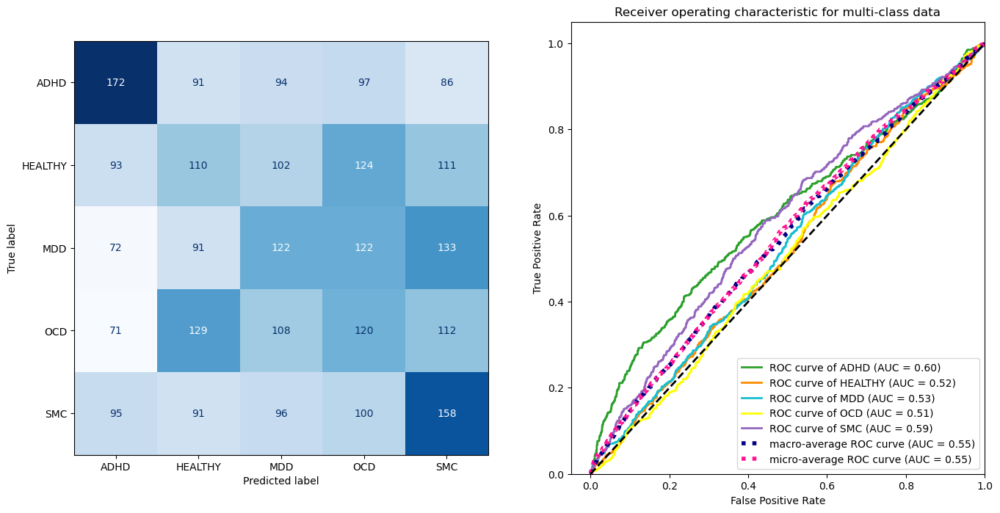

In [13]:
# final pipeline
best_params = {}
for hyperparameter in randsearch.best_params_:
    key = hyperparameter[4:]
    best_params[key] = randsearch.best_params_[hyperparameter]
print(best_params)

steps = [('col_trans', col_trans), ('pca', PCA()), ('RF', RandomForestClassifier(**best_params))]
pipeline = Pipeline(steps)

# obtain predictions
Y_pred = cross_val_predict(pipeline, X, Y,  cv = cv_outer, groups = groups, n_jobs=-1, verbose=1)    
class_labels = le.inverse_transform(sorted(np.unique(Y)))
print('f1_score:', f1_score(Y, Y_pred, average = 'weighted', zero_division=0))
print()
print('classification report:\n', classification_report(Y, Y_pred, target_names=class_labels, zero_division=0))

# create subplots
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(16, 8))

# plot confusion matrix
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
conf_matrix = confusion_matrix(Y, Y_pred)
ConfusionMatrixDisplay(conf_matrix, display_labels = class_labels).plot(cmap = 'Blues', values_format = 'd', colorbar=False, ax=ax1)

# obtain proba predictions
Y_score = cross_val_predict(pipeline, X, Y,  cv = cv_outer, groups = groups, n_jobs=-1, verbose=1, method='predict_proba')

### plot ROC curves
from sklearn.metrics import roc_curve, auc
n_classes = Y_one_hot.shape[1]

fpr = dict()
tpr = dict()
roc_auc = dict()
lw=2


for i in range(n_classes):
    fpr[i], tpr[i], _ = roc_curve(Y_one_hot[:, i], Y_score[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])
colors = ['tab:green', 'darkorange', 'tab:cyan', 'yellow', 'tab:purple']
for i, color in zip(range(n_classes), colors):
    ax2.plot(fpr[i], tpr[i], color=color, lw=2,
             label=f'ROC curve of {class_labels[i]} (AUC = {roc_auc[i]:0.2f})')
    
## Compute macro-average ROC curve and AUC
fpr_grid = np.linspace(0.0, 1.0, 1000)

# Interpolate all ROC curves at these points
mean_tpr = np.zeros_like(fpr_grid)

for i in range(n_classes):
    mean_tpr += np.interp(fpr_grid, fpr[i], tpr[i])  # linear interpolation

# Average it and compute AUC
mean_tpr /= n_classes

fpr["macro"] = fpr_grid
tpr["macro"] = mean_tpr
roc_auc["macro"] = auc(fpr["macro"], tpr["macro"])
ax2.plot(
    fpr["macro"],
    tpr["macro"],
    label=f"macro-average ROC curve (AUC = {roc_auc['macro']:.2f})",
    color="navy",
    linestyle=":",
    linewidth=4,
)    
## Compute micro-average ROC curve and AUC
fpr["micro"], tpr["micro"], _ = roc_curve(Y_one_hot.ravel(), Y_score.ravel())
roc_auc["micro"] = auc(fpr["micro"], tpr["micro"])
ax2.plot(
    fpr["micro"],
    tpr["micro"],
    label=f"micro-average ROC curve (AUC = {roc_auc['micro']:.2f})",
    color="deeppink",
    linestyle=":",
    linewidth=4,
)


ax2.plot([0, 1], [0, 1], 'k--', lw=lw)
ax2.set_xlim([-0.05, 1.0])
ax2.set_ylim([0.0, 1.05])
ax2.set_xlabel('False Positive Rate')
ax2.set_ylabel('True Positive Rate')
ax2.set_title('Receiver operating characteristic for multi-class data')
ax2.legend(loc="lower right")
plt.show()

Checking feature importance

len(X) = 2700
X_train.shape = (2028, 60), X_test.shape = (672, 60), Y_train.shape = (2028,), Y_test.shape = (672,)


Text(0.5, 1.0, 'Difference between training - testing data')

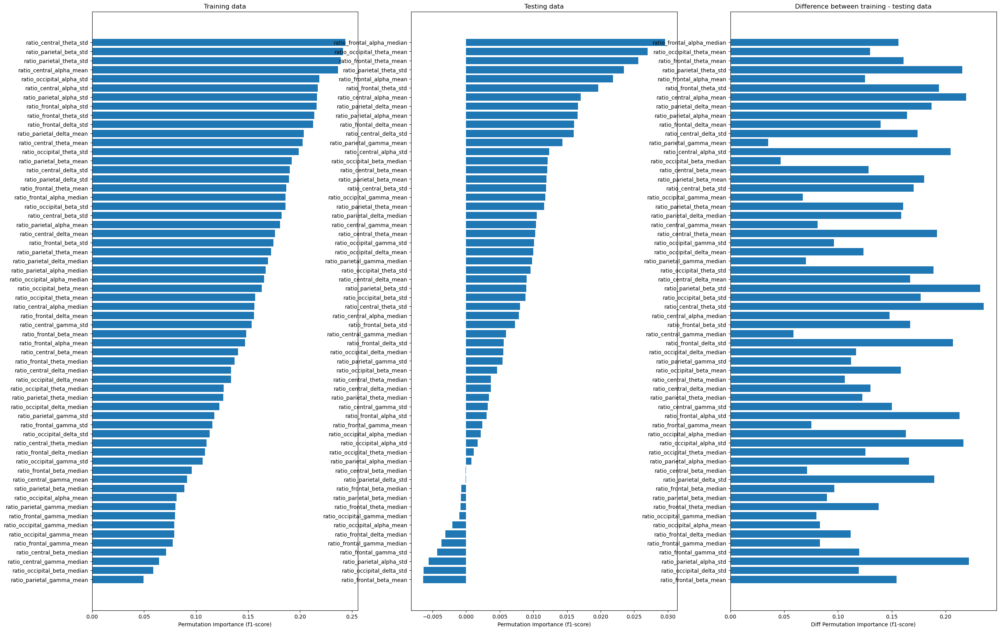

In [14]:
# using permutation_importance()
from sklearn.inspection import permutation_importance

# splitting data into train and test set
desired_test_ratio = 0.25
n_splits = int(1 / desired_test_ratio) # for some reason (?), n_splits also determines the proportion between train & test indices
sgkf = StratifiedGroupKFold(n_splits=n_splits, shuffle=False)
train_idxs, test_idxs = sgkf.split(X, Y, groups).__next__() # just take the first split
print(f'{len(X) = }')

X_train = X.iloc[train_idxs]
X_test = X.iloc[test_idxs]
Y_train = Y[train_idxs]
Y_test = Y[test_idxs]
print(f'{X_train.shape = }, {X_test.shape = }, {Y_train.shape = }, {Y_test.shape = }')

# fit pipeline to training data
pipeline_fit = pipeline.fit(X_train, Y_train)
train_perm_importance = permutation_importance(pipeline_fit, X_train, Y_train,
                                    n_repeats=5, random_state=42,
                                    n_jobs=-1, scoring=f1_scorer)

train_sorted_idx = train_perm_importance.importances_mean.argsort()

fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(30, 20))
ax1.barh(X.columns[train_sorted_idx], train_perm_importance.importances_mean[train_sorted_idx])
ax1.set_xlabel("Permutation Importance (f1-score)")
ax1.set_title('Training data')

# fit pipeline to test data
test_perm_importance = permutation_importance(pipeline_fit, X_test, Y_test,
                                    n_repeats=5, random_state=42,
                                    n_jobs=-1, scoring=f1_scorer)

test_sorted_idx = test_perm_importance.importances_mean.argsort()
ax2.barh(X.columns[test_sorted_idx], test_perm_importance.importances_mean[test_sorted_idx])
ax2.set_xlabel("Permutation Importance (f1-score)")
ax2.set_title('Testing data')

# plot difference between training and testing permutation importance (im not entirely
# sure if the indices are the same for both test/train data, as the importances_mean attribute is just a numpy array)
diff = train_perm_importance.importances_mean - test_perm_importance.importances_mean
ax3.barh(X.columns[test_sorted_idx], diff[test_sorted_idx])
ax3.set_xlabel("Diff Permutation Importance (f1-score)")
ax3.set_title('Difference between training - testing data')

#### EC feature set

In [33]:
from sklearn.preprocessing import StandardScaler
from sklearn import metrics
from sklearn.model_selection import StratifiedGroupKFold, GridSearchCV, GroupShuffleSplit, RandomizedSearchCV
from sklearn.model_selection import train_test_split, cross_val_score, cross_val_predict, cross_validate
from sklearn.metrics import classification_report, confusion_matrix, f1_score, make_scorer, fbeta_score
from sklearn.metrics import make_scorer, accuracy_score, precision_score, recall_score, f1_score
from sklearn.pipeline import Pipeline, make_pipeline
from sklearn.impute import SimpleImputer
from sklearn import preprocessing
from sklearn.decomposition import PCA
from sklearn.compose import ColumnTransformer
from sklearn.ensemble import RandomForestClassifier


# assign groups (IDs) for GroupKFold
groups = df_features_ec_nosk['ID'].tolist()
print(f'# of instances: {len(groups)}')

# define numeric columns
numeric_cols = []
for cond in ['EC']:
    for band in bands:
        for group in channel_groups:
            for stat in ['std', 'mean', 'median']:
                numeric_cols.append(f'{cond}_{group}_{band}_{stat}')
 
X = df_features_ec_nosk[numeric_cols]
Y = df_features_ec_nosk['diagnosis']

# label binarize diagnosis for ROC curve (alphabatic order by default)
# & label encode diagnosis for predictions
from sklearn import preprocessing
lb = preprocessing.LabelBinarizer()
Y_one_hot = lb.fit_transform(Y)
print(Y_one_hot.shape)
le = preprocessing.LabelEncoder()
Y = le.fit_transform(Y)

# preprocessing steps for numerical features
numeric_transformer = Pipeline(steps = [
    ('scaler', StandardScaler()), # standardization
    ('impute', SimpleImputer(strategy='mean')) # mean imputation
])

col_trans = ColumnTransformer(transformers=[
    ('numeric_transformer', numeric_transformer, numeric_cols)
    ],
    remainder='drop',
    n_jobs=-1)

# final pipeline
steps = [('col_trans', col_trans), ('pca', PCA()), ('RF', RandomForestClassifier())]
pipeline = Pipeline(steps)

# define score metric
f1_scorer = make_scorer(fbeta_score, beta=1, average='weighted')

# define inner & outer CV objects
cv_inner = StratifiedGroupKFold(n_splits = 3, shuffle=False) # shuffle=False, so splits will be the same across calls (?)
cv_outer = StratifiedGroupKFold(n_splits = 5, shuffle=False) # shuffle=False, so splits will be the same across calls (?)

## Hyperparameters for RandomizedSearchCV
# Number of trees in random forest
n_estimators = [int(x) for x in np.linspace(start = 200, stop = 2000, num = 10)]
# Number of features to consider at every split
max_features = ['log2', 'sqrt']
# Maximum number of levels in tree
max_depth = [int(x) for x in np.linspace(10, 110, num = 11)]
max_depth.append(None)
# Minimum number of samples required to split a node
min_samples_split = [2, 5, 10]
# Minimum number of samples required at each leaf node
min_samples_leaf = [1, 2, 4]
# Method of selecting samples for training each tree
bootstrap = [True, False]
# Create the random grid
random_grid = {'RF__n_estimators': n_estimators,
               'RF__max_features': max_features,
               'RF__max_depth': max_depth,
               'RF__min_samples_split': min_samples_split,
               'RF__min_samples_leaf': min_samples_leaf,
               'RF__bootstrap': bootstrap}

# define randomized search
randsearch = RandomizedSearchCV(pipeline,
                                param_distributions=random_grid,
                                n_iter=100, # 100
                                cv = cv_inner, # use inner cv for hyperparameter tuning
                                scoring = f1_scorer,
                                error_score = 'raise',
                                return_train_score = True,
                                n_jobs=-1,
                                verbose=1)

# non-nested CV for obtaining the propable best hyperparameters
randsearch_fit = randsearch.fit(X, Y, groups = groups)
print(f'Best parameters: {randsearch_fit.best_params_}')
print(f'Best f1-score: {randsearch_fit.best_score_}')

# nested CV with parameter optimization to compute testing score (f1-score)
rf_test_score = cross_val_score(randsearch, # use unfitted gridsearch object, (idk if this matters)
                                 X = X, y = Y, 
                                 cv = cv_outer, # use outer cv for model evaluation
                                 groups = groups, 
                                 params={"groups": groups},
                                 scoring = f1_scorer,
                                 error_score = 'raise',
                                 verbose=1,
                                 n_jobs=-1)
print('RF test scores:', rf_test_score)
print('Mean RF test score:', np.mean(rf_test_score))


# of instances: 2700
(2700, 5)
Fitting 3 folds for each of 100 candidates, totalling 300 fits
Best parameters: {'RF__n_estimators': 1200, 'RF__min_samples_split': 10, 'RF__min_samples_leaf': 4, 'RF__max_features': 'log2', 'RF__max_depth': 50, 'RF__bootstrap': True}
Best f1-score: 0.29758138445970655


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 30 concurrent workers.
/home/tsmolders/.conda/envs/py3117/lib/python3.11/site-packages/sklearn/utils/extmath.py:1144: RuntimeWarning: invalid value encountered in divide
  * (last_sum / last_over_new_count - new_sum) ** 2
/home/tsmolders/.conda/envs/py3117/lib/python3.11/site-packages/sklearn/utils/extmath.py:1144: RuntimeWarning: invalid value encountered in divide
  * (last_sum / last_over_new_count - new_sum) ** 2
/home/tsmolders/.conda/envs/py3117/lib/python3.11/site-packages/sklearn/utils/extmath.py:1144: RuntimeWarning: invalid value encountered in divide
  * (last_sum / last_over_new_count - new_sum) ** 2
/home/tsmolders/.conda/envs/py3117/lib/python3.11/site-packages/sklearn/utils/extmath.py:1144: RuntimeWarning: invalid value encountered in divide
  * (last_sum / last_over_new_count - new_sum) ** 2
/home/tsmolders/.conda/envs/py3117/lib/python3.11/site-packages/sklearn/utils/extmath.py:1144: RuntimeWarning: invalid value en

Fitting 3 folds for each of 100 candidates, totalling 300 fits
Fitting 3 folds for each of 100 candidates, totalling 300 fits
Fitting 3 folds for each of 100 candidates, totalling 300 fits
Fitting 3 folds for each of 100 candidates, totalling 300 fits
Fitting 3 folds for each of 100 candidates, totalling 300 fits
RF test scores: [0.28370946 0.31306681 0.24599918 0.22809593 0.28893674]
Mean RF test score: 0.2719616237668186


[Parallel(n_jobs=-1)]: Done   5 out of   5 | elapsed: 27.2min finished


In [14]:
# calculate std (CAREFUL: WAS CALCULATED AFTERWARDS, SO NUMBERS DO NOT UPDATE AUTOMATICALLY)
print(np.std([0.28370946, 0.31306681, 0.24599918, 0.22809593, 0.28893674]))

0.03070521173529249


{'n_estimators': 1200, 'min_samples_split': 10, 'min_samples_leaf': 4, 'max_features': 'log2', 'max_depth': 50, 'bootstrap': True}


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 30 concurrent workers.
/home/tsmolders/.conda/envs/py3117/lib/python3.11/site-packages/joblib/externals/loky/process_executor.py:700: UserWarning: A worker stopped while some jobs were given to the executor. This can be caused by a too short worker timeout or by a memory leak.
  warnings.warn(
[Parallel(n_jobs=-1)]: Done   5 out of   5 | elapsed:   13.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 30 concurrent workers.


f1_score: 0.27982831026563093

classification report:
               precision    recall  f1-score   support

        ADHD       0.39      0.30      0.34       540
     HEALTHY       0.27      0.31      0.29       540
         MDD       0.25      0.21      0.23       540
         OCD       0.18      0.19      0.18       540
         SMC       0.32      0.39      0.35       540

    accuracy                           0.28      2700
   macro avg       0.28      0.28      0.28      2700
weighted avg       0.28      0.28      0.28      2700



[Parallel(n_jobs=-1)]: Done   5 out of   5 | elapsed:   12.4s finished


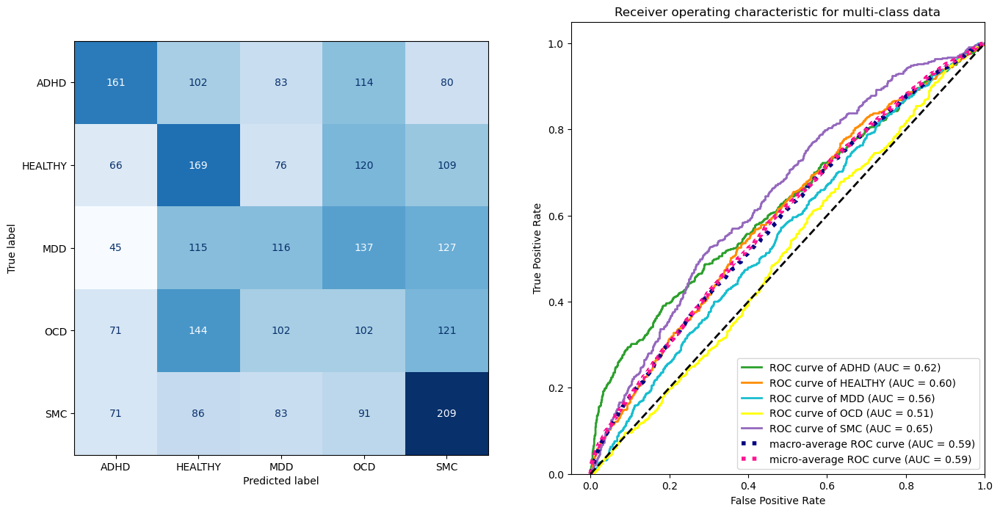

In [34]:
# final pipeline
best_params = {}
for hyperparameter in randsearch.best_params_:
    key = hyperparameter[4:]
    best_params[key] = randsearch.best_params_[hyperparameter]
print(best_params)

steps = [('col_trans', col_trans), ('pca', PCA()), ('RF', RandomForestClassifier(**best_params))]
pipeline = Pipeline(steps)

# obtain predictions
Y_pred = cross_val_predict(pipeline, X, Y,  cv = cv_outer, groups = groups, n_jobs=-1, verbose=1)    
class_labels = le.inverse_transform(sorted(np.unique(Y)))
print('f1_score:', f1_score(Y, Y_pred, average = 'weighted', zero_division=0))
print()
print('classification report:\n', classification_report(Y, Y_pred, target_names=class_labels, zero_division=0))

# create subplots
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(16, 8))

# plot confusion matrix
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
conf_matrix = confusion_matrix(Y, Y_pred)
ConfusionMatrixDisplay(conf_matrix, display_labels = class_labels).plot(cmap = 'Blues', values_format = 'd', colorbar=False, ax=ax1)

# obtain proba predictions
Y_score = cross_val_predict(pipeline, X, Y,  cv = cv_outer, groups = groups, n_jobs=-1, verbose=1, method='predict_proba')

### plot ROC curves
from sklearn.metrics import roc_curve, auc
n_classes = Y_one_hot.shape[1]

fpr = dict()
tpr = dict()
roc_auc = dict()
lw=2


for i in range(n_classes):
    fpr[i], tpr[i], _ = roc_curve(Y_one_hot[:, i], Y_score[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])
colors = ['tab:green', 'darkorange', 'tab:cyan', 'yellow', 'tab:purple']
for i, color in zip(range(n_classes), colors):
    ax2.plot(fpr[i], tpr[i], color=color, lw=2,
             label=f'ROC curve of {class_labels[i]} (AUC = {roc_auc[i]:0.2f})')
    
## Compute macro-average ROC curve and AUC
fpr_grid = np.linspace(0.0, 1.0, 1000)

# Interpolate all ROC curves at these points
mean_tpr = np.zeros_like(fpr_grid)

for i in range(n_classes):
    mean_tpr += np.interp(fpr_grid, fpr[i], tpr[i])  # linear interpolation

# Average it and compute AUC
mean_tpr /= n_classes

fpr["macro"] = fpr_grid
tpr["macro"] = mean_tpr
roc_auc["macro"] = auc(fpr["macro"], tpr["macro"])
ax2.plot(
    fpr["macro"],
    tpr["macro"],
    label=f"macro-average ROC curve (AUC = {roc_auc['macro']:.2f})",
    color="navy",
    linestyle=":",
    linewidth=4,
)    
## Compute micro-average ROC curve and AUC
fpr["micro"], tpr["micro"], _ = roc_curve(Y_one_hot.ravel(), Y_score.ravel())
roc_auc["micro"] = auc(fpr["micro"], tpr["micro"])
ax2.plot(
    fpr["micro"],
    tpr["micro"],
    label=f"micro-average ROC curve (AUC = {roc_auc['micro']:.2f})",
    color="deeppink",
    linestyle=":",
    linewidth=4,
)


ax2.plot([0, 1], [0, 1], 'k--', lw=lw)
ax2.set_xlim([-0.05, 1.0])
ax2.set_ylim([0.0, 1.05])
ax2.set_xlabel('False Positive Rate')
ax2.set_ylabel('True Positive Rate')
ax2.set_title('Receiver operating characteristic for multi-class data')
ax2.legend(loc="lower right")
plt.show()

Checking feature importance

len(X) = 2700
X_train.shape = (2028, 60), X_test.shape = (672, 60), Y_train.shape = (2028,), Y_test.shape = (672,)


Text(0.5, 1.0, 'Difference between training - testing data')

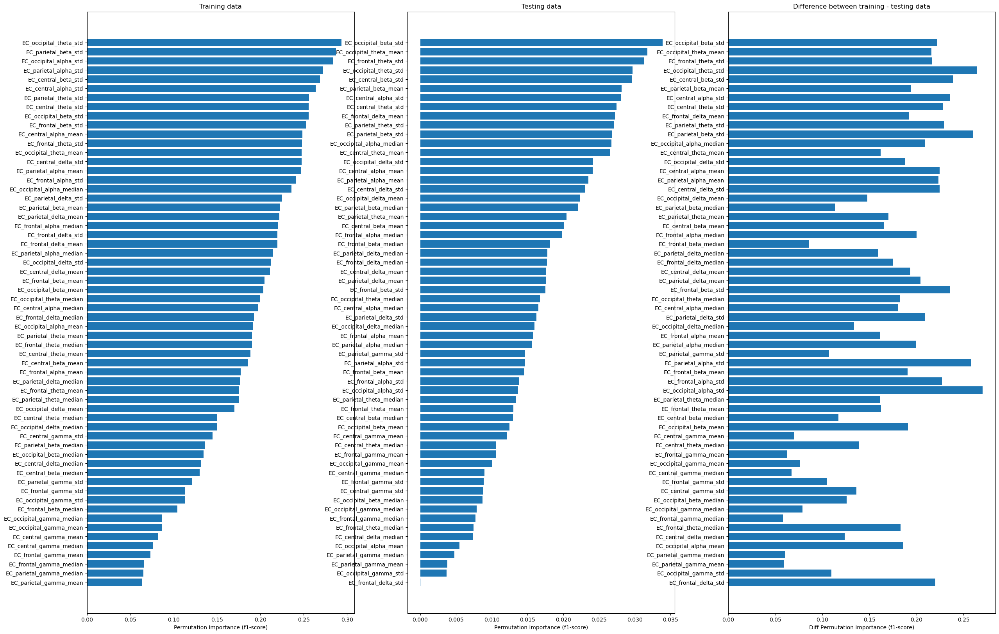

In [35]:
# using permutation_importance()
from sklearn.inspection import permutation_importance

# splitting data into train and test set
desired_test_ratio = 0.25
n_splits = int(1 / desired_test_ratio) # for some reason (?), n_splits also determines the proportion between train & test indices
sgkf = StratifiedGroupKFold(n_splits=n_splits, shuffle=False)
train_idxs, test_idxs = sgkf.split(X, Y, groups).__next__() # just take the first split
print(f'{len(X) = }')

X_train = X.iloc[train_idxs]
X_test = X.iloc[test_idxs]
Y_train = Y[train_idxs]
Y_test = Y[test_idxs]
print(f'{X_train.shape = }, {X_test.shape = }, {Y_train.shape = }, {Y_test.shape = }')

# fit pipeline to training data
pipeline_fit = pipeline.fit(X_train, Y_train)
train_perm_importance = permutation_importance(pipeline_fit, X_train, Y_train,
                                    n_repeats=5, random_state=42,
                                    n_jobs=-1, scoring=f1_scorer)

train_sorted_idx = train_perm_importance.importances_mean.argsort()

fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(30, 20))
ax1.barh(X.columns[train_sorted_idx], train_perm_importance.importances_mean[train_sorted_idx])
ax1.set_xlabel("Permutation Importance (f1-score)")
ax1.set_title('Training data')

# fit pipeline to test data
test_perm_importance = permutation_importance(pipeline_fit, X_test, Y_test,
                                    n_repeats=5, random_state=42,
                                    n_jobs=-1, scoring=f1_scorer)

test_sorted_idx = test_perm_importance.importances_mean.argsort()
ax2.barh(X.columns[test_sorted_idx], test_perm_importance.importances_mean[test_sorted_idx])
ax2.set_xlabel("Permutation Importance (f1-score)")
ax2.set_title('Testing data')

# plot difference between training and testing permutation importance (im not entirely
# sure if the indices are the same for both test/train data, as the importances_mean attribute is just a numpy array)
diff = train_perm_importance.importances_mean - test_perm_importance.importances_mean
ax3.barh(X.columns[test_sorted_idx], diff[test_sorted_idx])
ax3.set_xlabel("Diff Permutation Importance (f1-score)")
ax3.set_title('Difference between training - testing data')

#### EO feature set

In [36]:
from sklearn.preprocessing import StandardScaler
from sklearn import metrics
from sklearn.model_selection import StratifiedGroupKFold, GridSearchCV, GroupShuffleSplit, RandomizedSearchCV
from sklearn.model_selection import train_test_split, cross_val_score, cross_val_predict, cross_validate
from sklearn.metrics import classification_report, confusion_matrix, f1_score, make_scorer, fbeta_score
from sklearn.metrics import make_scorer, accuracy_score, precision_score, recall_score, f1_score
from sklearn.pipeline import Pipeline, make_pipeline
from sklearn.impute import SimpleImputer
from sklearn import preprocessing
from sklearn.decomposition import PCA
from sklearn.compose import ColumnTransformer
from sklearn.ensemble import RandomForestClassifier


# assign groups (IDs) for GroupKFold
groups = df_features_eo_nosk['ID'].tolist()
print(f'# of instances: {len(groups)}')

# define numeric columns
numeric_cols = []
for cond in ['EO']:
    for band in bands:
        for group in channel_groups:
            for stat in ['std', 'mean', 'median']:
                numeric_cols.append(f'{cond}_{group}_{band}_{stat}')
 
X = df_features_eo_nosk[numeric_cols]
Y = df_features_eo_nosk['diagnosis']

# label binarize diagnosis for ROC curve (alphabatic order by default)
# & label encode diagnosis for predictions
from sklearn import preprocessing
lb = preprocessing.LabelBinarizer()
Y_one_hot = lb.fit_transform(Y)
print(Y_one_hot.shape)
le = preprocessing.LabelEncoder()
Y = le.fit_transform(Y)

# preprocessing steps for numerical features
numeric_transformer = Pipeline(steps = [
    ('scaler', StandardScaler()), # standardization
    ('impute', SimpleImputer(strategy='mean')) # mean imputation
])

col_trans = ColumnTransformer(transformers=[
    ('numeric_transformer', numeric_transformer, numeric_cols)
    ],
    remainder='drop',
    n_jobs=-1)

# final pipeline
steps = [('col_trans', col_trans), ('pca', PCA()), ('RF', RandomForestClassifier())]
pipeline = Pipeline(steps)

# define score metric
f1_scorer = make_scorer(fbeta_score, beta=1, average='weighted')

# define inner & outer CV objects
cv_inner = StratifiedGroupKFold(n_splits = 3, shuffle=False) # shuffle=False, so splits will be the same across calls (?)
cv_outer = StratifiedGroupKFold(n_splits = 5, shuffle=False) # shuffle=False, so splits will be the same across calls (?)

## Hyperparameters for RandomizedSearchCV
# Number of trees in random forest
n_estimators = [int(x) for x in np.linspace(start = 200, stop = 2000, num = 10)]
# Number of features to consider at every split
max_features = ['log2', 'sqrt']
# Maximum number of levels in tree
max_depth = [int(x) for x in np.linspace(10, 110, num = 11)]
max_depth.append(None)
# Minimum number of samples required to split a node
min_samples_split = [2, 5, 10]
# Minimum number of samples required at each leaf node
min_samples_leaf = [1, 2, 4]
# Method of selecting samples for training each tree
bootstrap = [True, False]
# Create the random grid
random_grid = {'RF__n_estimators': n_estimators,
               'RF__max_features': max_features,
               'RF__max_depth': max_depth,
               'RF__min_samples_split': min_samples_split,
               'RF__min_samples_leaf': min_samples_leaf,
               'RF__bootstrap': bootstrap}

# define randomized search
randsearch = RandomizedSearchCV(pipeline,
                                param_distributions=random_grid,
                                n_iter=100, # 100
                                cv = cv_inner, # use inner cv for hyperparameter tuning
                                scoring = f1_scorer,
                                error_score = 'raise',
                                return_train_score = True,
                                n_jobs=-1,
                                verbose=1)

# non-nested CV for obtaining the propable best hyperparameters
randsearch_fit = randsearch.fit(X, Y, groups = groups)
print(f'Best parameters: {randsearch_fit.best_params_}')
print(f'Best f1-score: {randsearch_fit.best_score_}')

# nested CV with parameter optimization to compute testing score (f1-score)
rf_test_score = cross_val_score(randsearch, # use unfitted gridsearch object, (idk if this matters)
                                 X = X, y = Y, 
                                 cv = cv_outer, # use outer cv for model evaluation
                                 groups = groups, 
                                 params={"groups": groups},
                                 scoring = f1_scorer,
                                 error_score = 'raise',
                                 verbose=1,
                                 n_jobs=-1)
print('RF test scores:', rf_test_score)
print('Mean RF test score:', np.mean(rf_test_score))


# of instances: 2700
(2700, 5)
Fitting 3 folds for each of 100 candidates, totalling 300 fits
Best parameters: {'RF__n_estimators': 800, 'RF__min_samples_split': 10, 'RF__min_samples_leaf': 4, 'RF__max_features': 'log2', 'RF__max_depth': None, 'RF__bootstrap': True}
Best f1-score: 0.3149694882723586


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 30 concurrent workers.
/home/tsmolders/.conda/envs/py3117/lib/python3.11/site-packages/sklearn/utils/extmath.py:1144: RuntimeWarning: invalid value encountered in divide
  * (last_sum / last_over_new_count - new_sum) ** 2
/home/tsmolders/.conda/envs/py3117/lib/python3.11/site-packages/sklearn/utils/extmath.py:1144: RuntimeWarning: invalid value encountered in divide
  * (last_sum / last_over_new_count - new_sum) ** 2
/home/tsmolders/.conda/envs/py3117/lib/python3.11/site-packages/sklearn/utils/extmath.py:1144: RuntimeWarning: invalid value encountered in divide
  * (last_sum / last_over_new_count - new_sum) ** 2
/home/tsmolders/.conda/envs/py3117/lib/python3.11/site-packages/sklearn/utils/extmath.py:1144: RuntimeWarning: invalid value encountered in divide
  * (last_sum / last_over_new_count - new_sum) ** 2
/home/tsmolders/.conda/envs/py3117/lib/python3.11/site-packages/sklearn/utils/extmath.py:1144: RuntimeWarning: invalid value en

Fitting 3 folds for each of 100 candidates, totalling 300 fits
Fitting 3 folds for each of 100 candidates, totalling 300 fits
Fitting 3 folds for each of 100 candidates, totalling 300 fits
Fitting 3 folds for each of 100 candidates, totalling 300 fits
RF test scores: [0.34730754 0.28017475 0.27959543 0.24259358 0.26228405]
Mean RF test score: 0.28239106936583913


[Parallel(n_jobs=-1)]: Done   5 out of   5 | elapsed: 28.1min finished


In [17]:
# calculate std (CAREFUL: WAS CALCULATED AFTERWARDS, SO NUMBERS DO NOT UPDATE AUTOMATICALLY)
print(np.std([0.34730754, 0.28017475, 0.27959543, 0.24259358, 0.26228405]))

0.03525622843752123


{'n_estimators': 800, 'min_samples_split': 10, 'min_samples_leaf': 4, 'max_features': 'log2', 'max_depth': None, 'bootstrap': True}
Fitting 3 folds for each of 100 candidates, totalling 300 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 30 concurrent workers.
/home/tsmolders/.conda/envs/py3117/lib/python3.11/site-packages/joblib/externals/loky/process_executor.py:700: UserWarning: A worker stopped while some jobs were given to the executor. This can be caused by a too short worker timeout or by a memory leak.
  warnings.warn(
[Parallel(n_jobs=-1)]: Done   5 out of   5 | elapsed:    9.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 30 concurrent workers.


f1_score: 0.28654165684250094

classification report:
               precision    recall  f1-score   support

        ADHD       0.40      0.39      0.40       540
     HEALTHY       0.28      0.25      0.26       540
         MDD       0.22      0.19      0.21       540
         OCD       0.25      0.22      0.24       540
         SMC       0.28      0.39      0.33       540

    accuracy                           0.29      2700
   macro avg       0.29      0.29      0.29      2700
weighted avg       0.29      0.29      0.29      2700



[Parallel(n_jobs=-1)]: Done   5 out of   5 | elapsed:    8.3s finished


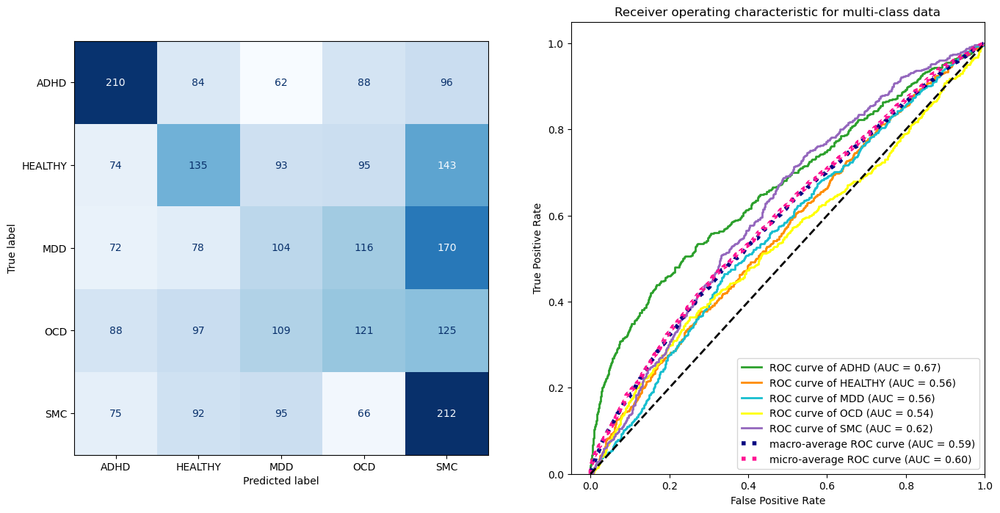

In [37]:
# final pipeline
best_params = {}
for hyperparameter in randsearch.best_params_:
    key = hyperparameter[4:]
    best_params[key] = randsearch.best_params_[hyperparameter]
print(best_params)

steps = [('col_trans', col_trans), ('pca', PCA()), ('RF', RandomForestClassifier(**best_params))]
pipeline = Pipeline(steps)

# obtain predictions
Y_pred = cross_val_predict(pipeline, X, Y,  cv = cv_outer, groups = groups, n_jobs=-1, verbose=1)    
class_labels = le.inverse_transform(sorted(np.unique(Y)))
print('f1_score:', f1_score(Y, Y_pred, average = 'weighted', zero_division=0))
print()
print('classification report:\n', classification_report(Y, Y_pred, target_names=class_labels, zero_division=0))

# create subplots
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(16, 8))

# plot confusion matrix
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
conf_matrix = confusion_matrix(Y, Y_pred)
ConfusionMatrixDisplay(conf_matrix, display_labels = class_labels).plot(cmap = 'Blues', values_format = 'd', colorbar=False, ax=ax1)

# obtain proba predictions
Y_score = cross_val_predict(pipeline, X, Y,  cv = cv_outer, groups = groups, n_jobs=-1, verbose=1, method='predict_proba')

### plot ROC curves
from sklearn.metrics import roc_curve, auc
n_classes = Y_one_hot.shape[1]

fpr = dict()
tpr = dict()
roc_auc = dict()
lw=2


for i in range(n_classes):
    fpr[i], tpr[i], _ = roc_curve(Y_one_hot[:, i], Y_score[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])
colors = ['tab:green', 'darkorange', 'tab:cyan', 'yellow', 'tab:purple']
for i, color in zip(range(n_classes), colors):
    ax2.plot(fpr[i], tpr[i], color=color, lw=2,
             label=f'ROC curve of {class_labels[i]} (AUC = {roc_auc[i]:0.2f})')
    
## Compute macro-average ROC curve and AUC
fpr_grid = np.linspace(0.0, 1.0, 1000)

# Interpolate all ROC curves at these points
mean_tpr = np.zeros_like(fpr_grid)

for i in range(n_classes):
    mean_tpr += np.interp(fpr_grid, fpr[i], tpr[i])  # linear interpolation

# Average it and compute AUC
mean_tpr /= n_classes

fpr["macro"] = fpr_grid
tpr["macro"] = mean_tpr
roc_auc["macro"] = auc(fpr["macro"], tpr["macro"])
ax2.plot(
    fpr["macro"],
    tpr["macro"],
    label=f"macro-average ROC curve (AUC = {roc_auc['macro']:.2f})",
    color="navy",
    linestyle=":",
    linewidth=4,
)    
## Compute micro-average ROC curve and AUC
fpr["micro"], tpr["micro"], _ = roc_curve(Y_one_hot.ravel(), Y_score.ravel())
roc_auc["micro"] = auc(fpr["micro"], tpr["micro"])
ax2.plot(
    fpr["micro"],
    tpr["micro"],
    label=f"micro-average ROC curve (AUC = {roc_auc['micro']:.2f})",
    color="deeppink",
    linestyle=":",
    linewidth=4,
)


ax2.plot([0, 1], [0, 1], 'k--', lw=lw)
ax2.set_xlim([-0.05, 1.0])
ax2.set_ylim([0.0, 1.05])
ax2.set_xlabel('False Positive Rate')
ax2.set_ylabel('True Positive Rate')
ax2.set_title('Receiver operating characteristic for multi-class data')
ax2.legend(loc="lower right")
plt.show()

Checking feature importance

len(X) = 2700
X_train.shape = (2028, 60), X_test.shape = (672, 60), Y_train.shape = (2028,), Y_test.shape = (672,)


Text(0.5, 1.0, 'Difference between training - testing data')

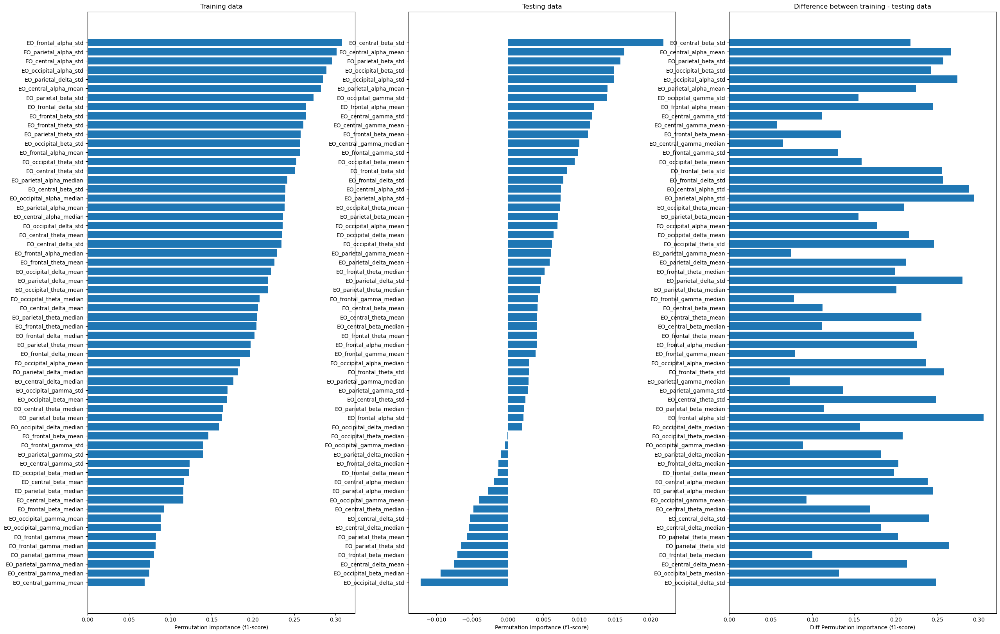

In [38]:
# using permutation_importance()
from sklearn.inspection import permutation_importance

# splitting data into train and test set
desired_test_ratio = 0.25
n_splits = int(1 / desired_test_ratio) # for some reason (?), n_splits also determines the proportion between train & test indices
sgkf = StratifiedGroupKFold(n_splits=n_splits, shuffle=False)
train_idxs, test_idxs = sgkf.split(X, Y, groups).__next__() # just take the first split
print(f'{len(X) = }')

X_train = X.iloc[train_idxs]
X_test = X.iloc[test_idxs]
Y_train = Y[train_idxs]
Y_test = Y[test_idxs]
print(f'{X_train.shape = }, {X_test.shape = }, {Y_train.shape = }, {Y_test.shape = }')

# fit pipeline to training data
pipeline_fit = pipeline.fit(X_train, Y_train)
train_perm_importance = permutation_importance(pipeline_fit, X_train, Y_train,
                                    n_repeats=5, random_state=42,
                                    n_jobs=-1, scoring=f1_scorer)

train_sorted_idx = train_perm_importance.importances_mean.argsort()

fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(30, 20))
ax1.barh(X.columns[train_sorted_idx], train_perm_importance.importances_mean[train_sorted_idx])
ax1.set_xlabel("Permutation Importance (f1-score)")
ax1.set_title('Training data')

# fit pipeline to test data
test_perm_importance = permutation_importance(pipeline_fit, X_test, Y_test,
                                    n_repeats=5, random_state=42,
                                    n_jobs=-1, scoring=f1_scorer)

test_sorted_idx = test_perm_importance.importances_mean.argsort()
ax2.barh(X.columns[test_sorted_idx], test_perm_importance.importances_mean[test_sorted_idx])
ax2.set_xlabel("Permutation Importance (f1-score)")
ax2.set_title('Testing data')

# plot difference between training and testing permutation importance (im not entirely
# sure if the indices are the same for both test/train data, as the importances_mean attribute is just a numpy array)
diff = train_perm_importance.importances_mean - test_perm_importance.importances_mean
ax3.barh(X.columns[test_sorted_idx], diff[test_sorted_idx])
ax3.set_xlabel("Diff Permutation Importance (f1-score)")
ax3.set_title('Difference between training - testing data')

## GradientBoostingClassifier

#### ratio feature set

In [39]:
from sklearn.preprocessing import StandardScaler
from sklearn import metrics
from sklearn.model_selection import StratifiedGroupKFold, GridSearchCV, GroupShuffleSplit, RandomizedSearchCV
from sklearn.model_selection import train_test_split, cross_val_score, cross_val_predict, cross_validate
from sklearn.metrics import classification_report, confusion_matrix, f1_score, make_scorer, fbeta_score
from sklearn.metrics import make_scorer, accuracy_score, precision_score, recall_score, f1_score
from sklearn.pipeline import Pipeline, make_pipeline
from sklearn.impute import SimpleImputer
from sklearn import preprocessing
from sklearn.decomposition import PCA
from sklearn.compose import ColumnTransformer
from sklearn.ensemble import GradientBoostingClassifier
from scipy.stats import loguniform


# assign groups (IDs) for GroupKFold
groups = df_features_ratio['ID'].tolist()
print(f'# of instances: {len(groups)}')

# define numeric columns
numeric_cols = []
for cond in ['ratio']:
    for band in bands:
        for group in channel_groups:
            for stat in ['std', 'mean', 'median', 'skew', 'kurt']:
                numeric_cols.append(f'{cond}_{group}_{band}_{stat}')
 
X = df_features_ratio[numeric_cols]
Y = df_features_ratio['diagnosis']

# label binarize diagnosis for ROC curve (alphabatic order by default)
# & label encode diagnosis for predictions
from sklearn import preprocessing
lb = preprocessing.LabelBinarizer()
Y_one_hot = lb.fit_transform(Y)
print(Y_one_hot.shape)
le = preprocessing.LabelEncoder()
Y = le.fit_transform(Y)

# preprocessing steps for numerical features
numeric_transformer = Pipeline(steps = [
    ('scaler', StandardScaler()), # standardization
    ('impute', SimpleImputer(strategy='mean')) # mean imputation
])

col_trans = ColumnTransformer(transformers=[
    ('numeric_transformer', numeric_transformer, numeric_cols)
    ],
    remainder='drop',
    n_jobs=-1)


# final pipeline
steps = [('col_trans', col_trans), ('pca', PCA()), ('gbc', GradientBoostingClassifier())]
pipeline = Pipeline(steps)

# define score metric
f1_scorer = make_scorer(fbeta_score, beta=1, average='weighted')

# define inner & outer CV objects
cv_inner = StratifiedGroupKFold(n_splits = 3, shuffle=False) # shuffle=False, so splits will be the same across calls (?)
cv_outer = StratifiedGroupKFold(n_splits = 5, shuffle=False) # shuffle=False, so splits will be the same across calls (?)

## Hyperparameters for RandomizedSearchCV
# Number of boosting stages to perform
n_estimators = [int(x) for x in np.linspace(start = 100, stop = 1000, num = 10)]
# Loss function to be optimized
loss = ['log_loss']
# Learning rate
learning_rate = loguniform.rvs(0.001, 0.1, size=1000)
# Fraction of samples to be used for fitting the individual base learners
subsample = [x for x in np.linspace(0.5, 1, 5)]
# The function to measure the quality of the split
criterion = ['friedman_mse']
# The min number of samples required to split an internal node
min_samples_split = [2, 5, 10]
# Create the random grid
random_grid = {'gbc__n_estimators': n_estimators,
               'gbc__loss': loss,
               'gbc__learning_rate': learning_rate,
               'gbc__subsample': subsample,
               'gbc__criterion': criterion,
               'gbc__min_samples_split': min_samples_split}

# define randomized search
randsearch = RandomizedSearchCV(pipeline,
                                param_distributions=random_grid,
                                n_iter=100, # 100
                                cv = cv_inner, # use inner cv for hyperparameter tuning
                                scoring = f1_scorer,
                                error_score = 'raise',
                                return_train_score = True,
                                n_jobs=-1,
                                verbose=1)

# non-nested CV for obtaining the propable best hyperparameters
randsearch_fit = randsearch.fit(X, Y, groups = groups)
print(f'Best parameters: {randsearch_fit.best_params_}')
print(f'Best f1-score: {randsearch_fit.best_score_}')

# nested CV with parameter optimization to compute testing score (f1-score)
gbc_test_score = cross_val_score(randsearch, # use unfitted gridsearch object, (idk if this matters)
                                 X = X, y = Y, 
                                 cv = cv_outer, # use outer cv for model evaluation
                                 groups = groups, 
                                 params={"groups": groups},
                                 scoring = f1_scorer,
                                 error_score = 'raise',
                                 verbose=1,
                                 n_jobs=-1)
print('GBC test scores:', gbc_test_score)
print('Mean GBC test score:', np.mean(gbc_test_score))


# of instances: 2700
(2700, 5)
Fitting 3 folds for each of 100 candidates, totalling 300 fits
Best parameters: {'gbc__subsample': 0.75, 'gbc__n_estimators': 600, 'gbc__min_samples_split': 2, 'gbc__loss': 'log_loss', 'gbc__learning_rate': 0.002107727814815935, 'gbc__criterion': 'friedman_mse'}
Best f1-score: 0.2616474361110999


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 30 concurrent workers.
/home/tsmolders/.conda/envs/py3117/lib/python3.11/site-packages/sklearn/utils/extmath.py:1144: RuntimeWarning: invalid value encountered in divide
  * (last_sum / last_over_new_count - new_sum) ** 2
/home/tsmolders/.conda/envs/py3117/lib/python3.11/site-packages/sklearn/utils/extmath.py:1144: RuntimeWarning: invalid value encountered in divide
  * (last_sum / last_over_new_count - new_sum) ** 2
/home/tsmolders/.conda/envs/py3117/lib/python3.11/site-packages/sklearn/utils/extmath.py:1144: RuntimeWarning: invalid value encountered in divide
  * (last_sum / last_over_new_count - new_sum) ** 2
/home/tsmolders/.conda/envs/py3117/lib/python3.11/site-packages/sklearn/utils/extmath.py:1144: RuntimeWarning: invalid value encountered in divide
  * (last_sum / last_over_new_count - new_sum) ** 2


Fitting 3 folds for each of 100 candidates, totalling 300 fits
Fitting 3 folds for each of 100 candidates, totalling 300 fits
Fitting 3 folds for each of 100 candidates, totalling 300 fits
Fitting 3 folds for each of 100 candidates, totalling 300 fits
GBC test scores: [0.24973355 0.23983693 0.21952091 0.25658029 0.2383187 ]
Mean GBC test score: 0.24079807696664415


[Parallel(n_jobs=-1)]: Done   5 out of   5 | elapsed: 108.3min finished


In [18]:
# calculate std (CAREFUL: WAS CALCULATED AFTERWARDS, SO NUMBERS DO NOT UPDATE AUTOMATICALLY)
print(np.std([0.24973355, 0.23983693, 0.21952091, 0.25658029, 0.2383187]))

0.012559537207403139


{'subsample': 0.75, 'n_estimators': 600, 'min_samples_split': 2, 'loss': 'log_loss', 'learning_rate': 0.002107727814815935, 'criterion': 'friedman_mse'}


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 30 concurrent workers.
/home/tsmolders/.conda/envs/py3117/lib/python3.11/site-packages/joblib/externals/loky/process_executor.py:700: UserWarning: A worker stopped while some jobs were given to the executor. This can be caused by a too short worker timeout or by a memory leak.
  warnings.warn(
[Parallel(n_jobs=-1)]: Done   5 out of   5 | elapsed:  2.8min finished


f1_score: 0.23793673488785697

classification report:
               precision    recall  f1-score   support

        ADHD       0.35      0.29      0.32       540
     HEALTHY       0.17      0.15      0.16       540
         MDD       0.21      0.23      0.22       540
         OCD       0.21      0.22      0.21       540
         SMC       0.27      0.30      0.28       540

    accuracy                           0.24      2700
   macro avg       0.24      0.24      0.24      2700
weighted avg       0.24      0.24      0.24      2700



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 30 concurrent workers.
[Parallel(n_jobs=-1)]: Done   5 out of   5 | elapsed:  2.8min finished


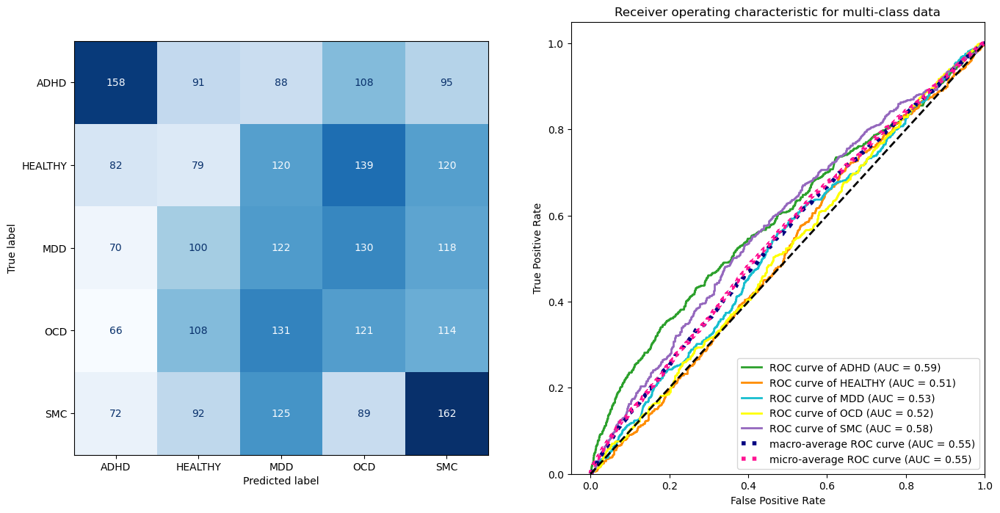

In [40]:
# final pipeline
best_params = {}
for hyperparameter in randsearch.best_params_:
    key = hyperparameter[5:]
    best_params[key] = randsearch.best_params_[hyperparameter]
print(best_params)

steps = [('col_trans', col_trans), ('pca', PCA()), ('gbc', GradientBoostingClassifier(**best_params))]
pipeline = Pipeline(steps)

# obtain predictions
Y_pred = cross_val_predict(pipeline, X, Y,  cv = cv_outer, groups = groups, n_jobs=-1, verbose=1)    
class_labels = le.inverse_transform(sorted(np.unique(Y)))
print('f1_score:', f1_score(Y, Y_pred, average = 'weighted', zero_division=0))
print()
print('classification report:\n', classification_report(Y, Y_pred, target_names=class_labels, zero_division=0))

# create subplots
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(16, 8))

# plot confusion matrix
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
conf_matrix = confusion_matrix(Y, Y_pred)
ConfusionMatrixDisplay(conf_matrix, display_labels = class_labels).plot(cmap = 'Blues', values_format = 'd', colorbar=False, ax=ax1)

# obtain proba predictions
Y_score = cross_val_predict(pipeline, X, Y,  cv = cv_outer, groups = groups, n_jobs=-1, verbose=1, method='predict_proba')

### plot ROC curves
from sklearn.metrics import roc_curve, auc
n_classes = Y_one_hot.shape[1]

fpr = dict()
tpr = dict()
roc_auc = dict()
lw=2


for i in range(n_classes):
    fpr[i], tpr[i], _ = roc_curve(Y_one_hot[:, i], Y_score[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])
colors = ['tab:green', 'darkorange', 'tab:cyan', 'yellow', 'tab:purple']
for i, color in zip(range(n_classes), colors):
    ax2.plot(fpr[i], tpr[i], color=color, lw=2,
             label=f'ROC curve of {class_labels[i]} (AUC = {roc_auc[i]:0.2f})')
    
## Compute macro-average ROC curve and AUC
fpr_grid = np.linspace(0.0, 1.0, 1000)

# Interpolate all ROC curves at these points
mean_tpr = np.zeros_like(fpr_grid)

for i in range(n_classes):
    mean_tpr += np.interp(fpr_grid, fpr[i], tpr[i])  # linear interpolation

# Average it and compute AUC
mean_tpr /= n_classes

fpr["macro"] = fpr_grid
tpr["macro"] = mean_tpr
roc_auc["macro"] = auc(fpr["macro"], tpr["macro"])
ax2.plot(
    fpr["macro"],
    tpr["macro"],
    label=f"macro-average ROC curve (AUC = {roc_auc['macro']:.2f})",
    color="navy",
    linestyle=":",
    linewidth=4,
)    
## Compute micro-average ROC curve and AUC
fpr["micro"], tpr["micro"], _ = roc_curve(Y_one_hot.ravel(), Y_score.ravel())
roc_auc["micro"] = auc(fpr["micro"], tpr["micro"])
ax2.plot(
    fpr["micro"],
    tpr["micro"],
    label=f"micro-average ROC curve (AUC = {roc_auc['micro']:.2f})",
    color="deeppink",
    linestyle=":",
    linewidth=4,
)


ax2.plot([0, 1], [0, 1], 'k--', lw=lw)
ax2.set_xlim([-0.05, 1.0])
ax2.set_ylim([0.0, 1.05])
ax2.set_xlabel('False Positive Rate')
ax2.set_ylabel('True Positive Rate')
ax2.set_title('Receiver operating characteristic for multi-class data')
ax2.legend(loc="lower right")
plt.show()

Checking feature importance

len(X) = 2700
X_train.shape = (2028, 100), X_test.shape = (672, 100), Y_train.shape = (2028,), Y_test.shape = (672,)
Fitting 3 folds for each of 100 candidates, totalling 300 fits


Text(0.5, 1.0, 'Difference between training - testing data')

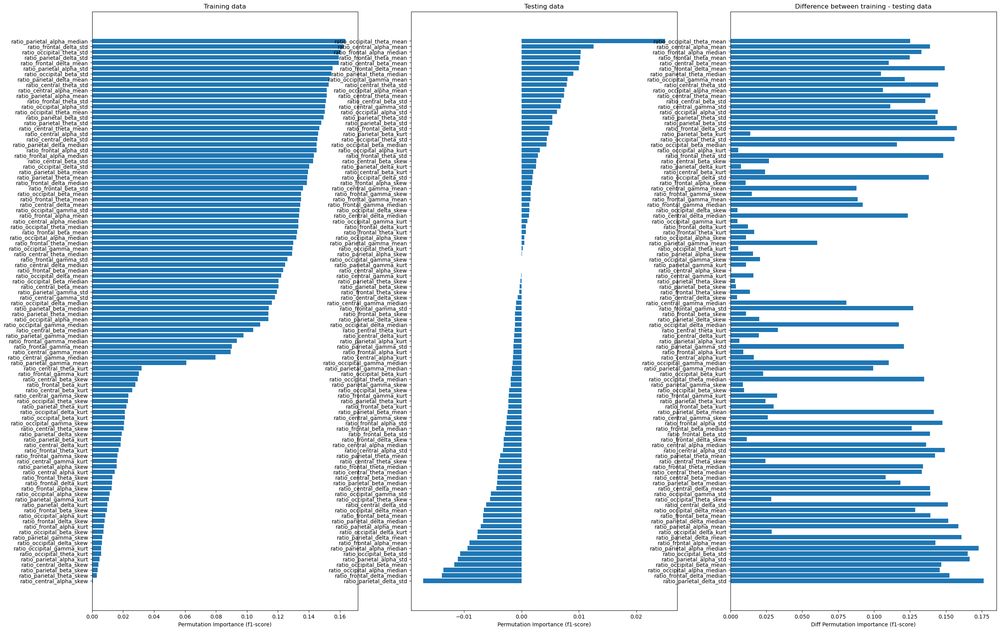

In [41]:
# using permutation_importance(), but according to literature it isn't a very reliable method for SVC with rbf kernel
from sklearn.inspection import permutation_importance

# splitting data into train and test set
desired_test_ratio = 0.25
n_splits = int(1 / desired_test_ratio) # for some reason (?), n_splits also determines the proportion between train & test indices
sgkf = StratifiedGroupKFold(n_splits=n_splits, shuffle=False)
train_idxs, test_idxs = sgkf.split(X, Y, groups).__next__() # just take the first split
print(f'{len(X) = }')

X_train = X.iloc[train_idxs]
X_test = X.iloc[test_idxs]
Y_train = Y[train_idxs]
Y_test = Y[test_idxs]
print(f'{X_train.shape = }, {X_test.shape = }, {Y_train.shape = }, {Y_test.shape = }')

# fit pipeline to training data
pipeline_fit = pipeline.fit(X_train, Y_train)
train_perm_importance = permutation_importance(pipeline_fit, X_train, Y_train,
                                    n_repeats=5, random_state=42,
                                    n_jobs=-1, scoring=f1_scorer)

train_sorted_idx = train_perm_importance.importances_mean.argsort()

fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(30, 20))
ax1.barh(X.columns[train_sorted_idx], train_perm_importance.importances_mean[train_sorted_idx])
ax1.set_xlabel("Permutation Importance (f1-score)")
ax1.set_title('Training data')

# fit pipeline to test data
test_perm_importance = permutation_importance(pipeline_fit, X_test, Y_test,
                                    n_repeats=5, random_state=42,
                                    n_jobs=-1, scoring=f1_scorer)

test_sorted_idx = test_perm_importance.importances_mean.argsort()
ax2.barh(X.columns[test_sorted_idx], test_perm_importance.importances_mean[test_sorted_idx])
ax2.set_xlabel("Permutation Importance (f1-score)")
ax2.set_title('Testing data')

# plot difference between training and testing permutation importance (im not entirely
# sure if the indices are the same for both test/train data, as the importances_mean attribute is just a numpy array)
diff = train_perm_importance.importances_mean - test_perm_importance.importances_mean
ax3.barh(X.columns[test_sorted_idx], diff[test_sorted_idx])
ax3.set_xlabel("Diff Permutation Importance (f1-score)")
ax3.set_title('Difference between training - testing data')

#### EC feature set

In [42]:
from sklearn.preprocessing import StandardScaler
from sklearn import metrics
from sklearn.model_selection import StratifiedGroupKFold, GridSearchCV, GroupShuffleSplit, RandomizedSearchCV
from sklearn.model_selection import train_test_split, cross_val_score, cross_val_predict, cross_validate
from sklearn.metrics import classification_report, confusion_matrix, f1_score, make_scorer, fbeta_score
from sklearn.metrics import make_scorer, accuracy_score, precision_score, recall_score, f1_score
from sklearn.pipeline import Pipeline, make_pipeline
from sklearn.impute import SimpleImputer
from sklearn import preprocessing
from sklearn.decomposition import PCA
from sklearn.compose import ColumnTransformer
from sklearn.ensemble import GradientBoostingClassifier
from scipy.stats import loguniform


# assign groups (IDs) for GroupKFold
groups = df_features_ec['ID'].tolist()
print(f'# of instances: {len(groups)}')

# define numeric columns
numeric_cols = []
for cond in ['EC']:
    for band in bands:
        for group in channel_groups:
            for stat in ['std', 'mean', 'median', 'skew', 'kurt']:
                numeric_cols.append(f'{cond}_{group}_{band}_{stat}')
 
X = df_features_ec[numeric_cols]
Y = df_features_ec['diagnosis']

# label binarize diagnosis for ROC curve (alphabatic order by default)
# & label encode diagnosis for predictions
from sklearn import preprocessing
lb = preprocessing.LabelBinarizer()
Y_one_hot = lb.fit_transform(Y)
print(Y_one_hot.shape)
le = preprocessing.LabelEncoder()
Y = le.fit_transform(Y)

# preprocessing steps for numerical features
numeric_transformer = Pipeline(steps = [
    ('scaler', StandardScaler()), # standardization
    ('impute', SimpleImputer(strategy='mean')) # mean imputation
])

col_trans = ColumnTransformer(transformers=[
    ('numeric_transformer', numeric_transformer, numeric_cols)
    ],
    remainder='drop',
    n_jobs=-1)


# final pipeline
steps = [('col_trans', col_trans), ('pca', PCA()), ('gbc', GradientBoostingClassifier())]
pipeline = Pipeline(steps)

# define score metric
f1_scorer = make_scorer(fbeta_score, beta=1, average='weighted')

# define inner & outer CV objects
cv_inner = StratifiedGroupKFold(n_splits = 3, shuffle=False) # shuffle=False, so splits will be the same across calls (?)
cv_outer = StratifiedGroupKFold(n_splits = 5, shuffle=False) # shuffle=False, so splits will be the same across calls (?)

## Hyperparameters for RandomizedSearchCV
# Number of boosting stages to perform
n_estimators = [int(x) for x in np.linspace(start = 100, stop = 1000, num = 10)]
# Loss function to be optimized
loss = ['log_loss']
# Learning rate
learning_rate = loguniform.rvs(0.001, 0.1, size=1000)
# Fraction of samples to be used for fitting the individual base learners
subsample = [x for x in np.linspace(0.5, 1, 5)]
# The function to measure the quality of the split
criterion = ['friedman_mse']
# The min number of samples required to split an internal node
min_samples_split = [2, 5, 10]
# Create the random grid
random_grid = {'gbc__n_estimators': n_estimators,
               'gbc__loss': loss,
               'gbc__learning_rate': learning_rate,
               'gbc__subsample': subsample,
               'gbc__criterion': criterion,
               'gbc__min_samples_split': min_samples_split}

# define randomized search
randsearch = RandomizedSearchCV(pipeline,
                                param_distributions=random_grid,
                                n_iter=100, # 100
                                cv = cv_inner, # use inner cv for hyperparameter tuning
                                scoring = f1_scorer,
                                error_score = 'raise',
                                return_train_score = True,
                                n_jobs=-1,
                                verbose=1)

# non-nested CV for obtaining the propable best hyperparameters
randsearch_fit = randsearch.fit(X, Y, groups = groups)
print(f'Best parameters: {randsearch_fit.best_params_}')
print(f'Best f1-score: {randsearch_fit.best_score_}')

# nested CV with parameter optimization to compute testing score (f1-score)
gbc_test_score = cross_val_score(randsearch, # use unfitted gridsearch object, (idk if this matters)
                                 X = X, y = Y, 
                                 cv = cv_outer, # use outer cv for model evaluation
                                 groups = groups, 
                                 params={"groups": groups},
                                 scoring = f1_scorer,
                                 error_score = 'raise',
                                 verbose=1,
                                 n_jobs=-1)
print('GBC test scores:', gbc_test_score)
print('Mean GBC test score:', np.mean(gbc_test_score))


# of instances: 2700
(2700, 5)
Fitting 3 folds for each of 100 candidates, totalling 300 fits
Best parameters: {'gbc__subsample': 0.5, 'gbc__n_estimators': 900, 'gbc__min_samples_split': 2, 'gbc__loss': 'log_loss', 'gbc__learning_rate': 0.003350937608143066, 'gbc__criterion': 'friedman_mse'}
Best f1-score: 0.2835586712233256


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 30 concurrent workers.
/home/tsmolders/.conda/envs/py3117/lib/python3.11/site-packages/sklearn/utils/extmath.py:1144: RuntimeWarning: invalid value encountered in divide
  * (last_sum / last_over_new_count - new_sum) ** 2
/home/tsmolders/.conda/envs/py3117/lib/python3.11/site-packages/sklearn/utils/extmath.py:1144: RuntimeWarning: invalid value encountered in divide
  * (last_sum / last_over_new_count - new_sum) ** 2
/home/tsmolders/.conda/envs/py3117/lib/python3.11/site-packages/sklearn/utils/extmath.py:1144: RuntimeWarning: invalid value encountered in divide
  * (last_sum / last_over_new_count - new_sum) ** 2
/home/tsmolders/.conda/envs/py3117/lib/python3.11/site-packages/sklearn/utils/extmath.py:1144: RuntimeWarning: invalid value encountered in divide
  * (last_sum / last_over_new_count - new_sum) ** 2
/home/tsmolders/.conda/envs/py3117/lib/python3.11/site-packages/sklearn/utils/extmath.py:1144: RuntimeWarning: invalid value en

Fitting 3 folds for each of 100 candidates, totalling 300 fits
Fitting 3 folds for each of 100 candidates, totalling 300 fits
Fitting 3 folds for each of 100 candidates, totalling 300 fits
Fitting 3 folds for each of 100 candidates, totalling 300 fits
Fitting 3 folds for each of 100 candidates, totalling 300 fits
GBC test scores: [0.29632901 0.29230725 0.27143922 0.19547807 0.28095212]
Mean GBC test score: 0.26730113469690703


[Parallel(n_jobs=-1)]: Done   5 out of   5 | elapsed: 105.1min finished


In [21]:
# calculate std (CAREFUL: WAS CALCULATED AFTERWARDS, SO NUMBERS DO NOT UPDATE AUTOMATICALLY)
print(np.std([0.29632901, 0.29230725, 0.27143922, 0.19547807, 0.28095212]))

0.03695929955867811


{'subsample': 0.5, 'n_estimators': 900, 'min_samples_split': 2, 'loss': 'log_loss', 'learning_rate': 0.003350937608143066, 'criterion': 'friedman_mse'}


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 30 concurrent workers.
/home/tsmolders/.conda/envs/py3117/lib/python3.11/site-packages/joblib/externals/loky/process_executor.py:700: UserWarning: A worker stopped while some jobs were given to the executor. This can be caused by a too short worker timeout or by a memory leak.
  warnings.warn(
[Parallel(n_jobs=-1)]: Done   5 out of   5 | elapsed:  2.7min finished


f1_score: 0.25633590474443335

classification report:
               precision    recall  f1-score   support

        ADHD       0.38      0.29      0.33       540
     HEALTHY       0.28      0.31      0.30       540
         MDD       0.20      0.19      0.20       540
         OCD       0.17      0.20      0.19       540
         SMC       0.27      0.29      0.28       540

    accuracy                           0.25      2700
   macro avg       0.26      0.25      0.26      2700
weighted avg       0.26      0.25      0.26      2700



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 30 concurrent workers.
[Parallel(n_jobs=-1)]: Done   5 out of   5 | elapsed:  2.7min finished


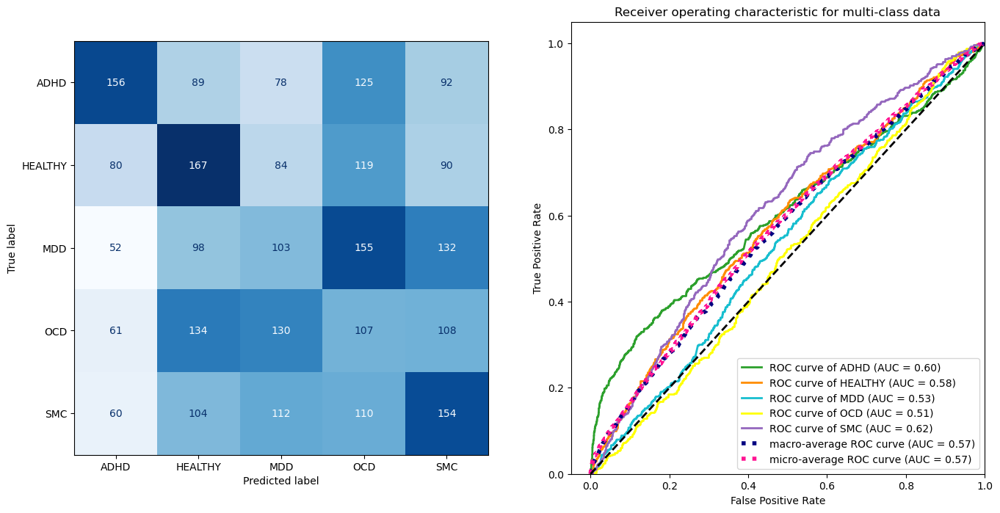

In [43]:
# final pipeline
best_params = {}
for hyperparameter in randsearch.best_params_:
    key = hyperparameter[5:]
    best_params[key] = randsearch.best_params_[hyperparameter]
print(best_params)

steps = [('col_trans', col_trans), ('pca', PCA()), ('gbc', GradientBoostingClassifier(**best_params))]
pipeline = Pipeline(steps)

# obtain predictions
Y_pred = cross_val_predict(pipeline, X, Y,  cv = cv_outer, groups = groups, n_jobs=-1, verbose=1)    
class_labels = le.inverse_transform(sorted(np.unique(Y)))
print('f1_score:', f1_score(Y, Y_pred, average = 'weighted', zero_division=0))
print()
print('classification report:\n', classification_report(Y, Y_pred, target_names=class_labels, zero_division=0))

# create subplots
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(16, 8))

# plot confusion matrix
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
conf_matrix = confusion_matrix(Y, Y_pred)
ConfusionMatrixDisplay(conf_matrix, display_labels = class_labels).plot(cmap = 'Blues', values_format = 'd', colorbar=False, ax=ax1)

# obtain proba predictions
Y_score = cross_val_predict(pipeline, X, Y,  cv = cv_outer, groups = groups, n_jobs=-1, verbose=1, method='predict_proba')

### plot ROC curves
from sklearn.metrics import roc_curve, auc
n_classes = Y_one_hot.shape[1]

fpr = dict()
tpr = dict()
roc_auc = dict()
lw=2


for i in range(n_classes):
    fpr[i], tpr[i], _ = roc_curve(Y_one_hot[:, i], Y_score[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])
colors = ['tab:green', 'darkorange', 'tab:cyan', 'yellow', 'tab:purple']
for i, color in zip(range(n_classes), colors):
    ax2.plot(fpr[i], tpr[i], color=color, lw=2,
             label=f'ROC curve of {class_labels[i]} (AUC = {roc_auc[i]:0.2f})')
    
## Compute macro-average ROC curve and AUC
fpr_grid = np.linspace(0.0, 1.0, 1000)

# Interpolate all ROC curves at these points
mean_tpr = np.zeros_like(fpr_grid)

for i in range(n_classes):
    mean_tpr += np.interp(fpr_grid, fpr[i], tpr[i])  # linear interpolation

# Average it and compute AUC
mean_tpr /= n_classes

fpr["macro"] = fpr_grid
tpr["macro"] = mean_tpr
roc_auc["macro"] = auc(fpr["macro"], tpr["macro"])
ax2.plot(
    fpr["macro"],
    tpr["macro"],
    label=f"macro-average ROC curve (AUC = {roc_auc['macro']:.2f})",
    color="navy",
    linestyle=":",
    linewidth=4,
)    
## Compute micro-average ROC curve and AUC
fpr["micro"], tpr["micro"], _ = roc_curve(Y_one_hot.ravel(), Y_score.ravel())
roc_auc["micro"] = auc(fpr["micro"], tpr["micro"])
ax2.plot(
    fpr["micro"],
    tpr["micro"],
    label=f"micro-average ROC curve (AUC = {roc_auc['micro']:.2f})",
    color="deeppink",
    linestyle=":",
    linewidth=4,
)


ax2.plot([0, 1], [0, 1], 'k--', lw=lw)
ax2.set_xlim([-0.05, 1.0])
ax2.set_ylim([0.0, 1.05])
ax2.set_xlabel('False Positive Rate')
ax2.set_ylabel('True Positive Rate')
ax2.set_title('Receiver operating characteristic for multi-class data')
ax2.legend(loc="lower right")
plt.show()

Checking feature importance

len(X) = 2700
X_train.shape = (2028, 100), X_test.shape = (672, 100), Y_train.shape = (2028,), Y_test.shape = (672,)


Text(0.5, 1.0, 'Difference between training - testing data')

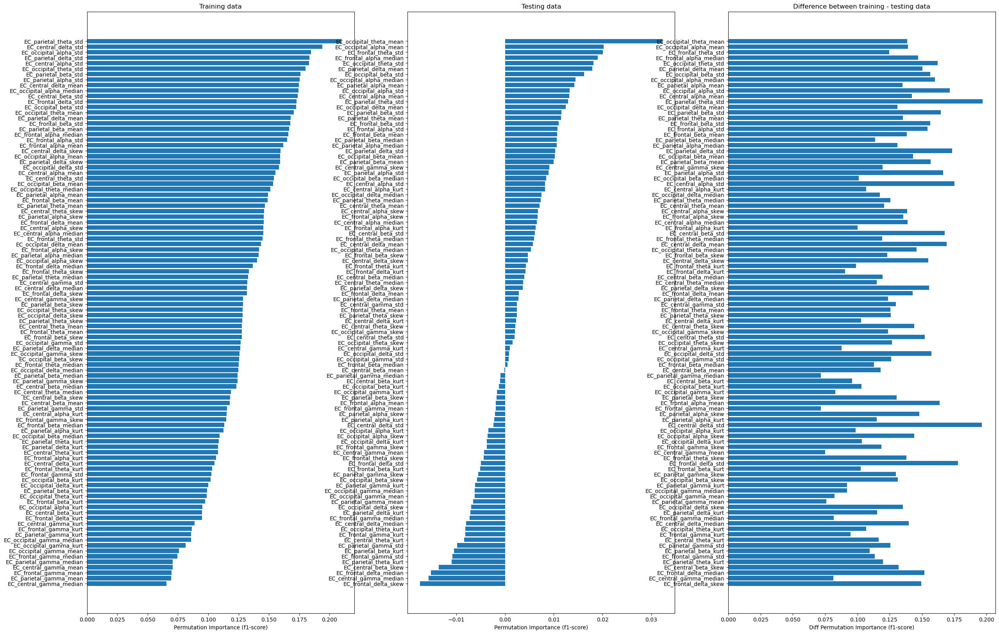

In [44]:
# using permutation_importance(), but according to literature it isn't a very reliable method for SVC with rbf kernel
from sklearn.inspection import permutation_importance

# splitting data into train and test set
desired_test_ratio = 0.25
n_splits = int(1 / desired_test_ratio) # for some reason (?), n_splits also determines the proportion between train & test indices
sgkf = StratifiedGroupKFold(n_splits=n_splits, shuffle=False)
train_idxs, test_idxs = sgkf.split(X, Y, groups).__next__() # just take the first split
print(f'{len(X) = }')

X_train = X.iloc[train_idxs]
X_test = X.iloc[test_idxs]
Y_train = Y[train_idxs]
Y_test = Y[test_idxs]
print(f'{X_train.shape = }, {X_test.shape = }, {Y_train.shape = }, {Y_test.shape = }')

# fit pipeline to training data
pipeline_fit = pipeline.fit(X_train, Y_train)
train_perm_importance = permutation_importance(pipeline_fit, X_train, Y_train,
                                    n_repeats=5, random_state=42,
                                    n_jobs=-1, scoring=f1_scorer)

train_sorted_idx = train_perm_importance.importances_mean.argsort()

fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(30, 20))
ax1.barh(X.columns[train_sorted_idx], train_perm_importance.importances_mean[train_sorted_idx])
ax1.set_xlabel("Permutation Importance (f1-score)")
ax1.set_title('Training data')

# fit pipeline to test data
test_perm_importance = permutation_importance(pipeline_fit, X_test, Y_test,
                                    n_repeats=5, random_state=42,
                                    n_jobs=-1, scoring=f1_scorer)

test_sorted_idx = test_perm_importance.importances_mean.argsort()
ax2.barh(X.columns[test_sorted_idx], test_perm_importance.importances_mean[test_sorted_idx])
ax2.set_xlabel("Permutation Importance (f1-score)")
ax2.set_title('Testing data')

# plot difference between training and testing permutation importance (im not entirely
# sure if the indices are the same for both test/train data, as the importances_mean attribute is just a numpy array)
diff = train_perm_importance.importances_mean - test_perm_importance.importances_mean
ax3.barh(X.columns[test_sorted_idx], diff[test_sorted_idx])
ax3.set_xlabel("Diff Permutation Importance (f1-score)")
ax3.set_title('Difference between training - testing data')

#### EO feature set

In [15]:
from sklearn.preprocessing import StandardScaler
from sklearn import metrics
from sklearn.model_selection import StratifiedGroupKFold, GridSearchCV, GroupShuffleSplit, RandomizedSearchCV
from sklearn.model_selection import train_test_split, cross_val_score, cross_val_predict, cross_validate
from sklearn.metrics import classification_report, confusion_matrix, f1_score, make_scorer, fbeta_score
from sklearn.metrics import make_scorer, accuracy_score, precision_score, recall_score, f1_score
from sklearn.pipeline import Pipeline, make_pipeline
from sklearn.impute import SimpleImputer
from sklearn import preprocessing
from sklearn.decomposition import PCA
from sklearn.compose import ColumnTransformer
from sklearn.ensemble import GradientBoostingClassifier
from scipy.stats import loguniform


# assign groups (IDs) for GroupKFold
groups = df_features_eo['ID'].tolist()
print(f'# of instances: {len(groups)}')

# define numeric columns
numeric_cols = []
for cond in ['EO']:
    for band in bands:
        for group in channel_groups:
            for stat in ['std', 'mean', 'median', 'skew', 'kurt']:
                numeric_cols.append(f'{cond}_{group}_{band}_{stat}')
 
X = df_features_eo[numeric_cols]
Y = df_features_eo['diagnosis']

# label binarize diagnosis for ROC curve (alphabatic order by default)
# & label encode diagnosis for predictions
from sklearn import preprocessing
lb = preprocessing.LabelBinarizer()
Y_one_hot = lb.fit_transform(Y)
print(Y_one_hot.shape)
le = preprocessing.LabelEncoder()
Y = le.fit_transform(Y)

# preprocessing steps for numerical features
numeric_transformer = Pipeline(steps = [
    ('scaler', StandardScaler()), # standardization
    ('impute', SimpleImputer(strategy='mean')) # mean imputation
])

col_trans = ColumnTransformer(transformers=[
    ('numeric_transformer', numeric_transformer, numeric_cols)
    ],
    remainder='drop',
    n_jobs=-1)


# final pipeline
steps = [('col_trans', col_trans), ('pca', PCA()), ('gbc', GradientBoostingClassifier())]
pipeline = Pipeline(steps)

# define score metric
f1_scorer = make_scorer(fbeta_score, beta=1, average='weighted')

# define inner & outer CV objects
cv_inner = StratifiedGroupKFold(n_splits = 3, shuffle=False) # shuffle=False, so splits will be the same across calls (?)
cv_outer = StratifiedGroupKFold(n_splits = 5, shuffle=False) # shuffle=False, so splits will be the same across calls (?)

## Hyperparameters for RandomizedSearchCV
# Number of boosting stages to perform
n_estimators = [int(x) for x in np.linspace(start = 100, stop = 1000, num = 10)]
# Loss function to be optimized
loss = ['log_loss']
# Learning rate
learning_rate = loguniform.rvs(0.001, 0.1, size=1000)
# Fraction of samples to be used for fitting the individual base learners
subsample = [x for x in np.linspace(0.5, 1, 5)]
# The function to measure the quality of the split
criterion = ['friedman_mse']
# The min number of samples required to split an internal node
min_samples_split = [2, 5, 10]
# Create the random grid
random_grid = {'gbc__n_estimators': n_estimators,
               'gbc__loss': loss,
               'gbc__learning_rate': learning_rate,
               'gbc__subsample': subsample,
               'gbc__criterion': criterion,
               'gbc__min_samples_split': min_samples_split}

# define randomized search
randsearch = RandomizedSearchCV(pipeline,
                                param_distributions=random_grid,
                                n_iter=100, # 100
                                cv = cv_inner, # use inner cv for hyperparameter tuning
                                scoring = f1_scorer,
                                error_score = 'raise',
                                return_train_score = True,
                                n_jobs=-1,
                                verbose=1)

# non-nested CV for obtaining the propable best hyperparameters
randsearch_fit = randsearch.fit(X, Y, groups = groups)
print(f'Best parameters: {randsearch_fit.best_params_}')
print(f'Best f1-score: {randsearch_fit.best_score_}')

# nested CV with parameter optimization to compute testing score (f1-score)
gbc_test_score = cross_val_score(randsearch, # use unfitted gridsearch object, (idk if this matters)
                                 X = X, y = Y, 
                                 cv = cv_outer, # use outer cv for model evaluation
                                 groups = groups, 
                                 params={"groups": groups},
                                 scoring = f1_scorer,
                                 error_score = 'raise',
                                 verbose=1,
                                 n_jobs=-1)
print('GBC test scores:', gbc_test_score)
print('Mean GBC test score:', np.mean(gbc_test_score))


# of instances: 2700
(2700, 5)
Fitting 3 folds for each of 100 candidates, totalling 300 fits
Best parameters: {'gbc__subsample': 0.5, 'gbc__n_estimators': 100, 'gbc__min_samples_split': 10, 'gbc__loss': 'log_loss', 'gbc__learning_rate': 0.018414529816270942, 'gbc__criterion': 'friedman_mse'}
Best f1-score: 0.29619593444487563


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 30 concurrent workers.
/home/tsmolders/.conda/envs/py3117/lib/python3.11/site-packages/sklearn/utils/extmath.py:1144: RuntimeWarning: invalid value encountered in divide
  * (last_sum / last_over_new_count - new_sum) ** 2
/home/tsmolders/.conda/envs/py3117/lib/python3.11/site-packages/sklearn/utils/extmath.py:1144: RuntimeWarning: invalid value encountered in divide
  * (last_sum / last_over_new_count - new_sum) ** 2
/home/tsmolders/.conda/envs/py3117/lib/python3.11/site-packages/sklearn/utils/extmath.py:1144: RuntimeWarning: invalid value encountered in divide
  * (last_sum / last_over_new_count - new_sum) ** 2
/home/tsmolders/.conda/envs/py3117/lib/python3.11/site-packages/sklearn/utils/extmath.py:1144: RuntimeWarning: invalid value encountered in divide
  * (last_sum / last_over_new_count - new_sum) ** 2
/home/tsmolders/.conda/envs/py3117/lib/python3.11/site-packages/sklearn/utils/extmath.py:1144: RuntimeWarning: invalid value en

Fitting 3 folds for each of 100 candidates, totalling 300 fits
Fitting 3 folds for each of 100 candidates, totalling 300 fits
Fitting 3 folds for each of 100 candidates, totalling 300 fits
Fitting 3 folds for each of 100 candidates, totalling 300 fits
Fitting 3 folds for each of 100 candidates, totalling 300 fits
GBC test scores: [0.3481645  0.31105928 0.25751705 0.23140989 0.26738602]
Mean GBC test score: 0.2831073508631497


[Parallel(n_jobs=-1)]: Done   5 out of   5 | elapsed: 103.9min finished


In [23]:
# calculate std (CAREFUL: WAS CALCULATED AFTERWARDS, SO NUMBERS DO NOT UPDATE AUTOMATICALLY)
print(np.std([0.3481645,  0.31105928, 0.25751705, 0.23140989, 0.26738602]))

0.0414448891863831


{'subsample': 0.5, 'n_estimators': 100, 'min_samples_split': 10, 'loss': 'log_loss', 'learning_rate': 0.018414529816270942, 'criterion': 'friedman_mse'}


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 30 concurrent workers.
/home/tsmolders/.conda/envs/py3117/lib/python3.11/site-packages/joblib/externals/loky/process_executor.py:700: UserWarning: A worker stopped while some jobs were given to the executor. This can be caused by a too short worker timeout or by a memory leak.
  warnings.warn(
[Parallel(n_jobs=-1)]: Done   5 out of   5 | elapsed:   19.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 30 concurrent workers.


f1_score: 0.27722900629917663

classification report:
               precision    recall  f1-score   support

        ADHD       0.40      0.33      0.36       540
     HEALTHY       0.25      0.26      0.25       540
         MDD       0.24      0.22      0.23       540
         OCD       0.24      0.22      0.23       540
         SMC       0.28      0.36      0.32       540

    accuracy                           0.28      2700
   macro avg       0.28      0.28      0.28      2700
weighted avg       0.28      0.28      0.28      2700



[Parallel(n_jobs=-1)]: Done   5 out of   5 | elapsed:   18.6s finished


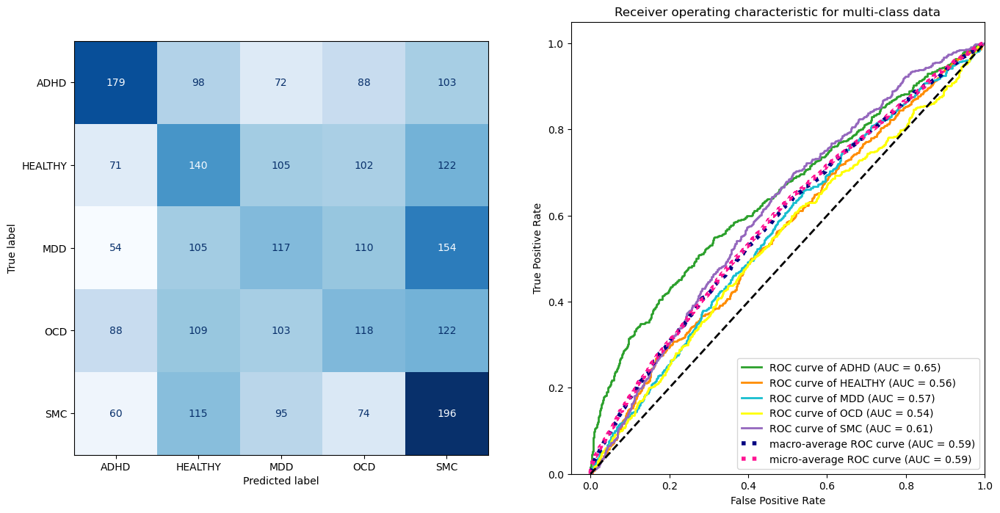

In [16]:
# final pipeline
best_params = {}
for hyperparameter in randsearch.best_params_:
    key = hyperparameter[5:]
    best_params[key] = randsearch.best_params_[hyperparameter]
print(best_params)

steps = [('col_trans', col_trans), ('pca', PCA()), ('gbc', GradientBoostingClassifier(**best_params))]
pipeline = Pipeline(steps)

# obtain predictions
Y_pred = cross_val_predict(pipeline, X, Y,  cv = cv_outer, groups = groups, n_jobs=-1, verbose=1)    
class_labels = le.inverse_transform(sorted(np.unique(Y)))
print('f1_score:', f1_score(Y, Y_pred, average = 'weighted', zero_division=0))
print()
print('classification report:\n', classification_report(Y, Y_pred, target_names=class_labels, zero_division=0))

# create subplots
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(16, 8))

# plot confusion matrix
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
conf_matrix = confusion_matrix(Y, Y_pred)
ConfusionMatrixDisplay(conf_matrix, display_labels = class_labels).plot(cmap = 'Blues', values_format = 'd', colorbar=False, ax=ax1)

# obtain proba predictions
Y_score = cross_val_predict(pipeline, X, Y,  cv = cv_outer, groups = groups, n_jobs=-1, verbose=1, method='predict_proba')

### plot ROC curves
from sklearn.metrics import roc_curve, auc
n_classes = Y_one_hot.shape[1]

fpr = dict()
tpr = dict()
roc_auc = dict()
lw=2


for i in range(n_classes):
    fpr[i], tpr[i], _ = roc_curve(Y_one_hot[:, i], Y_score[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])
colors = ['tab:green', 'darkorange', 'tab:cyan', 'yellow', 'tab:purple']
for i, color in zip(range(n_classes), colors):
    ax2.plot(fpr[i], tpr[i], color=color, lw=2,
             label=f'ROC curve of {class_labels[i]} (AUC = {roc_auc[i]:0.2f})')
    
## Compute macro-average ROC curve and AUC
fpr_grid = np.linspace(0.0, 1.0, 1000)

# Interpolate all ROC curves at these points
mean_tpr = np.zeros_like(fpr_grid)

for i in range(n_classes):
    mean_tpr += np.interp(fpr_grid, fpr[i], tpr[i])  # linear interpolation

# Average it and compute AUC
mean_tpr /= n_classes

fpr["macro"] = fpr_grid
tpr["macro"] = mean_tpr
roc_auc["macro"] = auc(fpr["macro"], tpr["macro"])
ax2.plot(
    fpr["macro"],
    tpr["macro"],
    label=f"macro-average ROC curve (AUC = {roc_auc['macro']:.2f})",
    color="navy",
    linestyle=":",
    linewidth=4,
)    
## Compute micro-average ROC curve and AUC
fpr["micro"], tpr["micro"], _ = roc_curve(Y_one_hot.ravel(), Y_score.ravel())
roc_auc["micro"] = auc(fpr["micro"], tpr["micro"])
ax2.plot(
    fpr["micro"],
    tpr["micro"],
    label=f"micro-average ROC curve (AUC = {roc_auc['micro']:.2f})",
    color="deeppink",
    linestyle=":",
    linewidth=4,
)


ax2.plot([0, 1], [0, 1], 'k--', lw=lw)
ax2.set_xlim([-0.05, 1.0])
ax2.set_ylim([0.0, 1.05])
ax2.set_xlabel('False Positive Rate')
ax2.set_ylabel('True Positive Rate')
ax2.set_title('Receiver operating characteristic for multi-class data')
ax2.legend(loc="lower right")
plt.show()

Checking feature importance

len(X) = 2700
X_train.shape = (2028, 100), X_test.shape = (672, 100), Y_train.shape = (2028,), Y_test.shape = (672,)


Text(0.5, 1.0, 'Difference between training - testing data')

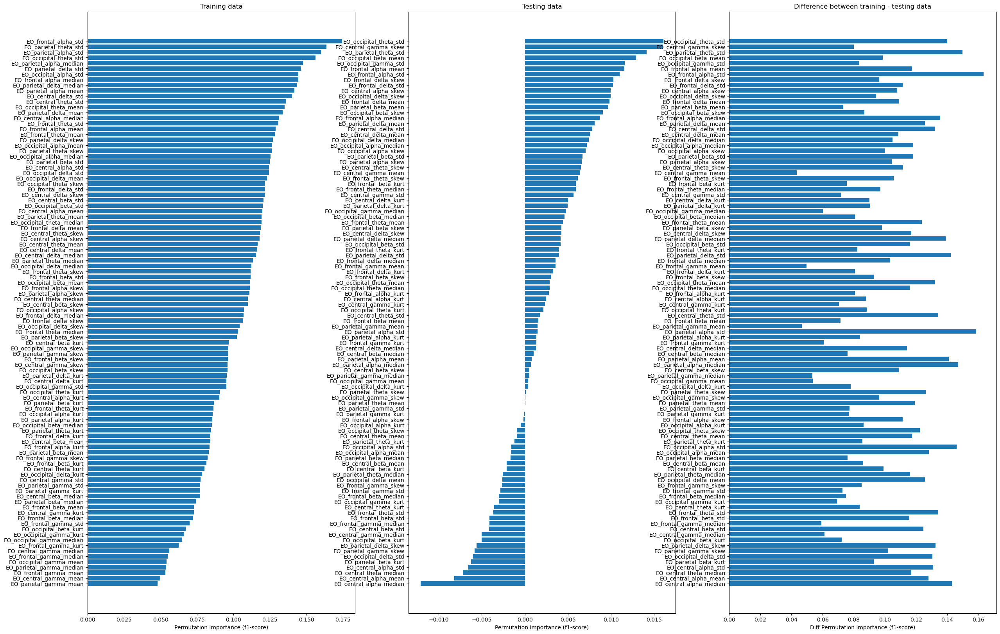

In [17]:
# using permutation_importance(), but according to literature it isn't a very reliable method for SVC with rbf kernel
from sklearn.inspection import permutation_importance

# splitting data into train and test set
desired_test_ratio = 0.25
n_splits = int(1 / desired_test_ratio) # for some reason (?), n_splits also determines the proportion between train & test indices
sgkf = StratifiedGroupKFold(n_splits=n_splits, shuffle=False)
train_idxs, test_idxs = sgkf.split(X, Y, groups).__next__() # just take the first split
print(f'{len(X) = }')

X_train = X.iloc[train_idxs]
X_test = X.iloc[test_idxs]
Y_train = Y[train_idxs]
Y_test = Y[test_idxs]
print(f'{X_train.shape = }, {X_test.shape = }, {Y_train.shape = }, {Y_test.shape = }')

# fit pipeline to training data
pipeline_fit = pipeline.fit(X_train, Y_train)
train_perm_importance = permutation_importance(pipeline_fit, X_train, Y_train,
                                    n_repeats=5, random_state=42,
                                    n_jobs=-1, scoring=f1_scorer)

train_sorted_idx = train_perm_importance.importances_mean.argsort()

fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(30, 20))
ax1.barh(X.columns[train_sorted_idx], train_perm_importance.importances_mean[train_sorted_idx])
ax1.set_xlabel("Permutation Importance (f1-score)")
ax1.set_title('Training data')

# fit pipeline to test data
test_perm_importance = permutation_importance(pipeline_fit, X_test, Y_test,
                                    n_repeats=5, random_state=42,
                                    n_jobs=-1, scoring=f1_scorer)

test_sorted_idx = test_perm_importance.importances_mean.argsort()
ax2.barh(X.columns[test_sorted_idx], test_perm_importance.importances_mean[test_sorted_idx])
ax2.set_xlabel("Permutation Importance (f1-score)")
ax2.set_title('Testing data')

# plot difference between training and testing permutation importance (im not entirely
# sure if the indices are the same for both test/train data, as the importances_mean attribute is just a numpy array)
diff = train_perm_importance.importances_mean - test_perm_importance.importances_mean
ax3.barh(X.columns[test_sorted_idx], diff[test_sorted_idx])
ax3.set_xlabel("Diff Permutation Importance (f1-score)")
ax3.set_title('Difference between training - testing data')

### GBC without skew & kurt

#### ratio feature set

In [18]:
from sklearn.preprocessing import StandardScaler
from sklearn import metrics
from sklearn.model_selection import StratifiedGroupKFold, GridSearchCV, GroupShuffleSplit, RandomizedSearchCV
from sklearn.model_selection import train_test_split, cross_val_score, cross_val_predict, cross_validate
from sklearn.metrics import classification_report, confusion_matrix, f1_score, make_scorer, fbeta_score
from sklearn.metrics import make_scorer, accuracy_score, precision_score, recall_score, f1_score
from sklearn.pipeline import Pipeline, make_pipeline
from sklearn.impute import SimpleImputer
from sklearn import preprocessing
from sklearn.decomposition import PCA
from sklearn.compose import ColumnTransformer
from sklearn.ensemble import GradientBoostingClassifier
from scipy.stats import loguniform


# assign groups (IDs) for GroupKFold
groups = df_features_ratio_nosk['ID'].tolist()
print(f'# of instances: {len(groups)}')

# define numeric columns
numeric_cols = []
for cond in ['ratio']:
    for band in bands:
        for group in channel_groups:
            for stat in ['std', 'mean', 'median']:
                numeric_cols.append(f'{cond}_{group}_{band}_{stat}')
 
X = df_features_ratio_nosk[numeric_cols]
Y = df_features_ratio_nosk['diagnosis']

# label binarize diagnosis for ROC curve (alphabatic order by default)
# & label encode diagnosis for predictions
from sklearn import preprocessing
lb = preprocessing.LabelBinarizer()
Y_one_hot = lb.fit_transform(Y)
print(Y_one_hot.shape)
le = preprocessing.LabelEncoder()
Y = le.fit_transform(Y)

# preprocessing steps for numerical features
numeric_transformer = Pipeline(steps = [
    ('scaler', StandardScaler()), # standardization
    ('impute', SimpleImputer(strategy='mean')) # mean imputation
])

col_trans = ColumnTransformer(transformers=[
    ('numeric_transformer', numeric_transformer, numeric_cols)
    ],
    remainder='drop',
    n_jobs=-1)


# final pipeline
steps = [('col_trans', col_trans), ('pca', PCA()), ('gbc', GradientBoostingClassifier())]
pipeline = Pipeline(steps)

# define score metric
f1_scorer = make_scorer(fbeta_score, beta=1, average='weighted')

# define inner & outer CV objects
cv_inner = StratifiedGroupKFold(n_splits = 3, shuffle=False) # shuffle=False, so splits will be the same across calls (?)
cv_outer = StratifiedGroupKFold(n_splits = 5, shuffle=False) # shuffle=False, so splits will be the same across calls (?)

## Hyperparameters for RandomizedSearchCV
# Number of boosting stages to perform
n_estimators = [int(x) for x in np.linspace(start = 100, stop = 1000, num = 10)]
# Loss function to be optimized
loss = ['log_loss']
# Learning rate
learning_rate = loguniform.rvs(0.001, 0.1, size=1000)
# Fraction of samples to be used for fitting the individual base learners
subsample = [x for x in np.linspace(0.5, 1, 5)]
# The function to measure the quality of the split
criterion = ['friedman_mse']
# The min number of samples required to split an internal node
min_samples_split = [2, 5, 10]
# Create the random grid
random_grid = {'gbc__n_estimators': n_estimators,
               'gbc__loss': loss,
               'gbc__learning_rate': learning_rate,
               'gbc__subsample': subsample,
               'gbc__criterion': criterion,
               'gbc__min_samples_split': min_samples_split}

# define randomized search
randsearch = RandomizedSearchCV(pipeline,
                                param_distributions=random_grid,
                                n_iter=100, # 100
                                cv = cv_inner, # use inner cv for hyperparameter tuning
                                scoring = f1_scorer,
                                error_score = 'raise',
                                return_train_score = True,
                                n_jobs=-1,
                                verbose=1)

# non-nested CV for obtaining the propable best hyperparameters
randsearch_fit = randsearch.fit(X, Y, groups = groups)
print(f'Best parameters: {randsearch_fit.best_params_}')
print(f'Best f1-score: {randsearch_fit.best_score_}')

# nested CV with parameter optimization to compute testing score (f1-score)
gbc_test_score = cross_val_score(randsearch, # use unfitted gridsearch object, (idk if this matters)
                                 X = X, y = Y, 
                                 cv = cv_outer, # use outer cv for model evaluation
                                 groups = groups, 
                                 params={"groups": groups},
                                 scoring = f1_scorer,
                                 error_score = 'raise',
                                 verbose=1,
                                 n_jobs=-1)
print('GBC test scores:', gbc_test_score)
print('Mean GBC test score:', np.mean(gbc_test_score))


# of instances: 2700
(2700, 5)
Fitting 3 folds for each of 100 candidates, totalling 300 fits
Best parameters: {'gbc__subsample': 0.5, 'gbc__n_estimators': 1000, 'gbc__min_samples_split': 10, 'gbc__loss': 'log_loss', 'gbc__learning_rate': 0.0015385042183957722, 'gbc__criterion': 'friedman_mse'}
Best f1-score: 0.25191225600015904


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 30 concurrent workers.
/home/tsmolders/.conda/envs/py3117/lib/python3.11/site-packages/sklearn/utils/extmath.py:1144: RuntimeWarning: invalid value encountered in divide
  * (last_sum / last_over_new_count - new_sum) ** 2
/home/tsmolders/.conda/envs/py3117/lib/python3.11/site-packages/sklearn/utils/extmath.py:1144: RuntimeWarning: invalid value encountered in divide
  * (last_sum / last_over_new_count - new_sum) ** 2
/home/tsmolders/.conda/envs/py3117/lib/python3.11/site-packages/sklearn/utils/extmath.py:1144: RuntimeWarning: invalid value encountered in divide
  * (last_sum / last_over_new_count - new_sum) ** 2
/home/tsmolders/.conda/envs/py3117/lib/python3.11/site-packages/sklearn/utils/extmath.py:1144: RuntimeWarning: invalid value encountered in divide
  * (last_sum / last_over_new_count - new_sum) ** 2
/home/tsmolders/.conda/envs/py3117/lib/python3.11/site-packages/sklearn/utils/extmath.py:1144: RuntimeWarning: invalid value en

Fitting 3 folds for each of 100 candidates, totalling 300 fits
Fitting 3 folds for each of 100 candidates, totalling 300 fits
Fitting 3 folds for each of 100 candidates, totalling 300 fits
Fitting 3 folds for each of 100 candidates, totalling 300 fits
Fitting 3 folds for each of 100 candidates, totalling 300 fits
GBC test scores: [0.29063655 0.23614028 0.20793037 0.23423743 0.27286599]
Mean GBC test score: 0.2483621232085195


[Parallel(n_jobs=-1)]: Done   5 out of   5 | elapsed: 95.0min finished


In [20]:
# calculate std (CAREFUL: WAS CALCULATED AFTERWARDS, SO NUMBERS DO NOT UPDATE AUTOMATICALLY)
print(np.std([0.29063655, 0.23614028, 0.20793037, 0.23423743, 0.27286599]))

0.029567460917183673


{'subsample': 0.5, 'n_estimators': 1000, 'min_samples_split': 10, 'loss': 'log_loss', 'learning_rate': 0.0015385042183957722, 'criterion': 'friedman_mse'}


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 30 concurrent workers.
/home/tsmolders/.conda/envs/py3117/lib/python3.11/site-packages/joblib/externals/loky/process_executor.py:700: UserWarning: A worker stopped while some jobs were given to the executor. This can be caused by a too short worker timeout or by a memory leak.
  warnings.warn(
[Parallel(n_jobs=-1)]: Done   5 out of   5 | elapsed:  1.9min finished


f1_score: 0.2528753374207404

classification report:
               precision    recall  f1-score   support

        ADHD       0.37      0.29      0.33       540
     HEALTHY       0.21      0.20      0.20       540
         MDD       0.21      0.24      0.23       540
         OCD       0.22      0.23      0.23       540
         SMC       0.27      0.29      0.28       540

    accuracy                           0.25      2700
   macro avg       0.26      0.25      0.25      2700
weighted avg       0.26      0.25      0.25      2700



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 30 concurrent workers.
[Parallel(n_jobs=-1)]: Done   5 out of   5 | elapsed:  1.8min finished


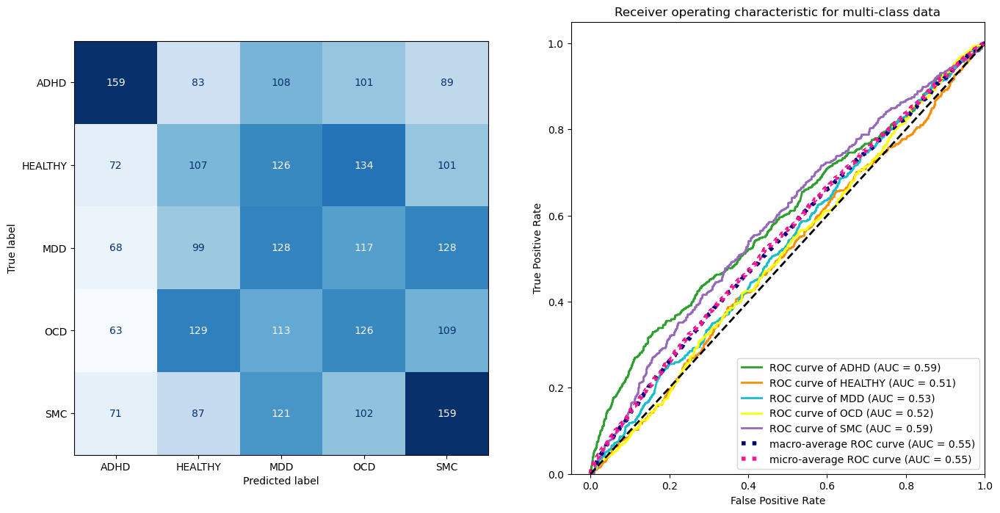

In [19]:
# final pipeline
best_params = {}
for hyperparameter in randsearch.best_params_:
    key = hyperparameter[5:]
    best_params[key] = randsearch.best_params_[hyperparameter]
print(best_params)

steps = [('col_trans', col_trans), ('pca', PCA()), ('gbc', GradientBoostingClassifier(**best_params))]
pipeline = Pipeline(steps)

# obtain predictions
Y_pred = cross_val_predict(pipeline, X, Y,  cv = cv_outer, groups = groups, n_jobs=-1, verbose=1)    
class_labels = le.inverse_transform(sorted(np.unique(Y)))
print('f1_score:', f1_score(Y, Y_pred, average = 'weighted', zero_division=0))
print()
print('classification report:\n', classification_report(Y, Y_pred, target_names=class_labels, zero_division=0))

# create subplots
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(16, 8))

# plot confusion matrix
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
conf_matrix = confusion_matrix(Y, Y_pred)
ConfusionMatrixDisplay(conf_matrix, display_labels = class_labels).plot(cmap = 'Blues', values_format = 'd', colorbar=False, ax=ax1)

# obtain proba predictions
Y_score = cross_val_predict(pipeline, X, Y,  cv = cv_outer, groups = groups, n_jobs=-1, verbose=1, method='predict_proba')

### plot ROC curves
from sklearn.metrics import roc_curve, auc
n_classes = Y_one_hot.shape[1]

fpr = dict()
tpr = dict()
roc_auc = dict()
lw=2


for i in range(n_classes):
    fpr[i], tpr[i], _ = roc_curve(Y_one_hot[:, i], Y_score[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])
colors = ['tab:green', 'darkorange', 'tab:cyan', 'yellow', 'tab:purple']
for i, color in zip(range(n_classes), colors):
    ax2.plot(fpr[i], tpr[i], color=color, lw=2,
             label=f'ROC curve of {class_labels[i]} (AUC = {roc_auc[i]:0.2f})')
    
## Compute macro-average ROC curve and AUC
fpr_grid = np.linspace(0.0, 1.0, 1000)

# Interpolate all ROC curves at these points
mean_tpr = np.zeros_like(fpr_grid)

for i in range(n_classes):
    mean_tpr += np.interp(fpr_grid, fpr[i], tpr[i])  # linear interpolation

# Average it and compute AUC
mean_tpr /= n_classes

fpr["macro"] = fpr_grid
tpr["macro"] = mean_tpr
roc_auc["macro"] = auc(fpr["macro"], tpr["macro"])
ax2.plot(
    fpr["macro"],
    tpr["macro"],
    label=f"macro-average ROC curve (AUC = {roc_auc['macro']:.2f})",
    color="navy",
    linestyle=":",
    linewidth=4,
)    
## Compute micro-average ROC curve and AUC
fpr["micro"], tpr["micro"], _ = roc_curve(Y_one_hot.ravel(), Y_score.ravel())
roc_auc["micro"] = auc(fpr["micro"], tpr["micro"])
ax2.plot(
    fpr["micro"],
    tpr["micro"],
    label=f"micro-average ROC curve (AUC = {roc_auc['micro']:.2f})",
    color="deeppink",
    linestyle=":",
    linewidth=4,
)


ax2.plot([0, 1], [0, 1], 'k--', lw=lw)
ax2.set_xlim([-0.05, 1.0])
ax2.set_ylim([0.0, 1.05])
ax2.set_xlabel('False Positive Rate')
ax2.set_ylabel('True Positive Rate')
ax2.set_title('Receiver operating characteristic for multi-class data')
ax2.legend(loc="lower right")
plt.show()

Checking feature importance

len(X) = 2700
X_train.shape = (2028, 60), X_test.shape = (672, 60), Y_train.shape = (2028,), Y_test.shape = (672,)


Text(0.5, 1.0, 'Difference between training - testing data')

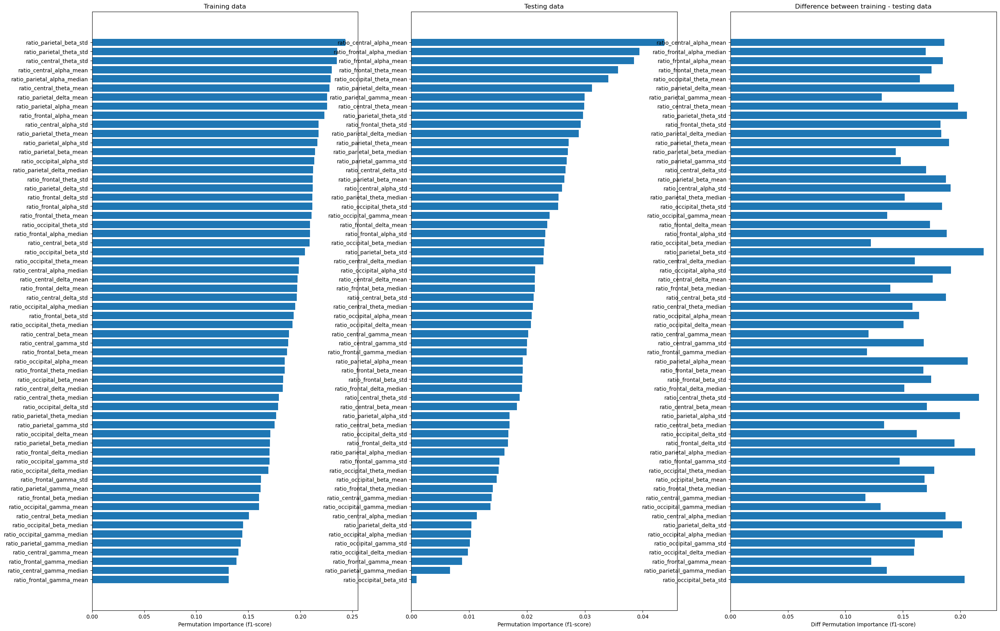

In [20]:
# using permutation_importance(), but according to literature it isn't a very reliable method for SVC with rbf kernel
from sklearn.inspection import permutation_importance

# splitting data into train and test set
desired_test_ratio = 0.25
n_splits = int(1 / desired_test_ratio) # for some reason (?), n_splits also determines the proportion between train & test indices
sgkf = StratifiedGroupKFold(n_splits=n_splits, shuffle=False)
train_idxs, test_idxs = sgkf.split(X, Y, groups).__next__() # just take the first split
print(f'{len(X) = }')

X_train = X.iloc[train_idxs]
X_test = X.iloc[test_idxs]
Y_train = Y[train_idxs]
Y_test = Y[test_idxs]
print(f'{X_train.shape = }, {X_test.shape = }, {Y_train.shape = }, {Y_test.shape = }')

# fit pipeline to training data
pipeline_fit = pipeline.fit(X_train, Y_train)
train_perm_importance = permutation_importance(pipeline_fit, X_train, Y_train,
                                    n_repeats=5, random_state=42,
                                    n_jobs=-1, scoring=f1_scorer)

train_sorted_idx = train_perm_importance.importances_mean.argsort()

fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(30, 20))
ax1.barh(X.columns[train_sorted_idx], train_perm_importance.importances_mean[train_sorted_idx])
ax1.set_xlabel("Permutation Importance (f1-score)")
ax1.set_title('Training data')

# fit pipeline to test data
test_perm_importance = permutation_importance(pipeline_fit, X_test, Y_test,
                                    n_repeats=5, random_state=42,
                                    n_jobs=-1, scoring=f1_scorer)

test_sorted_idx = test_perm_importance.importances_mean.argsort()
ax2.barh(X.columns[test_sorted_idx], test_perm_importance.importances_mean[test_sorted_idx])
ax2.set_xlabel("Permutation Importance (f1-score)")
ax2.set_title('Testing data')

# plot difference between training and testing permutation importance (im not entirely
# sure if the indices are the same for both test/train data, as the importances_mean attribute is just a numpy array)
diff = train_perm_importance.importances_mean - test_perm_importance.importances_mean
ax3.barh(X.columns[test_sorted_idx], diff[test_sorted_idx])
ax3.set_xlabel("Diff Permutation Importance (f1-score)")
ax3.set_title('Difference between training - testing data')

#### EC feature set

In [21]:
from sklearn.preprocessing import StandardScaler
from sklearn import metrics
from sklearn.model_selection import StratifiedGroupKFold, GridSearchCV, GroupShuffleSplit, RandomizedSearchCV
from sklearn.model_selection import train_test_split, cross_val_score, cross_val_predict, cross_validate
from sklearn.metrics import classification_report, confusion_matrix, f1_score, make_scorer, fbeta_score
from sklearn.metrics import make_scorer, accuracy_score, precision_score, recall_score, f1_score
from sklearn.pipeline import Pipeline, make_pipeline
from sklearn.impute import SimpleImputer
from sklearn import preprocessing
from sklearn.decomposition import PCA
from sklearn.compose import ColumnTransformer
from sklearn.ensemble import GradientBoostingClassifier
from scipy.stats import loguniform


# assign groups (IDs) for GroupKFold
groups = df_features_ec_nosk['ID'].tolist()
print(f'# of instances: {len(groups)}')

# define numeric columns
numeric_cols = []
for cond in ['EC']:
    for band in bands:
        for group in channel_groups:
            for stat in ['std', 'mean', 'median']:
                numeric_cols.append(f'{cond}_{group}_{band}_{stat}')
 
X = df_features_ec_nosk[numeric_cols]
Y = df_features_ec_nosk['diagnosis']

# label binarize diagnosis for ROC curve (alphabatic order by default)
# & label encode diagnosis for predictions
from sklearn import preprocessing
lb = preprocessing.LabelBinarizer()
Y_one_hot = lb.fit_transform(Y)
print(Y_one_hot.shape)
le = preprocessing.LabelEncoder()
Y = le.fit_transform(Y)

# preprocessing steps for numerical features
numeric_transformer = Pipeline(steps = [
    ('scaler', StandardScaler()), # standardization
    ('impute', SimpleImputer(strategy='mean')) # mean imputation
])

col_trans = ColumnTransformer(transformers=[
    ('numeric_transformer', numeric_transformer, numeric_cols)
    ],
    remainder='drop',
    n_jobs=-1)


# final pipeline
steps = [('col_trans', col_trans), ('pca', PCA()), ('gbc', GradientBoostingClassifier())]
pipeline = Pipeline(steps)

# define score metric
f1_scorer = make_scorer(fbeta_score, beta=1, average='weighted')

# define inner & outer CV objects
cv_inner = StratifiedGroupKFold(n_splits = 3, shuffle=False) # shuffle=False, so splits will be the same across calls (?)
cv_outer = StratifiedGroupKFold(n_splits = 5, shuffle=False) # shuffle=False, so splits will be the same across calls (?)

## Hyperparameters for RandomizedSearchCV
# Number of boosting stages to perform
n_estimators = [int(x) for x in np.linspace(start = 100, stop = 1000, num = 10)]
# Loss function to be optimized
loss = ['log_loss']
# Learning rate
learning_rate = loguniform.rvs(0.001, 0.1, size=1000)
# Fraction of samples to be used for fitting the individual base learners
subsample = [x for x in np.linspace(0.5, 1, 5)]
# The function to measure the quality of the split
criterion = ['friedman_mse']
# The min number of samples required to split an internal node
min_samples_split = [2, 5, 10]
# Create the random grid
random_grid = {'gbc__n_estimators': n_estimators,
               'gbc__loss': loss,
               'gbc__learning_rate': learning_rate,
               'gbc__subsample': subsample,
               'gbc__criterion': criterion,
               'gbc__min_samples_split': min_samples_split}

# define randomized search
randsearch = RandomizedSearchCV(pipeline,
                                param_distributions=random_grid,
                                n_iter=100, # 100
                                cv = cv_inner, # use inner cv for hyperparameter tuning
                                scoring = f1_scorer,
                                error_score = 'raise',
                                return_train_score = True,
                                n_jobs=-1,
                                verbose=1)

# non-nested CV for obtaining the propable best hyperparameters
randsearch_fit = randsearch.fit(X, Y, groups = groups)
print(f'Best parameters: {randsearch_fit.best_params_}')
print(f'Best f1-score: {randsearch_fit.best_score_}')

# nested CV with parameter optimization to compute testing score (f1-score)
gbc_test_score = cross_val_score(randsearch, # use unfitted gridsearch object, (idk if this matters)
                                 X = X, y = Y, 
                                 cv = cv_outer, # use outer cv for model evaluation
                                 groups = groups, 
                                 params={"groups": groups},
                                 scoring = f1_scorer,
                                 error_score = 'raise',
                                 verbose=1,
                                 n_jobs=-1)
print('GBC test scores:', gbc_test_score)
print('Mean GBC test score:', np.mean(gbc_test_score))


# of instances: 2700
(2700, 5)
Fitting 3 folds for each of 100 candidates, totalling 300 fits
Best parameters: {'gbc__subsample': 0.5, 'gbc__n_estimators': 100, 'gbc__min_samples_split': 5, 'gbc__loss': 'log_loss', 'gbc__learning_rate': 0.023513140483649938, 'gbc__criterion': 'friedman_mse'}
Best f1-score: 0.2849825657637744


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 30 concurrent workers.
/home/tsmolders/.conda/envs/py3117/lib/python3.11/site-packages/sklearn/utils/extmath.py:1144: RuntimeWarning: invalid value encountered in divide
  * (last_sum / last_over_new_count - new_sum) ** 2
/home/tsmolders/.conda/envs/py3117/lib/python3.11/site-packages/sklearn/utils/extmath.py:1144: RuntimeWarning: invalid value encountered in divide
  * (last_sum / last_over_new_count - new_sum) ** 2
/home/tsmolders/.conda/envs/py3117/lib/python3.11/site-packages/sklearn/utils/extmath.py:1144: RuntimeWarning: invalid value encountered in divide
  * (last_sum / last_over_new_count - new_sum) ** 2
/home/tsmolders/.conda/envs/py3117/lib/python3.11/site-packages/sklearn/utils/extmath.py:1144: RuntimeWarning: invalid value encountered in divide
  * (last_sum / last_over_new_count - new_sum) ** 2
/home/tsmolders/.conda/envs/py3117/lib/python3.11/site-packages/sklearn/utils/extmath.py:1144: RuntimeWarning: invalid value en

Fitting 3 folds for each of 100 candidates, totalling 300 fits
Fitting 3 folds for each of 100 candidates, totalling 300 fits
Fitting 3 folds for each of 100 candidates, totalling 300 fits
Fitting 3 folds for each of 100 candidates, totalling 300 fits
Fitting 3 folds for each of 100 candidates, totalling 300 fits
GBC test scores: [0.30998289 0.29490053 0.23340361 0.22459756 0.26301005]
Mean GBC test score: 0.2651789294763046


[Parallel(n_jobs=-1)]: Done   5 out of   5 | elapsed: 95.2min finished


In [22]:
# calculate std (CAREFUL: WAS CALCULATED AFTERWARDS, SO NUMBERS DO NOT UPDATE AUTOMATICALLY)
print(np.std([0.30998289, 0.29490053, 0.23340361, 0.22459756, 0.26301005]))

0.033322637743357836


{'subsample': 0.5, 'n_estimators': 100, 'min_samples_split': 5, 'loss': 'log_loss', 'learning_rate': 0.023513140483649938, 'criterion': 'friedman_mse'}


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 30 concurrent workers.
/home/tsmolders/.conda/envs/py3117/lib/python3.11/site-packages/joblib/externals/loky/process_executor.py:700: UserWarning: A worker stopped while some jobs were given to the executor. This can be caused by a too short worker timeout or by a memory leak.
  warnings.warn(
[Parallel(n_jobs=-1)]: Done   5 out of   5 | elapsed:   11.9s finished


f1_score: 0.27851186355216306

classification report:
               precision    recall  f1-score   support

        ADHD       0.38      0.27      0.31       540
     HEALTHY       0.30      0.33      0.32       540
         MDD       0.21      0.22      0.22       540
         OCD       0.21      0.22      0.22       540
         SMC       0.31      0.34      0.33       540

    accuracy                           0.28      2700
   macro avg       0.28      0.28      0.28      2700
weighted avg       0.28      0.28      0.28      2700



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 30 concurrent workers.
[Parallel(n_jobs=-1)]: Done   5 out of   5 | elapsed:   11.5s finished


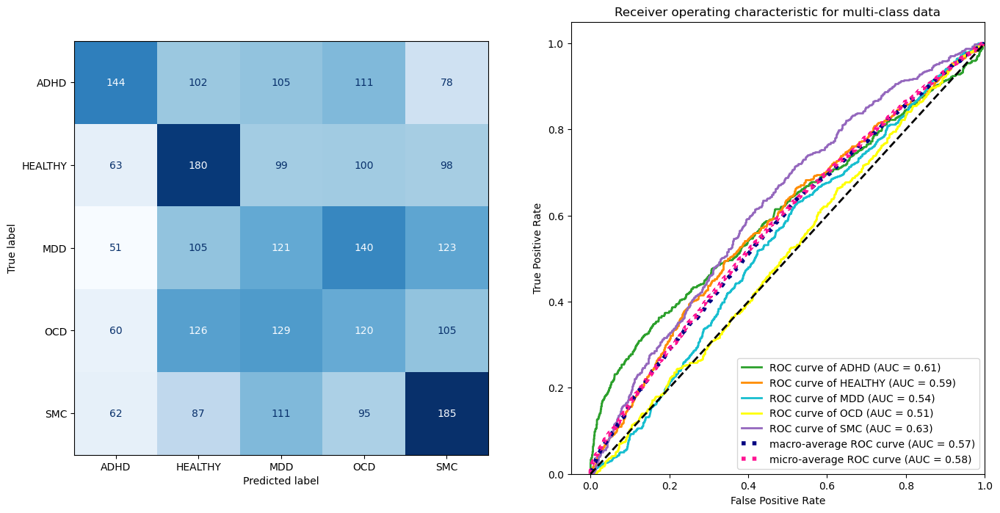

In [22]:
# final pipeline
best_params = {}
for hyperparameter in randsearch.best_params_:
    key = hyperparameter[5:]
    best_params[key] = randsearch.best_params_[hyperparameter]
print(best_params)

steps = [('col_trans', col_trans), ('pca', PCA()), ('gbc', GradientBoostingClassifier(**best_params))]
pipeline = Pipeline(steps)

# obtain predictions
Y_pred = cross_val_predict(pipeline, X, Y,  cv = cv_outer, groups = groups, n_jobs=-1, verbose=1)    
class_labels = le.inverse_transform(sorted(np.unique(Y)))
print('f1_score:', f1_score(Y, Y_pred, average = 'weighted', zero_division=0))
print()
print('classification report:\n', classification_report(Y, Y_pred, target_names=class_labels, zero_division=0))

# create subplots
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(16, 8))

# plot confusion matrix
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
conf_matrix = confusion_matrix(Y, Y_pred)
ConfusionMatrixDisplay(conf_matrix, display_labels = class_labels).plot(cmap = 'Blues', values_format = 'd', colorbar=False, ax=ax1)

# obtain proba predictions
Y_score = cross_val_predict(pipeline, X, Y,  cv = cv_outer, groups = groups, n_jobs=-1, verbose=1, method='predict_proba')

### plot ROC curves
from sklearn.metrics import roc_curve, auc
n_classes = Y_one_hot.shape[1]

fpr = dict()
tpr = dict()
roc_auc = dict()
lw=2


for i in range(n_classes):
    fpr[i], tpr[i], _ = roc_curve(Y_one_hot[:, i], Y_score[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])
colors = ['tab:green', 'darkorange', 'tab:cyan', 'yellow', 'tab:purple']
for i, color in zip(range(n_classes), colors):
    ax2.plot(fpr[i], tpr[i], color=color, lw=2,
             label=f'ROC curve of {class_labels[i]} (AUC = {roc_auc[i]:0.2f})')
    
## Compute macro-average ROC curve and AUC
fpr_grid = np.linspace(0.0, 1.0, 1000)

# Interpolate all ROC curves at these points
mean_tpr = np.zeros_like(fpr_grid)

for i in range(n_classes):
    mean_tpr += np.interp(fpr_grid, fpr[i], tpr[i])  # linear interpolation

# Average it and compute AUC
mean_tpr /= n_classes

fpr["macro"] = fpr_grid
tpr["macro"] = mean_tpr
roc_auc["macro"] = auc(fpr["macro"], tpr["macro"])
ax2.plot(
    fpr["macro"],
    tpr["macro"],
    label=f"macro-average ROC curve (AUC = {roc_auc['macro']:.2f})",
    color="navy",
    linestyle=":",
    linewidth=4,
)    
## Compute micro-average ROC curve and AUC
fpr["micro"], tpr["micro"], _ = roc_curve(Y_one_hot.ravel(), Y_score.ravel())
roc_auc["micro"] = auc(fpr["micro"], tpr["micro"])
ax2.plot(
    fpr["micro"],
    tpr["micro"],
    label=f"micro-average ROC curve (AUC = {roc_auc['micro']:.2f})",
    color="deeppink",
    linestyle=":",
    linewidth=4,
)


ax2.plot([0, 1], [0, 1], 'k--', lw=lw)
ax2.set_xlim([-0.05, 1.0])
ax2.set_ylim([0.0, 1.05])
ax2.set_xlabel('False Positive Rate')
ax2.set_ylabel('True Positive Rate')
ax2.set_title('Receiver operating characteristic for multi-class data')
ax2.legend(loc="lower right")
plt.show()

Checking feature importance

len(X) = 2700
X_train.shape = (2028, 60), X_test.shape = (672, 60), Y_train.shape = (2028,), Y_test.shape = (672,)


Text(0.5, 1.0, 'Difference between training - testing data')

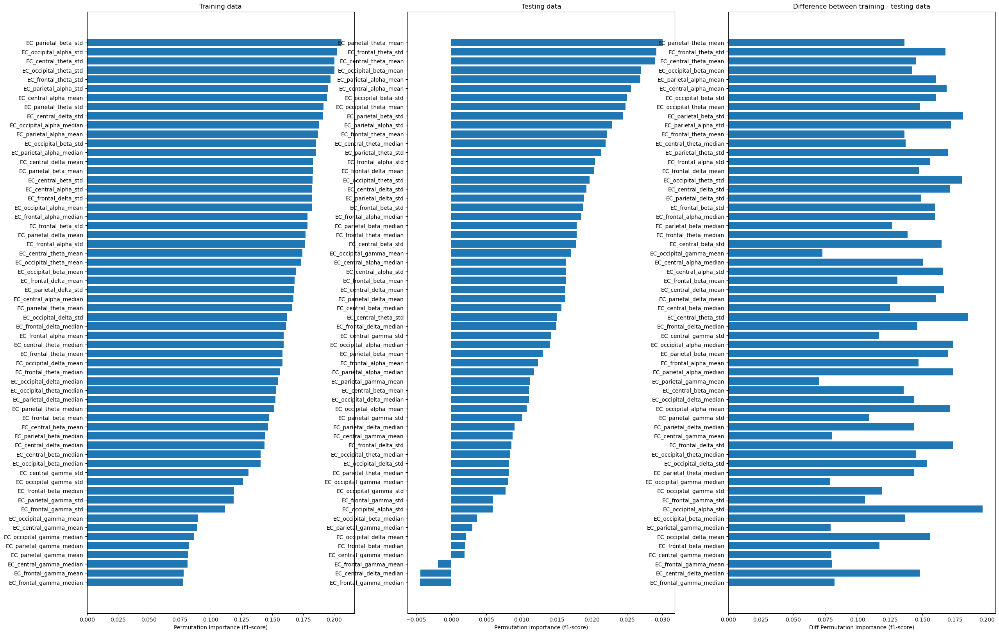

In [23]:
# using permutation_importance(), but according to literature it isn't a very reliable method for SVC with rbf kernel
from sklearn.inspection import permutation_importance

# splitting data into train and test set
desired_test_ratio = 0.25
n_splits = int(1 / desired_test_ratio) # for some reason (?), n_splits also determines the proportion between train & test indices
sgkf = StratifiedGroupKFold(n_splits=n_splits, shuffle=False)
train_idxs, test_idxs = sgkf.split(X, Y, groups).__next__() # just take the first split
print(f'{len(X) = }')

X_train = X.iloc[train_idxs]
X_test = X.iloc[test_idxs]
Y_train = Y[train_idxs]
Y_test = Y[test_idxs]
print(f'{X_train.shape = }, {X_test.shape = }, {Y_train.shape = }, {Y_test.shape = }')

# fit pipeline to training data
pipeline_fit = pipeline.fit(X_train, Y_train)
train_perm_importance = permutation_importance(pipeline_fit, X_train, Y_train,
                                    n_repeats=5, random_state=42,
                                    n_jobs=-1, scoring=f1_scorer)

train_sorted_idx = train_perm_importance.importances_mean.argsort()

fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(30, 20))
ax1.barh(X.columns[train_sorted_idx], train_perm_importance.importances_mean[train_sorted_idx])
ax1.set_xlabel("Permutation Importance (f1-score)")
ax1.set_title('Training data')

# fit pipeline to test data
test_perm_importance = permutation_importance(pipeline_fit, X_test, Y_test,
                                    n_repeats=5, random_state=42,
                                    n_jobs=-1, scoring=f1_scorer)

test_sorted_idx = test_perm_importance.importances_mean.argsort()
ax2.barh(X.columns[test_sorted_idx], test_perm_importance.importances_mean[test_sorted_idx])
ax2.set_xlabel("Permutation Importance (f1-score)")
ax2.set_title('Testing data')

# plot difference between training and testing permutation importance (im not entirely
# sure if the indices are the same for both test/train data, as the importances_mean attribute is just a numpy array)
diff = train_perm_importance.importances_mean - test_perm_importance.importances_mean
ax3.barh(X.columns[test_sorted_idx], diff[test_sorted_idx])
ax3.set_xlabel("Diff Permutation Importance (f1-score)")
ax3.set_title('Difference between training - testing data')

#### EO feature set

In [24]:
from sklearn.preprocessing import StandardScaler
from sklearn import metrics
from sklearn.model_selection import StratifiedGroupKFold, GridSearchCV, GroupShuffleSplit, RandomizedSearchCV
from sklearn.model_selection import train_test_split, cross_val_score, cross_val_predict, cross_validate
from sklearn.metrics import classification_report, confusion_matrix, f1_score, make_scorer, fbeta_score
from sklearn.metrics import make_scorer, accuracy_score, precision_score, recall_score, f1_score
from sklearn.pipeline import Pipeline, make_pipeline
from sklearn.impute import SimpleImputer
from sklearn import preprocessing
from sklearn.decomposition import PCA
from sklearn.compose import ColumnTransformer
from sklearn.ensemble import GradientBoostingClassifier
from scipy.stats import loguniform


# assign groups (IDs) for GroupKFold
groups = df_features_eo_nosk['ID'].tolist()
print(f'# of instances: {len(groups)}')

# define numeric columns
numeric_cols = []
for cond in ['EO']:
    for band in bands:
        for group in channel_groups:
            for stat in ['std', 'mean', 'median']:
                numeric_cols.append(f'{cond}_{group}_{band}_{stat}')
 
X = df_features_eo_nosk[numeric_cols]
Y = df_features_eo_nosk['diagnosis']

# label binarize diagnosis for ROC curve (alphabatic order by default)
# & label encode diagnosis for predictions
from sklearn import preprocessing
lb = preprocessing.LabelBinarizer()
Y_one_hot = lb.fit_transform(Y)
print(Y_one_hot.shape)
le = preprocessing.LabelEncoder()
Y = le.fit_transform(Y)

# preprocessing steps for numerical features
numeric_transformer = Pipeline(steps = [
    ('scaler', StandardScaler()), # standardization
    ('impute', SimpleImputer(strategy='mean')) # mean imputation
])

col_trans = ColumnTransformer(transformers=[
    ('numeric_transformer', numeric_transformer, numeric_cols)
    ],
    remainder='drop',
    n_jobs=-1)


# final pipeline
steps = [('col_trans', col_trans), ('pca', PCA()), ('gbc', GradientBoostingClassifier())]
pipeline = Pipeline(steps)

# define score metric
f1_scorer = make_scorer(fbeta_score, beta=1, average='weighted')

# define inner & outer CV objects
cv_inner = StratifiedGroupKFold(n_splits = 3, shuffle=False) # shuffle=False, so splits will be the same across calls (?)
cv_outer = StratifiedGroupKFold(n_splits = 5, shuffle=False) # shuffle=False, so splits will be the same across calls (?)

## Hyperparameters for RandomizedSearchCV
# Number of boosting stages to perform
n_estimators = [int(x) for x in np.linspace(start = 100, stop = 1000, num = 10)]
# Loss function to be optimized
loss = ['log_loss']
# Learning rate
learning_rate = loguniform.rvs(0.001, 0.1, size=1000)
# Fraction of samples to be used for fitting the individual base learners
subsample = [x for x in np.linspace(0.5, 1, 5)]
# The function to measure the quality of the split
criterion = ['friedman_mse']
# The min number of samples required to split an internal node
min_samples_split = [2, 5, 10]
# Create the random grid
random_grid = {'gbc__n_estimators': n_estimators,
               'gbc__loss': loss,
               'gbc__learning_rate': learning_rate,
               'gbc__subsample': subsample,
               'gbc__criterion': criterion,
               'gbc__min_samples_split': min_samples_split}

# define randomized search
randsearch = RandomizedSearchCV(pipeline,
                                param_distributions=random_grid,
                                n_iter=100, # 100
                                cv = cv_inner, # use inner cv for hyperparameter tuning
                                scoring = f1_scorer,
                                error_score = 'raise',
                                return_train_score = True,
                                n_jobs=-1,
                                verbose=1)

# non-nested CV for obtaining the propable best hyperparameters
randsearch_fit = randsearch.fit(X, Y, groups = groups)
print(f'Best parameters: {randsearch_fit.best_params_}')
print(f'Best f1-score: {randsearch_fit.best_score_}')

# nested CV with parameter optimization to compute testing score (f1-score)
gbc_test_score = cross_val_score(randsearch, # use unfitted gridsearch object, (idk if this matters)
                                 X = X, y = Y, 
                                 cv = cv_outer, # use outer cv for model evaluation
                                 groups = groups, 
                                 params={"groups": groups},
                                 scoring = f1_scorer,
                                 error_score = 'raise',
                                 verbose=1,
                                 n_jobs=-1)
print('GBC test scores:', gbc_test_score)
print('Mean GBC test score:', np.mean(gbc_test_score))


# of instances: 2700
(2700, 5)
Fitting 3 folds for each of 100 candidates, totalling 300 fits
Best parameters: {'gbc__subsample': 0.5, 'gbc__n_estimators': 700, 'gbc__min_samples_split': 10, 'gbc__loss': 'log_loss', 'gbc__learning_rate': 0.0030103734831066925, 'gbc__criterion': 'friedman_mse'}
Best f1-score: 0.30181274959714777


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 30 concurrent workers.
/home/tsmolders/.conda/envs/py3117/lib/python3.11/site-packages/sklearn/utils/extmath.py:1144: RuntimeWarning: invalid value encountered in divide
  * (last_sum / last_over_new_count - new_sum) ** 2
/home/tsmolders/.conda/envs/py3117/lib/python3.11/site-packages/sklearn/utils/extmath.py:1144: RuntimeWarning: invalid value encountered in divide
  * (last_sum / last_over_new_count - new_sum) ** 2
/home/tsmolders/.conda/envs/py3117/lib/python3.11/site-packages/sklearn/utils/extmath.py:1144: RuntimeWarning: invalid value encountered in divide
  * (last_sum / last_over_new_count - new_sum) ** 2
/home/tsmolders/.conda/envs/py3117/lib/python3.11/site-packages/sklearn/utils/extmath.py:1144: RuntimeWarning: invalid value encountered in divide
  * (last_sum / last_over_new_count - new_sum) ** 2
/home/tsmolders/.conda/envs/py3117/lib/python3.11/site-packages/sklearn/utils/extmath.py:1144: RuntimeWarning: invalid value en

Fitting 3 folds for each of 100 candidates, totalling 300 fits
Fitting 3 folds for each of 100 candidates, totalling 300 fits
Fitting 3 folds for each of 100 candidates, totalling 300 fits
Fitting 3 folds for each of 100 candidates, totalling 300 fits
Fitting 3 folds for each of 100 candidates, totalling 300 fits
GBC test scores: [0.322463   0.29042643 0.25841855 0.24930997 0.27212361]
Mean GBC test score: 0.2785483122451803


[Parallel(n_jobs=-1)]: Done   5 out of   5 | elapsed: 93.9min finished


In [24]:
# calculate std (CAREFUL: WAS CALCULATED AFTERWARDS, SO NUMBERS DO NOT UPDATE AUTOMATICALLY)
print(np.std([0.322463, 0.29042643, 0.25841855, 0.24930997, 0.27212361]))

0.025965185407517043


{'subsample': 0.5, 'n_estimators': 700, 'min_samples_split': 10, 'loss': 'log_loss', 'learning_rate': 0.0030103734831066925, 'criterion': 'friedman_mse'}


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 30 concurrent workers.
/home/tsmolders/.conda/envs/py3117/lib/python3.11/site-packages/joblib/externals/loky/process_executor.py:700: UserWarning: A worker stopped while some jobs were given to the executor. This can be caused by a too short worker timeout or by a memory leak.
  warnings.warn(
[Parallel(n_jobs=-1)]: Done   5 out of   5 | elapsed:  1.3min finished


f1_score: 0.2886032098474761

classification report:
               precision    recall  f1-score   support

        ADHD       0.42      0.36      0.39       540
     HEALTHY       0.28      0.28      0.28       540
         MDD       0.23      0.19      0.20       540
         OCD       0.26      0.26      0.26       540
         SMC       0.28      0.36      0.31       540

    accuracy                           0.29      2700
   macro avg       0.29      0.29      0.29      2700
weighted avg       0.29      0.29      0.29      2700



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 30 concurrent workers.
[Parallel(n_jobs=-1)]: Done   5 out of   5 | elapsed:  1.3min finished


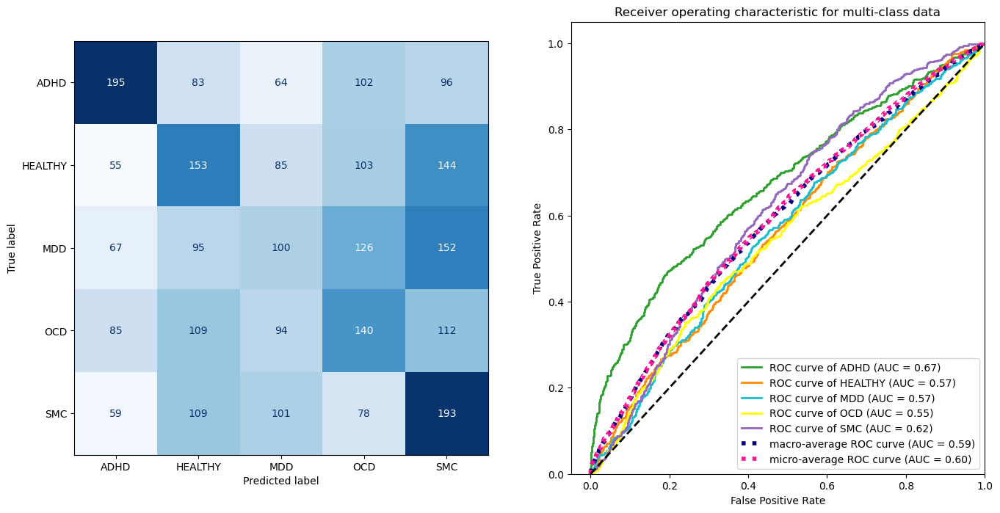

In [25]:
# final pipeline
best_params = {}
for hyperparameter in randsearch.best_params_:
    key = hyperparameter[5:]
    best_params[key] = randsearch.best_params_[hyperparameter]
print(best_params)

steps = [('col_trans', col_trans), ('pca', PCA()), ('gbc', GradientBoostingClassifier(**best_params))]
pipeline = Pipeline(steps)

# obtain predictions
Y_pred = cross_val_predict(pipeline, X, Y,  cv = cv_outer, groups = groups, n_jobs=-1, verbose=1)    
class_labels = le.inverse_transform(sorted(np.unique(Y)))
print('f1_score:', f1_score(Y, Y_pred, average = 'weighted', zero_division=0))
print()
print('classification report:\n', classification_report(Y, Y_pred, target_names=class_labels, zero_division=0))

# create subplots
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(16, 8))

# plot confusion matrix
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
conf_matrix = confusion_matrix(Y, Y_pred)
ConfusionMatrixDisplay(conf_matrix, display_labels = class_labels).plot(cmap = 'Blues', values_format = 'd', colorbar=False, ax=ax1)

# obtain proba predictions
Y_score = cross_val_predict(pipeline, X, Y,  cv = cv_outer, groups = groups, n_jobs=-1, verbose=1, method='predict_proba')

### plot ROC curves
from sklearn.metrics import roc_curve, auc
n_classes = Y_one_hot.shape[1]

fpr = dict()
tpr = dict()
roc_auc = dict()
lw=2


for i in range(n_classes):
    fpr[i], tpr[i], _ = roc_curve(Y_one_hot[:, i], Y_score[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])
colors = ['tab:green', 'darkorange', 'tab:cyan', 'yellow', 'tab:purple']
for i, color in zip(range(n_classes), colors):
    ax2.plot(fpr[i], tpr[i], color=color, lw=2,
             label=f'ROC curve of {class_labels[i]} (AUC = {roc_auc[i]:0.2f})')
    
## Compute macro-average ROC curve and AUC
fpr_grid = np.linspace(0.0, 1.0, 1000)

# Interpolate all ROC curves at these points
mean_tpr = np.zeros_like(fpr_grid)

for i in range(n_classes):
    mean_tpr += np.interp(fpr_grid, fpr[i], tpr[i])  # linear interpolation

# Average it and compute AUC
mean_tpr /= n_classes

fpr["macro"] = fpr_grid
tpr["macro"] = mean_tpr
roc_auc["macro"] = auc(fpr["macro"], tpr["macro"])
ax2.plot(
    fpr["macro"],
    tpr["macro"],
    label=f"macro-average ROC curve (AUC = {roc_auc['macro']:.2f})",
    color="navy",
    linestyle=":",
    linewidth=4,
)    
## Compute micro-average ROC curve and AUC
fpr["micro"], tpr["micro"], _ = roc_curve(Y_one_hot.ravel(), Y_score.ravel())
roc_auc["micro"] = auc(fpr["micro"], tpr["micro"])
ax2.plot(
    fpr["micro"],
    tpr["micro"],
    label=f"micro-average ROC curve (AUC = {roc_auc['micro']:.2f})",
    color="deeppink",
    linestyle=":",
    linewidth=4,
)


ax2.plot([0, 1], [0, 1], 'k--', lw=lw)
ax2.set_xlim([-0.05, 1.0])
ax2.set_ylim([0.0, 1.05])
ax2.set_xlabel('False Positive Rate')
ax2.set_ylabel('True Positive Rate')
ax2.set_title('Receiver operating characteristic for multi-class data')
ax2.legend(loc="lower right")
plt.show()

Checking feature importance

len(X) = 2700
X_train.shape = (2028, 60), X_test.shape = (672, 60), Y_train.shape = (2028,), Y_test.shape = (672,)


Text(0.5, 1.0, 'Difference between training - testing data')

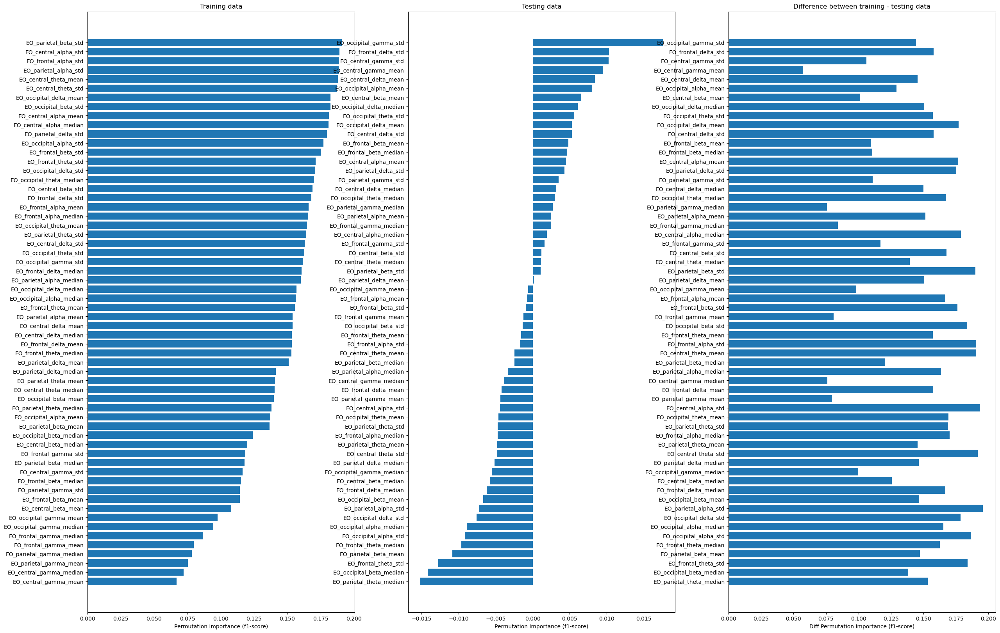

In [26]:
# using permutation_importance(), but according to literature it isn't a very reliable method for SVC with rbf kernel
from sklearn.inspection import permutation_importance

# splitting data into train and test set
desired_test_ratio = 0.25
n_splits = int(1 / desired_test_ratio) # for some reason (?), n_splits also determines the proportion between train & test indices
sgkf = StratifiedGroupKFold(n_splits=n_splits, shuffle=False)
train_idxs, test_idxs = sgkf.split(X, Y, groups).__next__() # just take the first split
print(f'{len(X) = }')

X_train = X.iloc[train_idxs]
X_test = X.iloc[test_idxs]
Y_train = Y[train_idxs]
Y_test = Y[test_idxs]
print(f'{X_train.shape = }, {X_test.shape = }, {Y_train.shape = }, {Y_test.shape = }')

# fit pipeline to training data
pipeline_fit = pipeline.fit(X_train, Y_train)
train_perm_importance = permutation_importance(pipeline_fit, X_train, Y_train,
                                    n_repeats=5, random_state=42,
                                    n_jobs=-1, scoring=f1_scorer)

train_sorted_idx = train_perm_importance.importances_mean.argsort()

fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(30, 20))
ax1.barh(X.columns[train_sorted_idx], train_perm_importance.importances_mean[train_sorted_idx])
ax1.set_xlabel("Permutation Importance (f1-score)")
ax1.set_title('Training data')

# fit pipeline to test data
test_perm_importance = permutation_importance(pipeline_fit, X_test, Y_test,
                                    n_repeats=5, random_state=42,
                                    n_jobs=-1, scoring=f1_scorer)

test_sorted_idx = test_perm_importance.importances_mean.argsort()
ax2.barh(X.columns[test_sorted_idx], test_perm_importance.importances_mean[test_sorted_idx])
ax2.set_xlabel("Permutation Importance (f1-score)")
ax2.set_title('Testing data')

# plot difference between training and testing permutation importance (im not entirely
# sure if the indices are the same for both test/train data, as the importances_mean attribute is just a numpy array)
diff = train_perm_importance.importances_mean - test_perm_importance.importances_mean
ax3.barh(X.columns[test_sorted_idx], diff[test_sorted_idx])
ax3.set_xlabel("Diff Permutation Importance (f1-score)")
ax3.set_title('Difference between training - testing data')